<a href="https://colab.research.google.com/github/hruday377363/NIT-PROJECT/blob/main/Nit_project_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from transformers import pipeline

#---------- emotion dictionary ---------------------------------------------------------------------------------------------------------------------------------
def add_emotion_dictionary(df):
    classifier = pipeline("text-classification", model='bhadresh-savani/distilbert-base-uncased-emotion', return_all_scores=True)

    emotions_preds = [ { pred['label']:pred['score'] for pred in classifier( t )[0] } for t in df['text'] ]
    df['emotion_dict'] = emotions_preds

    return df

def add_emotionNscore(df):
    emotion_dom = []
    emotion_score = []
    progress_bar = tqdm.tqdm(range(df.shape[0]))
    for i,row in df.iterrows():
        em_dict = row['emotion_dict']
        emotion_dom.append(max(em_dict, key=em_dict.get))
        emotion_score.append(max(em_dict.values()))
        progress_bar.update(1)

    df['emotion'] = emotion_dom
    df['emotion_score'] = emotion_score
    return df


# add_emotion_dictionary(train_df)
# add_emotion_dictionary(test_df)

# add_emotionNscore(train_df)
# add_emotionNscore(test_df)

# train_df.to_csv(os.path.join(file_store_dir,"stressTrain.csv"),  index = False, header=True)
# test_df.to_csv(os.path.join(file_store_dir,"stressTest.csv"),  index = False, header=True)


#---------- depression dictionary ------------------------------------------------------------------------------------------------------------------------
def add_depression_dictionary(df):
    classifier = pipeline("text-classification", model="paulagarciaserrano/roberta-depression-detection", return_all_scores=True)

    depression_preds = [ { pred['label']:pred['score'] for pred in classifier( t )[0] } for t in df['text'] ]
    df['depression_dict'] = depression_preds



def add_depressionNscore(df):
    depression_dom = []
    depression_score = []
    progress_bar = tqdm.tqdm(range(df.shape[0]))
    for i,row in df.iterrows():
        depr_dict = row['depression_dict']
        depression_dom.append(max(depr_dict, key=depr_dict.get))
        depression_score.append(max(depr_dict.values()))
        progress_bar.update(1)

    df['depression'] = depression_dom
    df['depression_score'] = depression_score


# add_depression_dictionary(train_df)
# add_depressionNscore(train_df)

# add_depression_dictionary(test_df)
# add_depressionNscore(test_df)

# train_df.to_csv(os.path.join(file_store_dir,"stressTrainEmDepr.csv"),  index = False, header=True)
# test_df.to_csv(os.path.join(file_store_dir,"stressTestEmDepr.csv"),  index = False, header=True)


#---------- data visualization ------------------------------------------------------------------------------------------------------------------------
def data_vis(file_store_dir, train_df, test_df):
    plot_dir = os.path.join(file_store_dir,"figures")
    if not os.path.exists(plot_dir):
        os.makedirs(plot_dir)

    # plt.clf()
    df=train_df.groupby(['subreddit']).size()
    # df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    plt.xticks(rotation=45)
    plt.savefig(os.path.join(plot_dir,"subreddits.png"), dpi=300)

    # plt.clf()
    df=train_df.groupby(['subreddit',"label"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    plt.legend(["No stress", "Stress"])
    plt.xticks(rotation=45)
    plt.savefig(os.path.join(plot_dir,"subredditsLabel.png"), dpi=300)

    # plt.clf()
    df=train_df.groupby(['emotion',"label"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    plt.legend(["No stress", "Stress"])
    plt.xticks(rotation=0)
    plt.savefig(os.path.join(plot_dir,"emotionLabel.png"), dpi=300)


    df=train_df.groupby(['subreddit',"emotion"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    # plt.legend(["joy", "love", "anger", "sadness", "fear", "surprise" ])
    plt.xticks(rotation=45)
    plt.savefig(os.path.join(plot_dir,"subredditEmotion.png"), dpi=300)


    df=train_df.groupby(['label',"emotion"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    # plt.legend(["joy", "love", "anger", "sadness", "fear", "surprise" ])
    plt.xticks([0,1],["no stress", "stress"], rotation=0)
    plt.savefig(os.path.join(plot_dir,"labelEmotion.png"), dpi=300)


    df=train_df.groupby(['depression',"emotion"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    # plt.legend(["joy", "love", "anger", "sadness", "fear", "surprise" ])
    plt.xticks([0,1,2],["moderate", "not depression", "severe"], rotation=0)
    plt.savefig(os.path.join(plot_dir,"depressionEmotion"), dpi=300)


    plt.clf()
    df1 = train_df[train_df['label'] == 0]
    df2 = train_df[train_df['label'] == 1]

    ax = df1.plot(x='emotion', y='emotion_score', kind='scatter', c='g', label='Not stressed', figsize=(15,12))
    df2.plot(x='emotion', y='emotion_score', kind='scatter', ax=ax, c='r', label='Stressed')
    ax.hlines(.5, -0.2,5.2, linestyles='dashed')
    ax.annotate('threshold',(-0.4,0.51))
    plt.show()


    df1 = train_df[train_df['emotion'] == "joy"]
    df2 = train_df[train_df['emotion'] == "love"]
    df3 = train_df[train_df['emotion'] == "anger"]
    df4 = train_df[train_df['emotion'] == "sadness"]
    df5 = train_df[train_df['emotion'] == "fear"]
    df6 = train_df[train_df['emotion'] == "surprise"]


    x_col = 'lex_liwc_negemo'
    y_col = 'lex_liwc_posemo'

    ax = df1.plot(x=x_col, y=y_col, kind='scatter', c='g', label='joy', figsize=(15,12))
    df2.plot(x=x_col, y=y_col, kind='scatter', ax=ax, c='m', label='love')
    df3.plot(x=x_col, y=y_col, kind='scatter', ax=ax, c='r', label='anger')
    df4.plot(x=x_col, y=y_col, kind='scatter', ax=ax, c='b', label='sadness')
    df5.plot(x=x_col, y=y_col, kind='scatter', ax=ax, c='c', label='fear')
    df6.plot(x=x_col, y=y_col, kind='scatter', ax=ax, c='y', label='surprise')

    plt.show()


    # plt.savefig(os.path.join(plot_dir,"emotionEmScore.png"), dpi=300)


    # df=train_df.groupby(['subreddit']).size()
    # # df=df.unstack()
    # df.plot(kind='bar', figsize=(15,8))
    # plt.savefig(os.path.join(file_store_dir,"subreddits.png"), dpi=300)

    t_df = train_df

    df=t_df[t_df["label"]==0].groupby(['subreddit',"emotion"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    # plt.legend(["joy", "love", "anger", "sadness", "fear", "surprise" ])
    plt.xticks(rotation=45)
    plt.savefig(os.path.join("./subredditEmotion_label_0.png"), dpi=300)
    plt.title("Not stressed")
#     plt.show()


    df=t_df[t_df["label"]==1].groupby(['subreddit',"emotion"]).size()
    df=df.unstack()
    df.plot(kind='bar', figsize=(15,8))
    # plt.legend(["joy", "love", "anger", "sadness", "fear", "surprise" ])
    plt.xticks(rotation=45)
    plt.savefig(os.path.join("./subredditEmotion_label_1.png"), dpi=300)
    plt.title("Stressed")
#     plt.show()



# columns_to_file(train_df,file_store_dir)
# !cat ./results/columns.txt

In [2]:
import pandas as pd
import os


In [4]:
dataset_train_embs = "stressTrainEmDep_BERTnWord2Vec_text.csv"
dataset_test_embs = "stressTestEmDep_BERTnWord2Vec_text.csv"

if not os.path.exists(dataset_train_embs):
    !gdown 19ZMTk5ZwmyL_eVVhXGC_kAdFTReu25Nm
    !gdown 1XcaYJ78vXov-yhyBFDUWx2rH7DbeKx5k

train_df = pd.read_csv(dataset_train_embs)
test_df = pd.read_csv(dataset_test_embs)





In [5]:
#---------- RESULTS FILE DIRECTORY ----------------------------------------------------------------------

file_store_dir="results"

In [6]:
!pip install -U huggingface_hub
!pip install gensim
!pip install nltk
!pip install gdown

# modules
import pandas as pd
import os
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
import tqdm
import numpy as np
from numpy import mean
from numpy import std
import evaluate
metric = evaluate.load("accuracy")

import random
from IPython.display import FileLink, FileLinks

import torch
from torch.utils.data import DataLoader, RandomSampler, TensorDataset

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam, SGD
from transformers import pipeline

import transformers
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer, AutoTokenizer, AutoModel, BertTokenizer, BertModel

from keras import backend as K
from keras import Model
from keras.models import Sequential
from keras.layers import Input, Embedding, LSTM, Dense, Dropout, concatenate, Bidirectional, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D, GlobalMaxPool1D, GRU
from keras.layers import GRU


from keras.preprocessing import sequence
from scikeras.wrappers import KerasClassifier



from keras.callbacks import CSVLogger

from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc

import warnings
warnings.filterwarnings(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

piplist = !pip freeze
if not ( "GPUtil" in " ".join([ p for p in piplist ]) ):
    !pip install GPUtil
    print("\n\n")
from GPUtil import showUtilization as gpu_usage
import gc
from numba import cuda


# output dir
if not os.path.exists(file_store_dir):
    os.makedirs(file_store_dir)



#Importing librariesfrom nltk.tokenize import sent_tokenize, word_tokenize
import gensim
from gensim.models import Word2Vec, KeyedVectors

In [5]:
!pip install scikeras
!pip install evaluate
from keras.utils import to_categorical


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 13.1 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [7]:
!pip install tensorflow==2.15.0
!pip install tensorflow-addons



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 49.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.8 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 11.0 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.4.1
    Uninstalling typeguard-4.4.1:
      Successfully uninstalled typeguard-4.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.4.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.


In [31]:

#---------- CLASSIFICATION ALGORITHMS -----------------------------------------------------------------------------------------

def LR_classification(file_store_dir, trainX, trainY, testX, testY, feats):
    # among several small values, 0.001 was the one optimizing the results - quicker convergence, higher scores
    C=5e-5
    # scaling="Standard"
    # LR = make_pipeline(StandardScaler(),LogisticRegression(C=C, solver="lbfgs", max_iter=1000 ))
    # scaling="Normal"
    # LR = make_pipeline(MinMaxScaler(),LogisticRegression(C=C, solver="lbfgs", max_iter=1000 ))
    scaling="noScaling"
    LR = LogisticRegression(C=C, solver="lbfgs", max_iter=1000 )
    LR.fit(trainX, trainY)
    LR_scores_precision = evaluate_model_precision(LR, testX, testY)
    LR_scores_recall = evaluate_model_recall(LR, testX, testY)
    LR_scores_f1 = evaluate_model_f1(LR, testX, testY)

    scores = f'\n> Logistic Regression (C: {C})\nmean F1: {mean(LR_scores_f1):.6f} | mean Precision: {mean(LR_scores_precision):.6f} | mean Recall: {mean(LR_scores_recall):.6f}\nstd F1: {std(LR_scores_f1):.6f} | std Precision: {std(LR_scores_precision):.6f} | std Recall: {std(LR_scores_recall):.6f}'

    y_pred = LR.predict(testX)
    log_str = scores+"\n\n"+classification_report(testY, y_pred)+"\n\n"+str(LR.get_params())
    print(log_str)

    log_dir = os.path.join(file_store_dir,"LogisticRegression")
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    log_path = os.path.join(log_dir,f"LR_{scaling}_{feats}.txt")
    with open(log_path,"w",encoding="utf-8") as log_writer:
        log_writer.write(log_str)

    return LR

def KNN_classification(file_store_dir, trainX, trainY, testX, testY, feats):
    # among several values, 5 was the one optimizing the results
    k_n=5
    # scaling="Standard"
    # KNN = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=k_n))
    # scaling="Normal"
    # KNN = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k_n))
    scaling="noScaling"
    KNN = KNeighborsClassifier(n_neighbors=k_n)
    KNN.fit(trainX, trainY)
    KNN_scores_precision = evaluate_model_precision(KNN, testX, testY)
    KNN_scores_recall = evaluate_model_recall(KNN, testX, testY)
    KNN_scores_f1 = evaluate_model_f1(KNN, testX, testY)

    scores = f'\n> k Nearest Neighbor (n_neighbors:{k_n}) \nmean F1: {mean(KNN_scores_f1):.6f} | mean Precision: {mean(KNN_scores_precision):.6f} | mean Recall: {mean(KNN_scores_recall):.6f}\nstd F1: {std(KNN_scores_f1):.6f} | std Precision: {std(KNN_scores_precision):.6f} | std Recall: {std(KNN_scores_recall):.6f}'

    y_pred = KNN.predict(testX)
    log_str = scores+"\n\n"+classification_report(testY, y_pred)+"\n\n"+str(KNN.get_params())
    print(log_str)

    log_dir = os.path.join(file_store_dir,"KNearestNeighbors")
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    log_path = os.path.join(log_dir,f"KNN_{scaling}_{feats}.txt")
    with open(log_path,"w",encoding="utf-8") as log_writer:
        log_writer.write(log_str)

    return KNN

def SVM_classification(file_store_dir, trainX, trainY, testX, testY, feats):
    C=1.0
    kernel="rbf"
    # scaling="Standard"
    # SVM = make_pipeline(StandardScaler(),SVC(C=C, kernel=kernel))
    # scaling="Normal"
    # SVM = make_pipeline(MinMaxScaler(),SVC(C=C, kernel=kernel))
    scaling="NoScaling"
    SVM = SVC(C=C, kernel=kernel,probability=True)
    SVM.fit(trainX, trainY)
    SVM_scores_precision = evaluate_model_precision(SVM, testX, testY)
    SVM_scores_recall = evaluate_model_recall(SVM, testX, testY)
    SVM_scores_f1 = evaluate_model_f1(SVM, testX, testY)

    scores = f'\n> Support Vector Machine (C: {C}) \nmean F1: {mean(SVM_scores_f1):.6f} | mean Precision: {mean(SVM_scores_precision):.6f} | mean Recall: {mean(SVM_scores_recall):.6f}\nstd F1: {std(SVM_scores_f1):.6f} | std Precision: {std(SVM_scores_precision):.6f} | std Recall: {std(SVM_scores_recall):.6f}'

    y_pred = SVM.predict(testX)
    log_str = scores+"\n\n"+classification_report(testY, y_pred)+"\n\n"+str(SVM.get_params())
    print(log_str)

    log_dir = os.path.join(file_store_dir,"SupportVectorMachine")
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    log_path = os.path.join(log_dir,f"SVM_{scaling}_{feats}.txt")
    with open(log_path,"w",encoding="utf-8") as log_writer:
        log_writer.write(log_str)

    return SVM

def RF_classification(file_store_dir, trainX, trainY, testX, testY, feats):
    n_estimators = 100
    scaling="Standard"
    RF = make_pipeline(StandardScaler(),RandomForestClassifier(n_estimators=n_estimators))
    # scaling="Normal"
    # RF = make_pipeline(MinMaxScaler(),RandomForestClassifier(n_estimators=n_estimators))
    # scaling="NoScaling"
    # RF = RandomForestClassifier(n_estimators=n_estimators)
    RF.fit(trainX, trainY)
    RF_scores_precision = evaluate_model_precision(RF, testX, testY)
    RF_scores_recall = evaluate_model_recall(RF, testX, testY)
    RF_scores_f1 = evaluate_model_f1(RF, testX, testY)

    scores = f'\n> Random Forest \nmean F1: {mean(RF_scores_f1):.6f} | mean Precision: {mean(RF_scores_precision):.6f} | mean Recall: {mean(RF_scores_recall):.6f}\nstd F1: {std(RF_scores_f1):.6f} | std Precision: {std(RF_scores_precision):.6f} | std Recall: {std(RF_scores_recall):.6f}'

    y_pred = RF.predict(testX)
    log_str = scores+"\n\n"+classification_report(testY, y_pred)+"\n\n"+str(RF.get_params())
    print(log_str)

    log_dir = os.path.join(file_store_dir,"RandomForest")
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    log_path = os.path.join(log_dir,f"RF_{scaling}_{feats}.txt")
    with open(log_path,"w",encoding="utf-8") as log_writer:
        log_writer.write(log_str)

    return RF



#---------- ARTIFICIAL NEURAL NETWORKS -----------------------------------------------------------------------------------------


def model_training(model,loss_func,opt,trainX,trainY,batch_size,epochs,testX,testY, csv_logger, metrics):

    model.compile(loss=loss_func, optimizer=opt, metrics=metrics)
    history = model.fit(trainX, trainY, batch_size=batch_size, epochs=epochs, validation_data=(testX, testY), verbose=1, shuffle=True, callbacks=[csv_logger])

    return model, history

# model 1
def model_biLSTM(dropout2_drp=0.2, dense2_num=8, lstm1_num=32, lstm2_num=16, dropout_lstm=0.2):
    kernel_reg=regularizers.l1_l2()
#     kernel_reg=None
    dense1_num=32
    dense1_activation="relu"

    dropout1_drp=0.9

    dense2_activation="relu"

    classes_num=1
    final_activation="sigmoid"

    model = Sequential()
    model.add( Dense( dense1_num, activation=dense1_activation, kernel_regularizer=kernel_reg) )
    model.add( Bidirectional(LSTM(lstm1_num, dropout = dropout_lstm, return_sequences=True,kernel_regularizer=kernel_reg  ) ) )
#     model.add( Bidirectional(LSTM(lstm2_num)) )
    model.add( Dense(dense2_num, activation=dense2_activation) )
    model.add( Dropout(dropout2_drp) )
    model.add( Dense(classes_num, activation=final_activation) )

    return model


# model 2
def model_CNN(f1=16, k1_size=2, f2=8, k2_size=2, dropout2_drp=0.15, dense2_num=8):
    dense2_activation="relu"
#     dropout2_drp=0.2

    classes_num=1
    final_activation="sigmoid"

    model = Sequential()
    model.add(Conv1D(filters=f1, kernel_size=k1_size, padding="same", activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(filters=f2, kernel_size=k2_size, padding="same", activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(dense2_num, activation='relu'))
    model.add( Dropout(dropout2_drp) )
    model.add( Dense(classes_num, activation=final_activation) )

    return model

# model 3
def model_BiGRU():
    dense2_num=8
    dense2_activation="relu"
    dropout2_drp=0.2

    gru_units = 32

    classes_num=1
    final_activation="sigmoid"

    model = Sequential()
    model.add( Bidirectional(GRU(gru_units, return_sequences=True)))
    model.add( Dropout(0.2))
    model.add( Dense(gru_units*2, activation='relu'))
    model.add( Dropout(0.1))
    model.add( Dense(gru_units, activation='relu'))
    model.add( Dropout(dropout2_drp) )
    model.add( Dense(classes_num, activation=final_activation) )

    return model


# model 1
def BiLSTM_classification(file_store_dir, trainX_orig, trainY_orig, testX_orig, testY_orig, epochs, feats):
    model_name="modelBiLSTM"
    model_path=os.path.join(file_store_dir,f"{model_name}")
    if not os.path.exists(model_path):
        os.makedirs(model_path)

    classes_num=1
    # data set reshape
    trainX = trainX_orig.reshape(-1, 1, trainX_orig.shape[1])
    testX = testX_orig.reshape(-1, 1, testX_orig.shape[1])

    # trainY = categorical_encoding(trainY_allFeats)
    # trainY = trainY.reshape(-1, 1, classes_num)
    trainY = trainY_orig.reshape(-1, 1, classes_num)

    # testY= categorical_encoding(testY_allFeats)
    # testY= testY.reshape(-1, 1, classes_num)
    testY = testY_orig.reshape(-1, 1, classes_num)

    loss_fun = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    lr = 5e-5
    opt = Adam(learning_rate=lr)
    # opt = RMSprop(learning_rate=lr)
    batch_size = 24
#     epochs = 20

    csv_logger = CSVLogger(os.path.join(model_path,f'log_{model_name}_{feats}.csv'), separator=',' )
    metrics= [ "accuracy", tfa.metrics.F1Score(num_classes=2, average="micro", threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Recall() ]
    # metrics = ["accuracy",f1_s,precision_s,recall_s]
    model_1 = model_biLSTM()
    print(f"\n\nBiLSTM\n")
    model_1, history_1 = model_training(model_1,loss_fun,opt,trainX,trainY,batch_size,epochs,testX,testY, csv_logger, metrics)

    loss, accuracy, f1_score, precision, recall = model_1.evaluate(trainX, trainY, verbose=0)
    eval_str_training = f"\nBiLSTM\n\nTraining Set\nLoss: {loss: .6f}\nAccuracy: {accuracy:.6f}\nPrecision: {precision:.6f}\nRecall: {recall:.6f}\nF1: {f1_score:.6f}\n\n"
    loss, accuracy, f1_score, precision, recall = model_1.evaluate(testX, testY, verbose=0)
    eval_str_test = f"\n\nTest Set\nLoss: {loss: .6f}\nAccuracy: {accuracy:.6f}\nPrecision: {precision:.6f}\nRecall: {recall:.6f}\nF1: {f1_score:.6f}\n\n"
    # print("\n\n"+eval_str_training, eval_str_test)

#     plot_history(history_1, model_path,feats, "BiLSTM")

    with open(os.path.join(model_path,f"{model_name}_evaluationScore_{feats}.txt"),"w",encoding="utf-8") as evaluation_file:
        evaluation_file.write(class_report(model_1,trainX,trainY,testX,testY))
        evaluation_file.write("\n\n"+eval_str_training+eval_str_test)

#     from IPython.display import FileLink, FileLinks
#     FileLinks(".")

    print(f"\n{class_report(model_1,trainX,trainY,testX,testY)}" )

    return model_1, history_1

## model 2
def CNN_classification(file_store_dir, trainX_orig, trainY_orig, testX_orig, testY_orig, epochs, feats):
    model_name="modelCNN"
    model_path=os.path.join(file_store_dir,f"{model_name}")
    if not os.path.exists(model_path):
        os.makedirs(model_path)

    classes_num=1
    # data set reshape
    trainX = trainX_orig.reshape(trainX_orig.shape[0], trainX_orig.shape[1], -1)
    testX = testX_orig.reshape(testX_orig.shape[0], testX_orig.shape[1], -1)

    # le = LabelEncoder()
    # trainY = categorical_encoding(trainY_allFeats)
    # trainY = trainY.reshape(-1, 1, classes_num)
    trainY = trainY_orig.reshape(-1, classes_num)
    # trainY = le.fit_transform()

    # testY= categorical_encoding(testY_allFeats)
    # testY= testY.reshape(-1, 1, classes_num)
    testY = testY_orig.reshape(-1, classes_num)

    loss_fun = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    lr = 5e-5
    opt = Adam(learning_rate=lr)
    # opt = RMSprop(learning_rate=lr)
    batch_size = 24
#     epochs = 20

    csv_logger = CSVLogger(os.path.join(model_path,f'log_{model_name}_{feats}.csv'), separator=',')
    metrics= [ "accuracy", tfa.metrics.F1Score(num_classes=2, average="micro", threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Recall() ]

    model_2= model_CNN()
    print(f"\n\nCNN\n")
    model_2,history_2 = model_training(model_2,loss_fun,opt,trainX,trainY,batch_size,epochs,testX,testY, csv_logger, metrics)

    loss, accuracy, f1_score, precision, recall = model_2.evaluate(trainX, trainY, verbose=0)
    eval_str_training = f"\nCNN\n\nTraining Set\nLoss: {loss: .6f}\nAccuracy: {accuracy:.6f}\nPrecision: {precision:.6f}\nRecall: {recall:.6f}\nF1: {f1_score:.6f}\n\n"
    loss, accuracy, f1_score, precision, recall = model_2.evaluate(testX, testY, verbose=0)
    eval_str_test = f"\n\nTest Set\nLoss: {loss: .6f}\nAccuracy: {accuracy:.6f}\nPrecision: {precision:.6f}\nRecall: {recall:.6f}\nF1: {f1_score:.6f}\n\n"
    # print("\n\n"+eval_str_training, eval_str_test)

#     plot_history(history_2, model_path, feats, "CNN")

    with open(os.path.join(model_path,f"{model_name}_evaluationScore_{feats}.txt"),"w",encoding="utf-8") as evaluation_file:
        evaluation_file.write(class_report(model_2,trainX,trainY,testX,testY))
        evaluation_file.write("\n\n"+eval_str_training+eval_str_test)

#     from IPython.display import FileLink, FileLinks
#     FileLinks(".")
    print(f"\n{class_report(model_2,trainX,trainY,testX,testY)}" )

    return model_2, history_2

## model 3
def BiGRU_classification(file_store_dir, trainX_orig, trainY_orig, testX_orig, testY_orig, epochs, feats):
    model_name="modelBiGRU"
    model_path=os.path.join(file_store_dir,f"{model_name}")
    if not os.path.exists(model_path):
        os.makedirs(model_path)

    classes_num=1
    # # data set reshape
    trainX = trainX_orig.reshape(-1, 1, trainX_orig.shape[1])
    testX = testX_orig.reshape(-1, 1, testX_orig.shape[1])

    # trainY = categorical_encoding(trainY_allFeats)
    # trainY = trainY.reshape(-1, 1, classes_num)
    trainY = trainY_orig.reshape(-1, 1, classes_num)

    # testY= categorical_encoding(testY_allFeats)
    # testY= testY.reshape(-1, 1, classes_num)
    testY = testY_orig.reshape(-1, 1, classes_num)

    loss_fun = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    lr = 5e-5
    opt = Adam(learning_rate=lr)
    # opt = RMSprop(learning_rate=lr)
    batch_size = 24
#     epochs = 20

    csv_logger = CSVLogger(os.path.join(model_path,f'log_{model_name}_{feats}.csv'), separator=',')
    metrics= [ "accuracy", tfa.metrics.F1Score(num_classes=2, average="micro", threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Recall() ]

    model_3= model_BiGRU()
    print(f"\n\nBiGRU\n")
    model_3,history_3 = model_training(model_3,loss_fun,opt,trainX,trainY,batch_size,epochs,testX,testY, csv_logger, metrics)

    loss, accuracy, f1_score, precision, recall = model_3.evaluate(trainX, trainY, verbose=0)
    eval_str_training = f"\nBiGRU\n\nTraining Set\nLoss: {loss: .6f}\nAccuracy: {accuracy:.6f}\nPrecision: {precision:.6f}\nRecall: {recall:.6f}\nF1: {f1_score:.6f}\n\n"
    loss, accuracy, f1_score, precision, recall = model_3.evaluate(testX, testY, verbose=0)
    eval_str_test = f"\n\nTest Set\nLoss: {loss: .6f}\nAccuracy: {accuracy:.6f}\nPrecision: {precision:.6f}\nRecall: {recall:.6f}\nF1: {f1_score:.6f}\n\n"
    # print("\n\n"+eval_str_training, eval_str_test)

#     plot_history(history_3, model_path, feats, "BiGRU")

    with open(os.path.join(model_path,f"{model_name}_evaluationScore_{feats}.txt"),"w",encoding="utf-8") as evaluation_file:
        evaluation_file.write(class_report(model_3,trainX,trainY,testX,testY))
        evaluation_file.write("\n\n"+eval_str_training+eval_str_test)

    print(f"\n{class_report(model_3,trainX,trainY,testX,testY)}" )
#     from IPython.display import FileLink, FileLinks
#     FileLinks(".")

    return model_3, history_3


In [26]:
def emb_feats_df(df,embs,dim):

    embs = [ eval(enc) if type(enc)!=list else enc for enc in embs ]

    text_embed_names = [ str(i) for i in range(int(dim)) ]
    embs_df = pd.DataFrame(embs, columns=text_embed_names)
    embFeats_df = embs_df.join(df)

    return embFeats_df

def token_WVs(text_list, w2v_model):
    all_tokens = [ t for t_list in text_list for t in t_list ]
    count_unknown=0

    unk_vector = np.zeros(w2v_model["the"].shape)
    nump_zero_arrs=[  unk_vector for t in all_tokens ]
    token_dict={k:v for k,v in zip(all_tokens,nump_zero_arrs)}
    for tok in all_tokens:
        if tok in w2v_model:
            token_dict[tok]=w2v_model[tok]
        else:
            count_unknown+=1

    token_dict["<UNK>"] = np.zeros(w2v_model["the"].shape)

    return token_dict, count_unknown


def text_WVs(text_list, token_vectors):
#     for text in text_list:
#         sent_vect_mean =

    sentence_vects =[ np.array( [ token_vectors[token] if token in token_vectors else token_vectors["<UNK>"]  for token in s_tokens ] ).mean(axis=0) if len(s_tokens)>0 else token_vectors["<UNK>"] for s_tokens in text_list    ]
    return sentence_vects


Word2Vec_path = "/kaggle/working/Word2Vec/"
if not os.path.exists(Word2Vec_path):
    os.makedirs(Word2Vec_path)

Word2Vec_news = os.path.join(Word2Vec_path,"GoogleNews-vectors-negative300.bin.gz")

if not os.path.exists(Word2Vec_news[:-3]):
    %cd {Word2Vec_path}
    !gdown 0B7XkCwpI5KDYNlNUTTlSS21pQmM
    !gunzip GoogleNews-vectors-negative300.bin.gz

%cd /kaggle/working
Word2Vec_news_emb_file = os.path.join(Word2Vec_path,"GoogleNews-vectors-negative300.bin")



/kaggle/working


In [13]:
import os
print(os.listdir('/kaggle/working'))


['Word2Vec']


In [14]:
import os
print(os.getcwd())  # Prints the current working directory


/kaggle/working


In [15]:
import os
print(os.path.exists('stressTrainEmDep_BERTnWord2Vec_text.csv'))  # Should return True if the file exists


False


In [18]:
def create_sentence_embeddings():
    # gpu_clean()
    # load original dataset
    dataset_train = "/kaggle/input/stress-analysis-in-social-media/dreaddit-train.csv"
    dataset_test = "/kaggle/input/stress-analysis-in-social-media/dreaddit-test.csv"
    train_df = pd.read_csv(dataset_train)
    test_df = pd.read_csv(dataset_test)

    # create embeddings
    train_sent_embs,test_sent_embs = BERT_sentence_emb(train_df["text"],test_df["text"], bert_tok_name='bert-base-uncased')
    train_embs, test_embs = get_sentence_embs(train_sent_embs, test_sent_embs)
    # BERT_embFeats_train = join_embs_feats(train_embs,train_df_SED_text)
    # BERT_embFeats_test = join_embs_feats(test_embs,test_df_SED_text)



    # load stress-emotion-depression dataset
    dataset_train_SED_text = "/kaggle/input/sed-text-dataset/stressTrainEmDepr.csv"
    dataset_test_SED_text = "/kaggle/input/sed-text-dataset/stressTestEmDepr.csv"
    train_df_SED_text = pd.read_csv(dataset_train_SED_text)
    test_df_SED_text = pd.read_csv(dataset_test_SED_text)

    google_news_vectors = KeyedVectors.load_word2vec_format(Word2Vec_news_emb_file, binary=True)

    add_tokens_col(train_df_SED_text)
    text_list = list(train_df_SED_text["tokens"].values)
    token_vectors_dict_train,unk_words = token_WVs(text_list, google_news_vectors)
    print(f"\nTraining Set unknown Words: {unk_words} ({unk_words/(len(token_vectors_dict_train)-1)*100:.2f}%)")
    sentence_vectors_train = text_WVs(text_list, token_vectors_dict_train)


    add_tokens_col(test_df_SED_text)
    text_list = list(test_df_SED_text["tokens"].values)
    token_vectors_dict_test,unk_words = token_WVs(text_list, google_news_vectors)
    print(f"\nTest Set unknown Words: {unk_words} ({unk_words/(len(token_vectors_dict_test)-1)*100:.2f}%)")
    sentence_vectors_test = text_WVs(text_list, token_vectors_dict_test)



    train_sent_embs, test_sent_embs= [ vect.tolist() for vect in train_sent_embs], [ vect.tolist() for vect in test_sent_embs]
    bert_train = pd.Series(train_sent_embs)
    bert_test =  pd.Series(test_sent_embs)
    sentence_vectors_train, sentence_vectors_test= [ vect.tolist() for vect in sentence_vectors_train], [ vect.tolist() for vect in sentence_vectors_test]
    Word2Vec_train =  pd.Series(sentence_vectors_train)
    Word2Vec_test=  pd.Series(sentence_vectors_test)

    train_df_SED_text["BERT"] = bert_train.values
    test_df_SED_text["BERT"] =  bert_test.values
    train_df_SED_text["Word2Vec"] =  Word2Vec_train.values
    test_df_SED_text["Word2Vec"] =  Word2Vec_test.values


    # save dataframes
    train_df_SED_text.to_csv(os.path.join(file_store_dir,"stressTrainEmDep_BERTnWord2Vec_text.csv"),  index = False, header=True)
    test_df_SED_text.to_csv(os.path.join(file_store_dir,"stressTestEmDep_BERTnWord2Vec_text.csv"),  index = False, header=True)

    FileLinks(".")

In [19]:
def run_all(file_store_dir, trainX, trainY, testX, testY, feats, text_emb_type="BERT", epochs=12):
    print(f"\n\n\n--> {feats} <--\n")
    # create log file directories
    file_store_dir_classAlgos = os.path.join(file_store_dir,"Algorithms")
    file_store_dir_classNNs = os.path.join(file_store_dir,"NNs")
    for d in [file_store_dir_classAlgos, file_store_dir_classNNs]:
        if not os.path.exists(d):
            os.makedirs(d)

    model_names=["modelBiLSTM","modelCNN","modelBiGRU"]
    model_paths = []
    for n in model_names:
        model_path=os.path.join(file_store_dir,f"{n}")
        model_paths.append(model_path)
        if not os.path.exists(model_path):
            os.makedirs(model_path)


    # Classifiers
    print("\n\nClassification Algorithms")
    # Algorithms
    trainX_algo, trainY_algo, testX_algo, testY_algo = trainX.copy(), trainY.copy(), testX.copy(), testY.copy()
    LR = LR_classification(file_store_dir_classAlgos, trainX_algo, trainY_algo, testX_algo, testY_algo, feats)
    KNN = KNN_classification(file_store_dir_classAlgos, trainX_algo, trainY_algo, testX_algo, testY_algo, feats)
    SVM = SVM_classification(file_store_dir_classAlgos, trainX_algo, trainY_algo, testX_algo, testY_algo, feats)
    RF = RF_classification(file_store_dir_classAlgos, trainX_algo, trainY_algo, testX_algo, testY_algo, feats)

    print("\n\nArtificial NNs")
    # Artificial NNs
    trainX_orig, trainY_orig, testX_orig, testY_orig = trainX.values, trainY.values.astype(float), testX.values, testY.values.astype(float)
    modelBiLSTM, historyBiLSTM = BiLSTM_classification(file_store_dir_classNNs, trainX_orig, trainY_orig, testX_orig, testY_orig, epochs, feats)
    plot_history(historyBiLSTM, model_paths[0], feats, "BiLSTM")

    trainX_orig, trainY_orig, testX_orig, testY_orig = trainX.values, trainY.values.astype(float), testX.values, testY.values.astype(float)
    modelCNN, historyCNN = CNN_classification(file_store_dir_classNNs, trainX_orig, trainY_orig, testX_orig, testY_orig, epochs, feats)
    plot_history(historyCNN, model_paths[1], feats, "CNN")

    trainX_orig, trainY_orig, testX_orig, testY_orig = trainX.values, trainY.values.astype(float), testX.values, testY.values.astype(float)
    modelBiGRU, historyBiGRU = BiGRU_classification(file_store_dir_classNNs, trainX_orig, trainY_orig, testX_orig, testY_orig, epochs, feats)
    plot_history(historyBiGRU, model_paths[2], feats, "BiGRU")

    # Evaluation
    class_num=1
    ROC_curves_ALL([LR,KNN,SVM,RF],["LogReg","kNearestN","SVM","RandomForest"],testX_algo,testY_algo,file_store_dir_classAlgos,feats)
    ROC_curves_ALL_NNs([modelBiLSTM,modelCNN,modelBiGRU],["BiLSTM","CNN","BiGRU"],testX_orig,testY_orig,file_store_dir_classNNs,feats,class_num=class_num)

    model_list = [ LR, KNN, SVM, RF, modelBiLSTM, modelCNN, modelBiGRU ]
    model_type_list = [ "LogisticRegression", "KNearestNeihbor", "SupportVectorMachine", "RandomForest", "BiLSTM", "CNN", "BiGRU" ]
    best_model, best_model_type = ROC_curves_NNsAlgos(model_list,model_type_list,testX_orig,testY_orig,testX_algo,testY_algo,file_store_dir,feats,class_num)


    # Save all results to a .zip file
    zipname=os.path.join(file_store_dir,f"{text_emb_type}_{feats}_Results.zip")
    !zip -r {zipname} {file_store_dir}

    return best_model, f"{best_model_type}_{feats}"


def run_all_feats(file_store_dir,train_df, test_df, text_emb_type="BERT"):
    emb_dim=BERT_EMB_OUT
    if text_emb_type=="Word2Vec":
        emb_dim=Word2Vec_EMB_OUT


    best_models, best_model_types = [], []
    # Feature selection
    # __________________________________________________

    # Only Text embeddings to check the contribution of the features in the next step
    feats="onlyTextEmbeds"
    trainX, trainY, testX, testY = df_textEmbedsFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)

    # All Features selected
    feats="allFeats"
    trainX, trainY, testX, testY = df_allFeats_split(train_df, test_df)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type, epochs=20)
    best_models.append(bm)
    best_model_types.append(bmt)

    # Linguistic Inquiry and Word Count features selected
    feats="LIWC"
    trainX, trainY, testX, testY = df_liwcFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)

    # Dictionary of Affect in Language features selected
    feats="DAL"
    trainX, trainY, testX, testY = df_dalFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)

    # Lexical features selected (LIWC + DAL + sentiment)
    feats="Lex"
    trainX, trainY, testX, testY = df_lexFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)


    # Emotion - Depression features selected from LIWC + DAL + sentiment + emotion/depression dictionary
    feats="EmDep"
    trainX, trainY, testX, testY = df_emDepFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)



# #     ---------- Testing the features' contribution ! - experimentation -------------------------------
#     Only the Features are selected
    feats="onlyFeats"
    trainX, trainY, testX, testY = df_onlyFeats_split(train_df, test_df)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type, epochs=20)
    best_models.append(bm)
    best_model_types.append(bmt)


#     Linguistic Inquiry and Word Count features selected
    feats="onlyLIWC"
    trainX, trainY, testX, testY = df_onlyliwcFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)

#     Dictionary of Affect in Language features selected
#     feats="onlyDAL"
#     trainX, trainY, testX, testY = df_onlydalFeats_split(train_df,test_df, emb_dim)
#     feats_dir = os.path.join(file_store_dir,f"{feats}")
#     bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
#     best_models.append(bm)
#     best_model_types.append(bmt)

    # Lexical features selected (LIWC + DAL + sentiment)
    feats="onlyLex"
    trainX, trainY, testX, testY = df_onlylexFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)

    # Emotion - Depression features selected from LIWC + DAL + sentiment + emotion/depression dictionary
    feats="onlyEmDep"
    trainX, trainY, testX, testY = df_onlyemDepFeats_split(train_df,test_df, emb_dim)
    feats_dir = os.path.join(file_store_dir,f"{feats}")
    bm,bmt = run_all(feats_dir, trainX, trainY, testX, testY, feats, text_emb_type)
    best_models.append(bm)
    best_model_types.append(bmt)

    return best_models, best_model_types





Word2Vec Google News Sentence Embeddings




--> onlyTextEmbeds <--



Classification Algorithms

> Logistic Regression (C: 5e-05)
mean F1: 0.689253 | mean Precision: 0.525861 | mean Recall: 1.000000
std F1: 0.003792 | std Precision: 0.004421 | std Recall: 0.000000

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       339
           1       0.53      1.00      0.69       376

    accuracy                           0.53       715
   macro avg       0.26      0.50      0.34       715
weighted avg       0.28      0.53      0.36       715


{'C': 5e-05, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 1000, 'multi_class': 'deprecated', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}

> k Nearest Neighbor (n_neighbors:5) 
mean F1: 0.578124 | mean Precision: 0.539937 | mean Recall: 0.624342
std F1: 

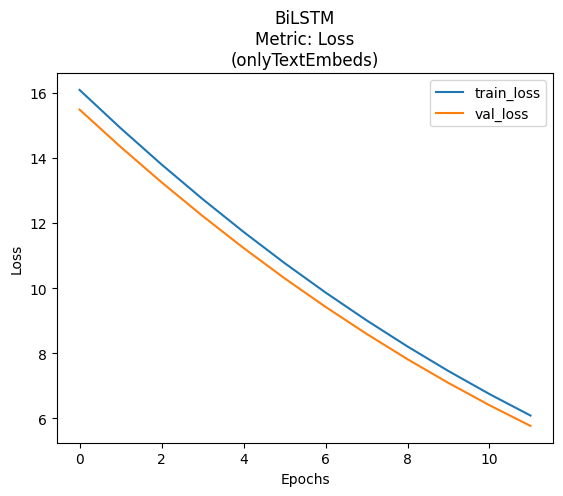

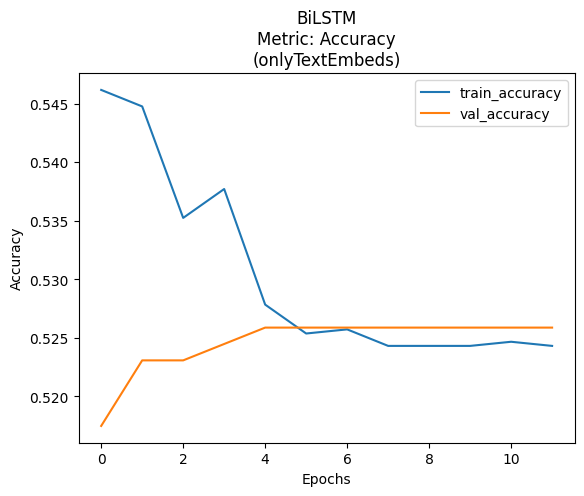

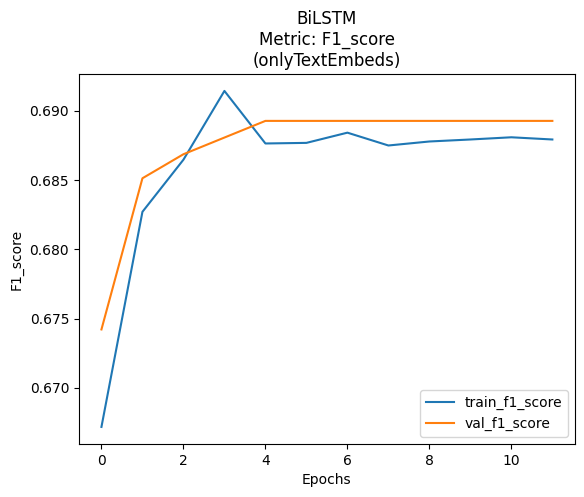

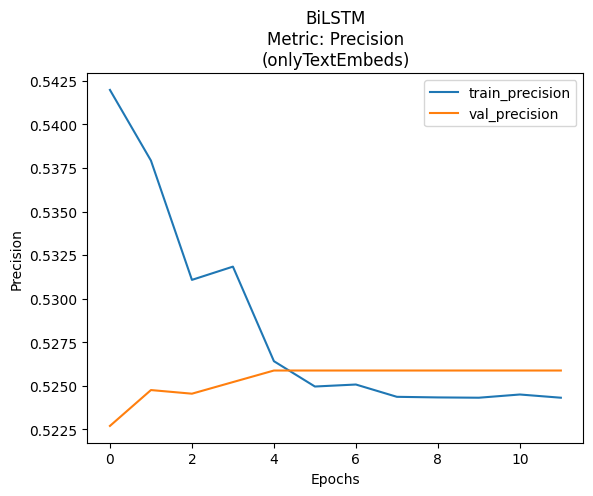

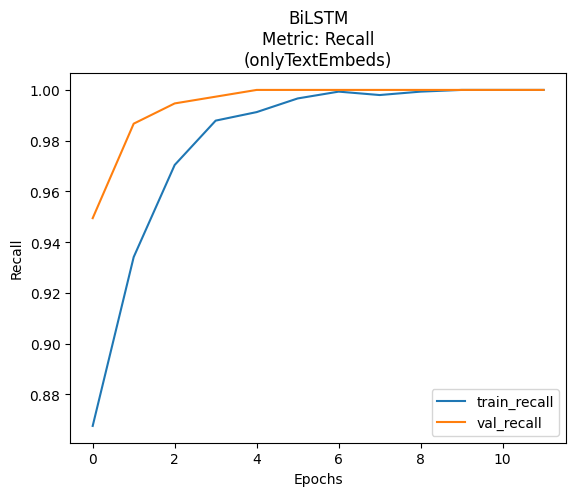



CNN

Epoch 1/12
119/119 [==============================] - 3s 12ms/step - loss: 0.6937 - accuracy: 0.5095 - f1_score: 0.6418 - precision_4: 0.5200 - recall_4: 0.8380 - val_loss: 0.6925 - val_accuracy: 0.5259 - val_f1_score: 0.6893 - val_precision_4: 0.5259 - val_recall_4: 1.0000
Epoch 2/12
119/119 [==============================] - 2s 14ms/step - loss: 0.6917 - accuracy: 0.5218 - f1_score: 0.6823 - precision_4: 0.5235 - recall_4: 0.9792 - val_loss: 0.6923 - val_accuracy: 0.5259 - val_f1_score: 0.6893 - val_precision_4: 0.5259 - val_recall_4: 1.0000
Epoch 3/12
119/119 [==============================] - 2s 15ms/step - loss: 0.6905 - accuracy: 0.5233 - f1_score: 0.6864 - precision_4: 0.5239 - recall_4: 0.9953 - val_loss: 0.6922 - val_accuracy: 0.5259 - val_f1_score: 0.6893 - val_precision_4: 0.5259 - val_recall_4: 1.0000
Epoch 4/12
119/119 [==============================] - 2s 15ms/step - loss: 0.6903 - accuracy: 0.5222 - f1_score: 0.6841 - precision_4: 0.5235 - recall_4: 0.9866 - val_l

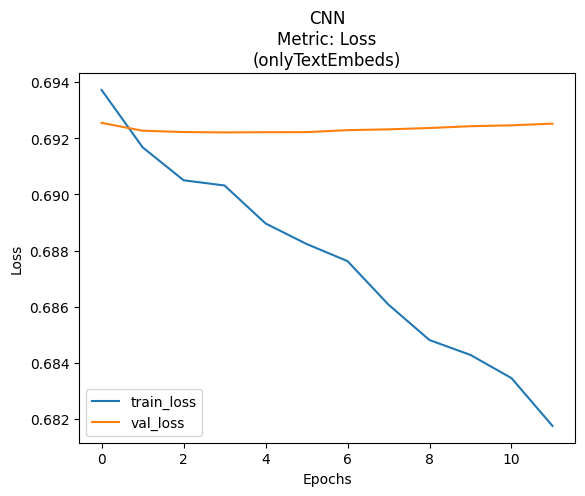

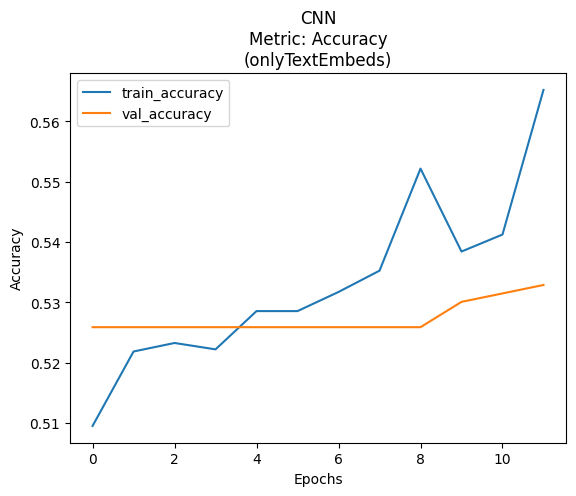

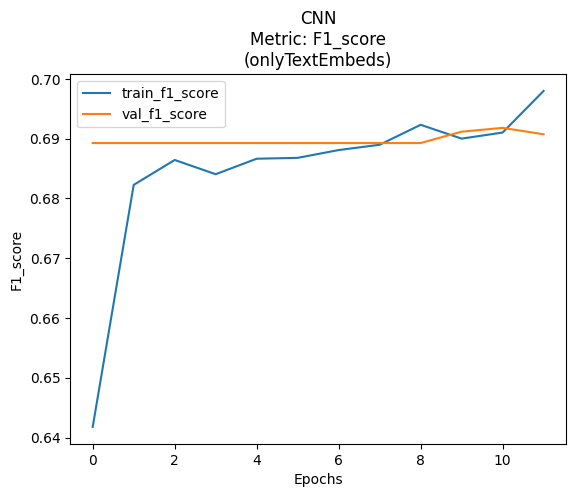

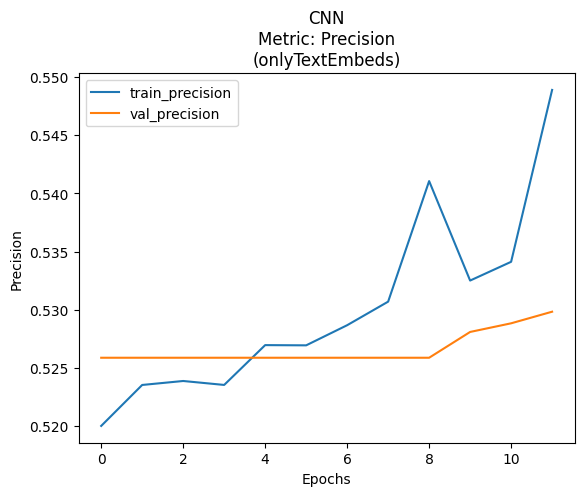

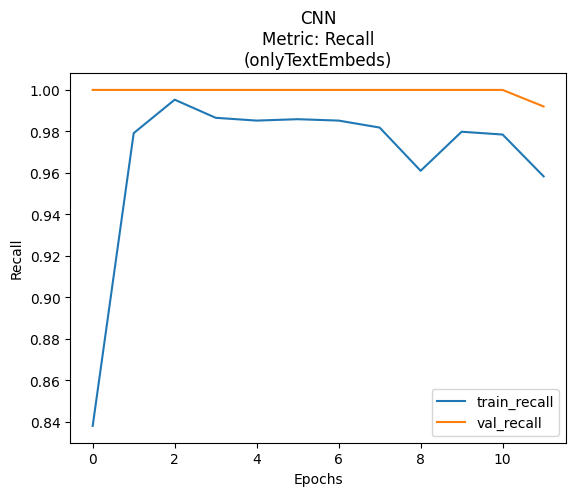



BiGRU

Epoch 1/12
119/119 [==============================] - 5s 11ms/step - loss: 0.6921 - accuracy: 0.5183 - f1_score: 0.6422 - precision_5: 0.5259 - recall_5: 0.8246 - val_loss: 0.6922 - val_accuracy: 0.5245 - val_f1_score: 0.6875 - val_precision_5: 0.5253 - val_recall_5: 0.9947
Epoch 2/12
119/119 [==============================] - 1s 7ms/step - loss: 0.6884 - accuracy: 0.5342 - f1_score: 0.6907 - precision_5: 0.5298 - recall_5: 0.9919 - val_loss: 0.6919 - val_accuracy: 0.5273 - val_f1_score: 0.6899 - val_precision_5: 0.5266 - val_recall_5: 1.0000
Epoch 3/12
119/119 [==============================] - 1s 7ms/step - loss: 0.6836 - accuracy: 0.5398 - f1_score: 0.6947 - precision_5: 0.5326 - recall_5: 0.9987 - val_loss: 0.6922 - val_accuracy: 0.5301 - val_f1_score: 0.6900 - val_precision_5: 0.5282 - val_recall_5: 0.9947
Epoch 4/12
119/119 [==============================] - 1s 7ms/step - loss: 0.6778 - accuracy: 0.5641 - f1_score: 0.7048 - precision_5: 0.5464 - recall_5: 0.9926 - val_lo

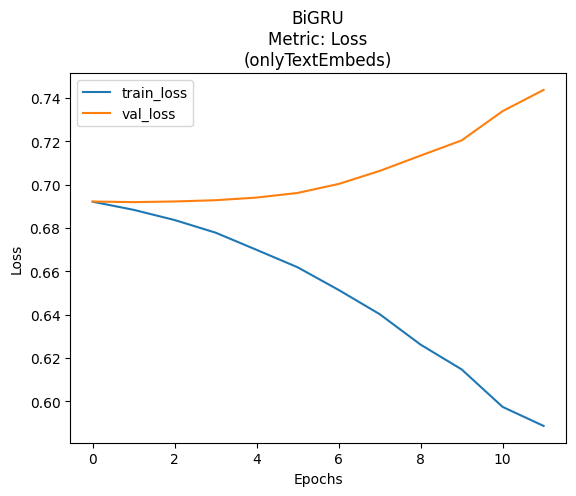

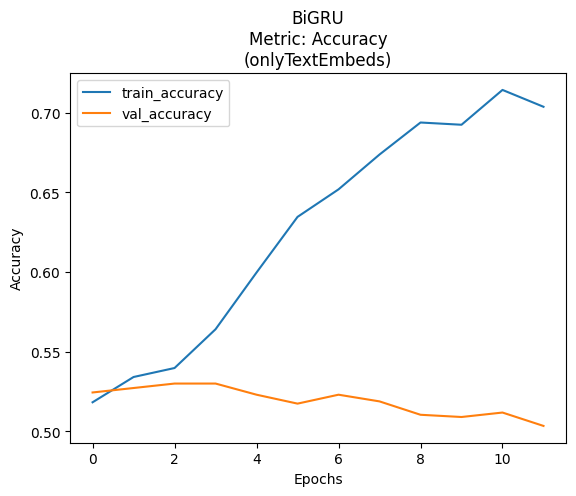

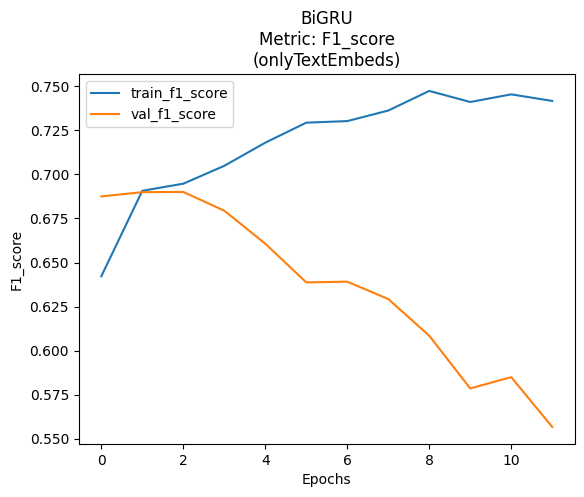

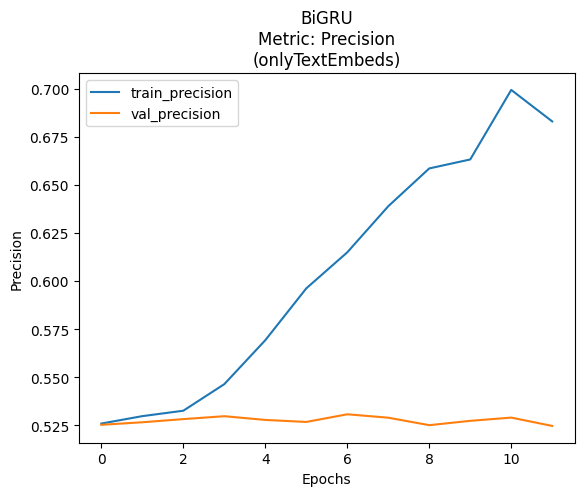

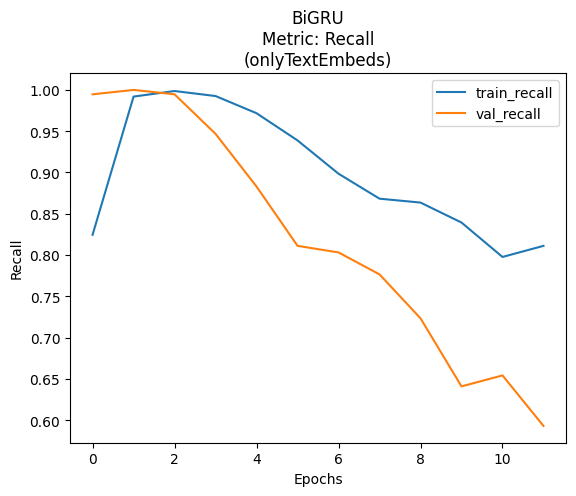

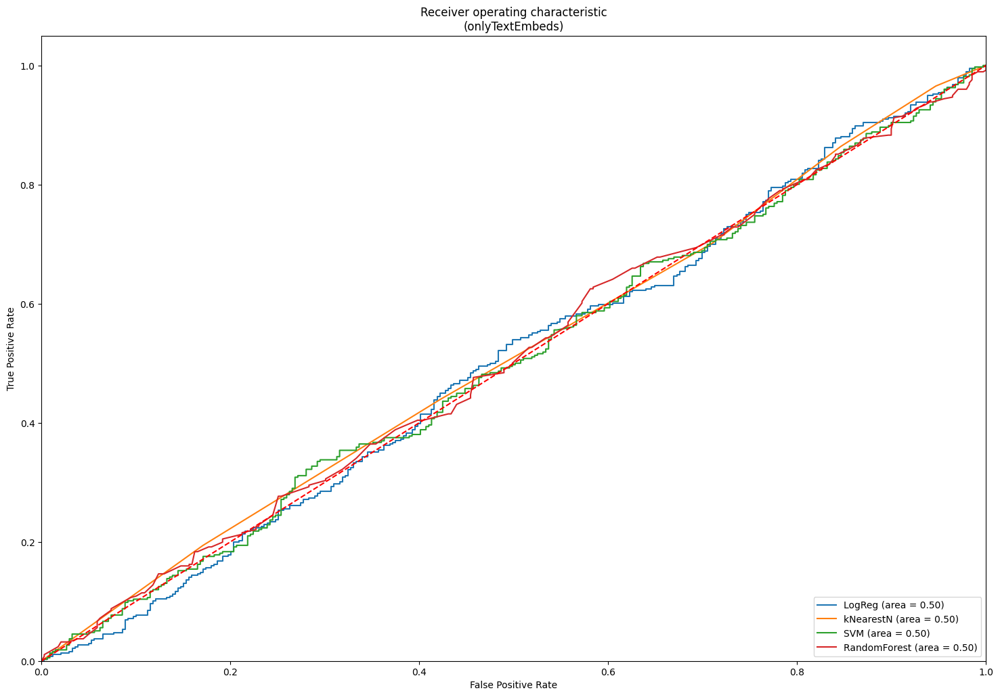

23/23 [==============================] - 0s 3ms/step


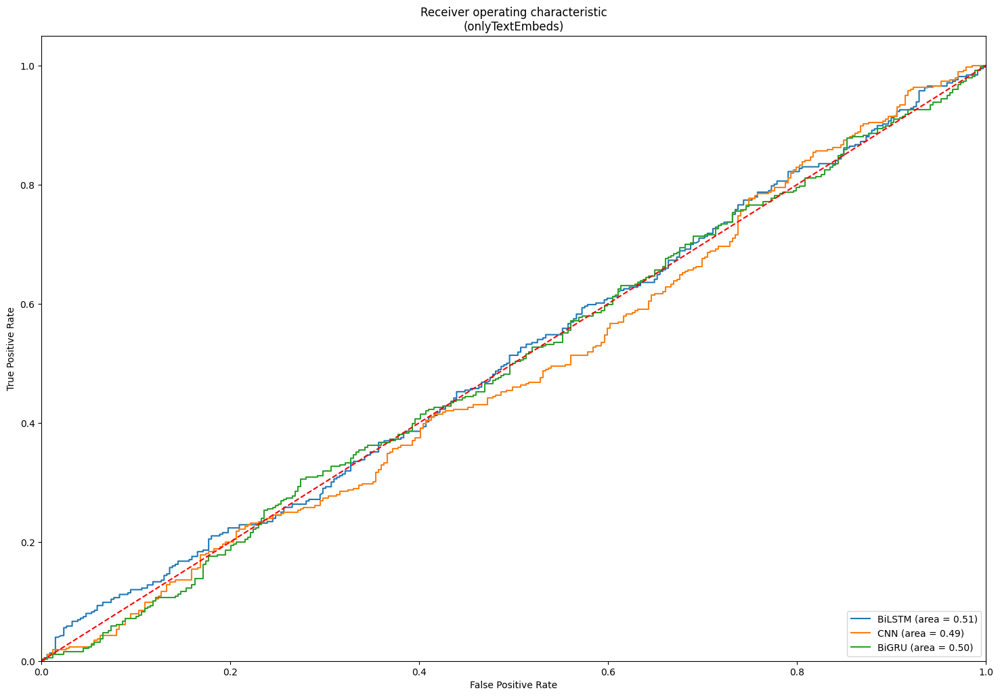

23/23 [==============================] - 0s 3ms/step


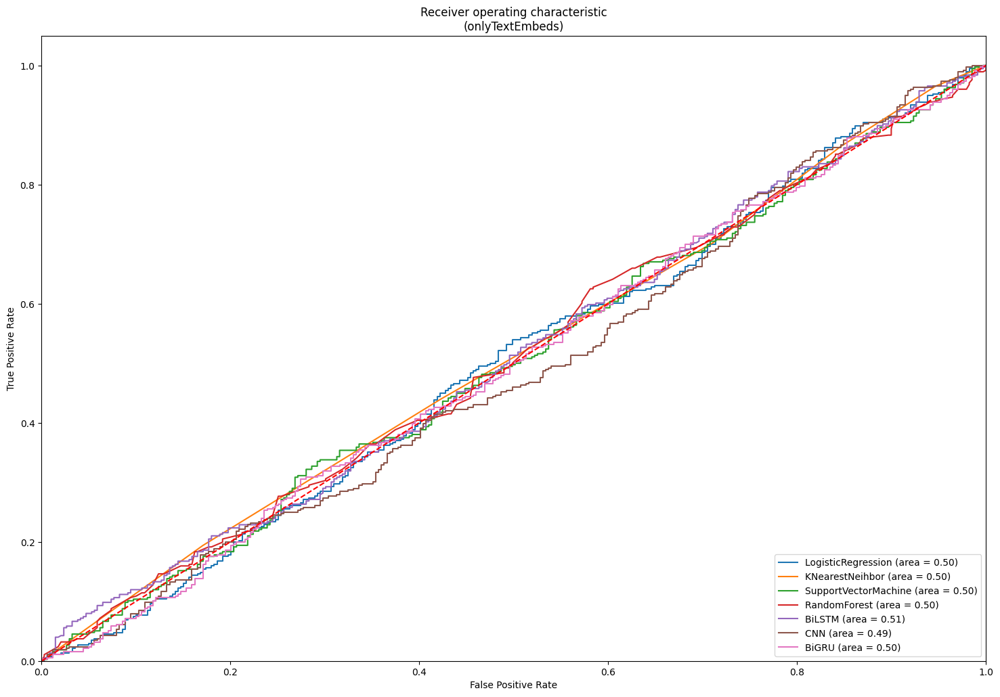

  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/modelBiGRU/modelBiGRU_recall_onlyTextEmbeds.png (deflated 12%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/modelBiGRU/modelBiGRU_accuracy_onlyTextEmbeds.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/modelBiGRU/modelBiGRU_precision_onlyTextEmbeds.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/modelBiGRU/modelBiGRU_loss_onlyTextEmbeds.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/modelBiGRU/modelBiGRU_f1_score_onlyTextEmbeds.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyTextEmbeds/Algo

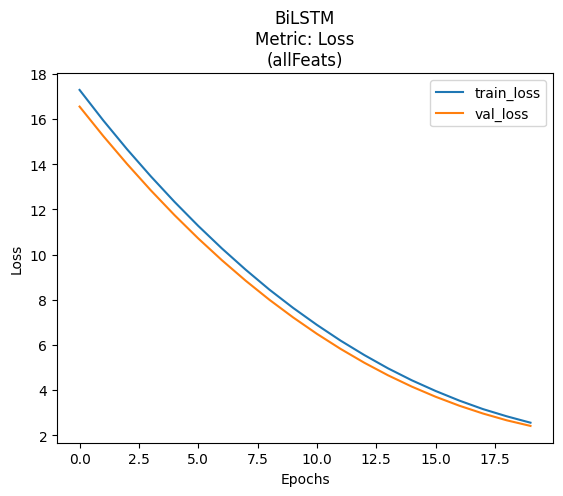

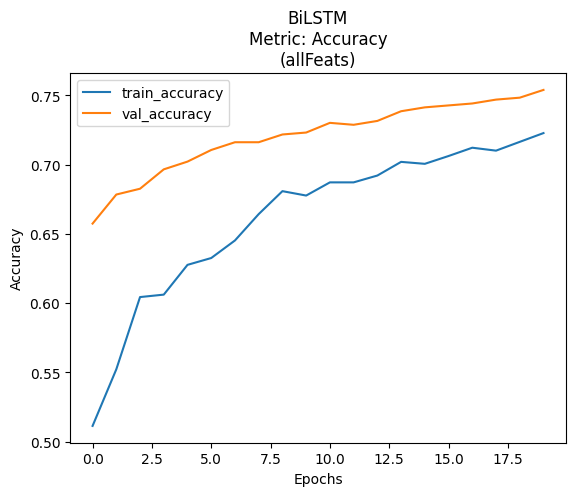

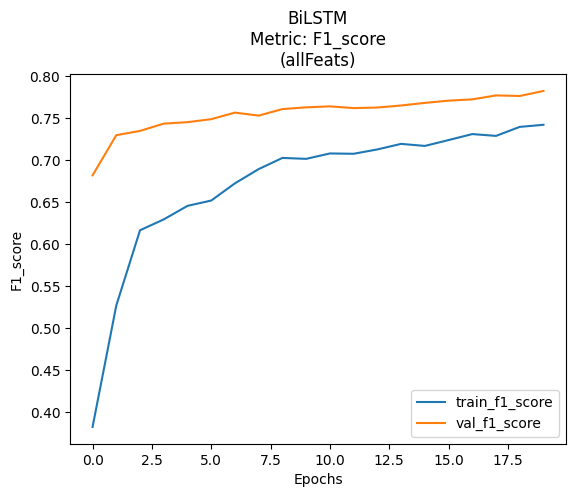

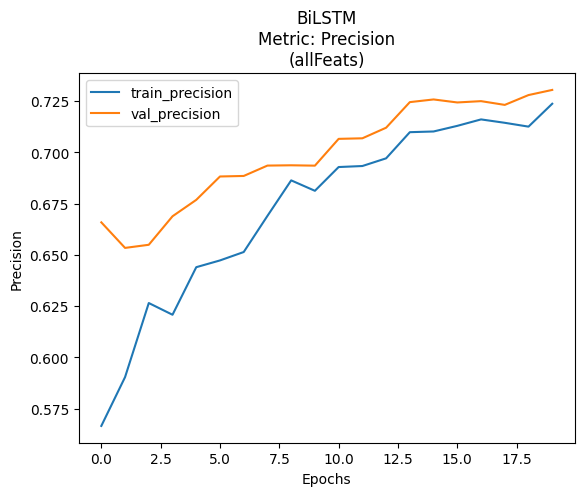

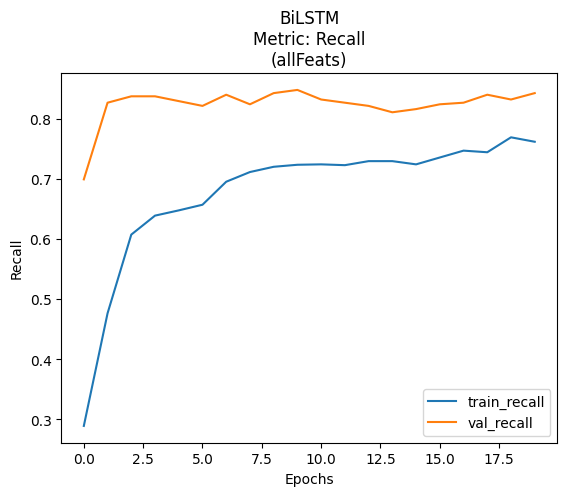



CNN

Epoch 1/20
119/119 [==============================] - 3s 15ms/step - loss: 1.7171 - accuracy: 0.4750 - f1_score: 0.0080 - precision_7: 0.4286 - recall_7: 0.0040 - val_loss: 0.9831 - val_accuracy: 0.4741 - val_f1_score: 0.0000e+00 - val_precision_7: 0.0000e+00 - val_recall_7: 0.0000e+00
Epoch 2/20
119/119 [==============================] - 1s 12ms/step - loss: 0.8380 - accuracy: 0.4810 - f1_score: 0.0980 - precision_7: 0.5517 - recall_7: 0.0538 - val_loss: 0.7436 - val_accuracy: 0.4727 - val_f1_score: 0.0000e+00 - val_precision_7: 0.0000e+00 - val_recall_7: 0.0000e+00
Epoch 3/20
119/119 [==============================] - 1s 12ms/step - loss: 0.7584 - accuracy: 0.4799 - f1_score: 0.1782 - precision_7: 0.5195 - recall_7: 0.1075 - val_loss: 0.7121 - val_accuracy: 0.4937 - val_f1_score: 0.1256 - val_precision_7: 0.6842 - val_recall_7: 0.0691
Epoch 4/20
119/119 [==============================] - 2s 13ms/step - loss: 0.7316 - accuracy: 0.5264 - f1_score: 0.3630 - precision_7: 0.6158 - 

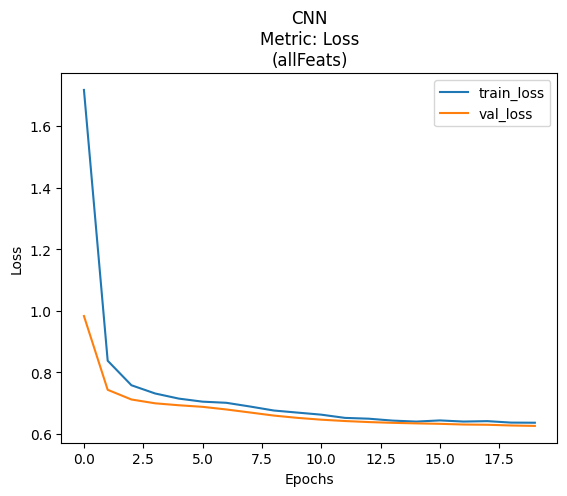

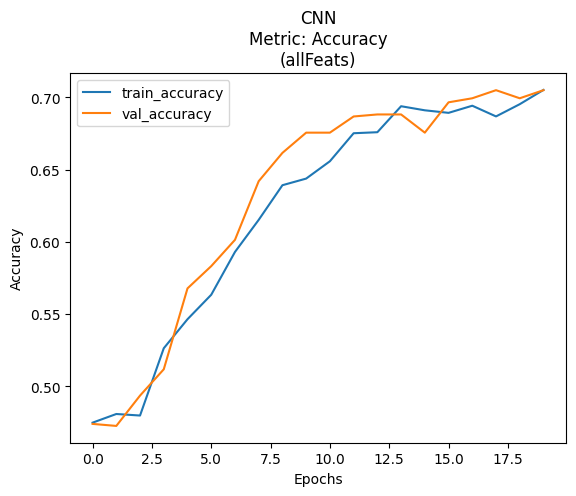

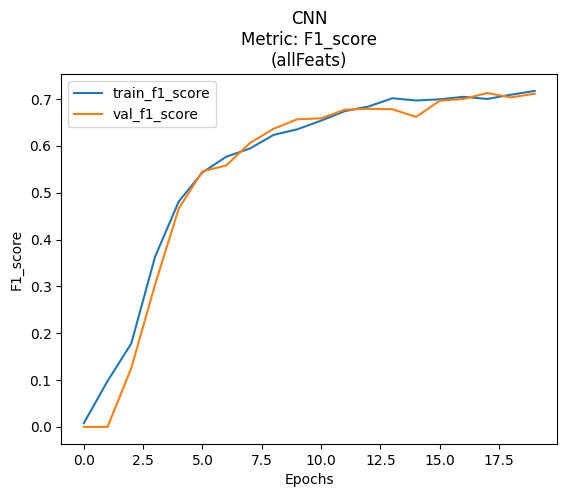

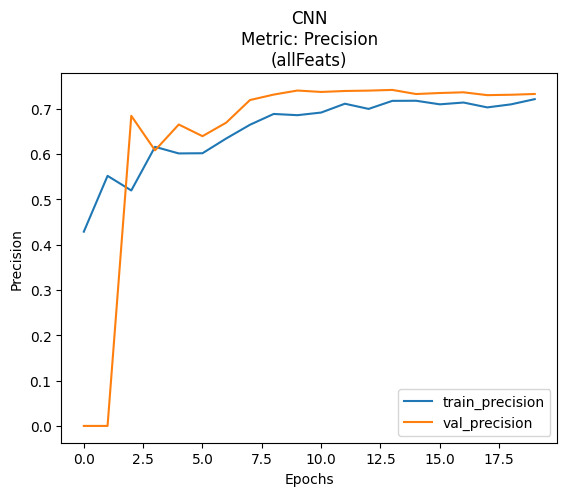

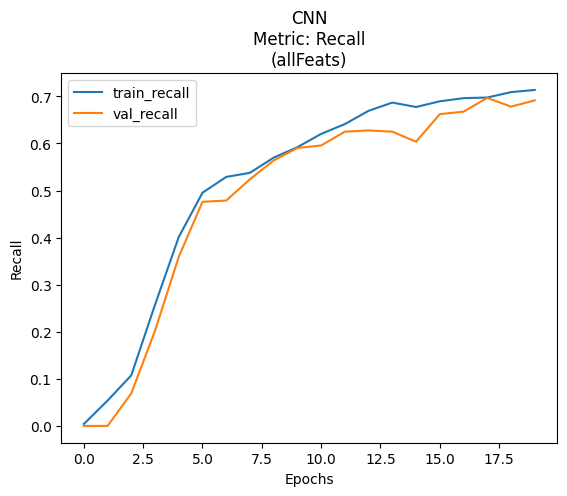



BiGRU

Epoch 1/20
119/119 [==============================] - 6s 12ms/step - loss: 0.6914 - accuracy: 0.5426 - f1_score: 0.5341 - precision_8: 0.5732 - recall_8: 0.5000 - val_loss: 0.6456 - val_accuracy: 0.6881 - val_f1_score: 0.7166 - val_precision_8: 0.6861 - val_recall_8: 0.7500
Epoch 2/20
119/119 [==============================] - 1s 8ms/step - loss: 0.6413 - accuracy: 0.6473 - f1_score: 0.6601 - precision_8: 0.6671 - recall_8: 0.6532 - val_loss: 0.6083 - val_accuracy: 0.7175 - val_f1_score: 0.7423 - val_precision_8: 0.7132 - val_recall_8: 0.7739
Epoch 3/20
119/119 [==============================] - 1s 8ms/step - loss: 0.6075 - accuracy: 0.6906 - f1_score: 0.7136 - precision_8: 0.6933 - recall_8: 0.7352 - val_loss: 0.5804 - val_accuracy: 0.7301 - val_f1_score: 0.7529 - val_precision_8: 0.7259 - val_recall_8: 0.7819
Epoch 4/20
119/119 [==============================] - 1s 8ms/step - loss: 0.5914 - accuracy: 0.6956 - f1_score: 0.7182 - precision_8: 0.6977 - recall_8: 0.7399 - val_lo

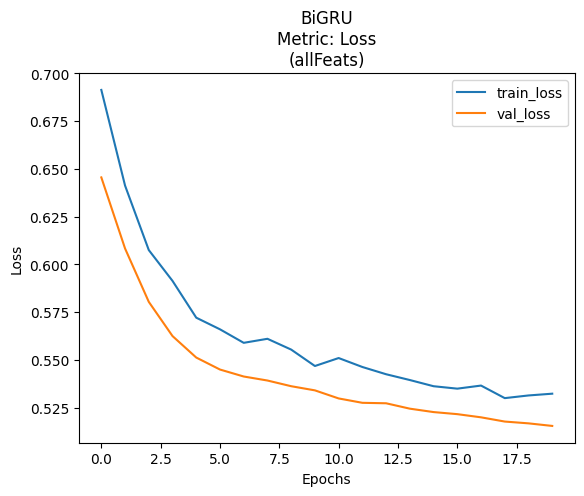

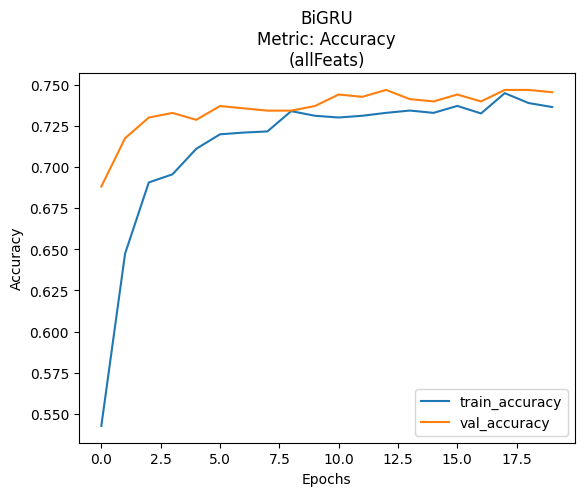

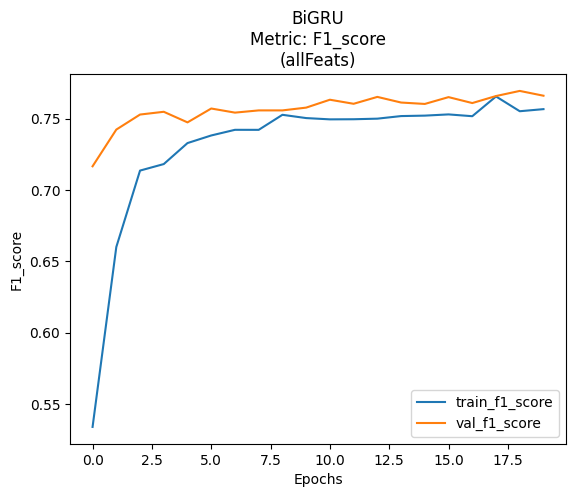

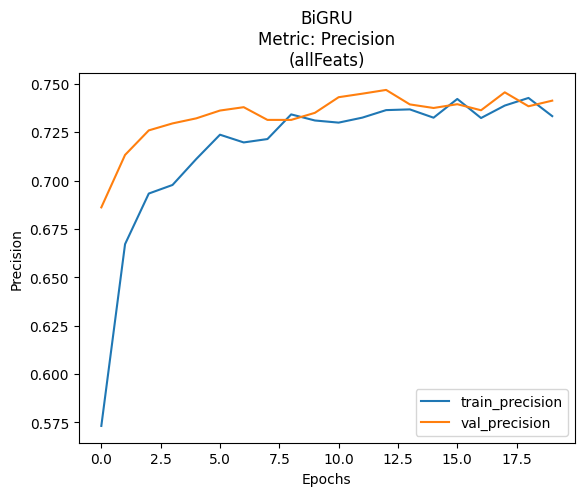

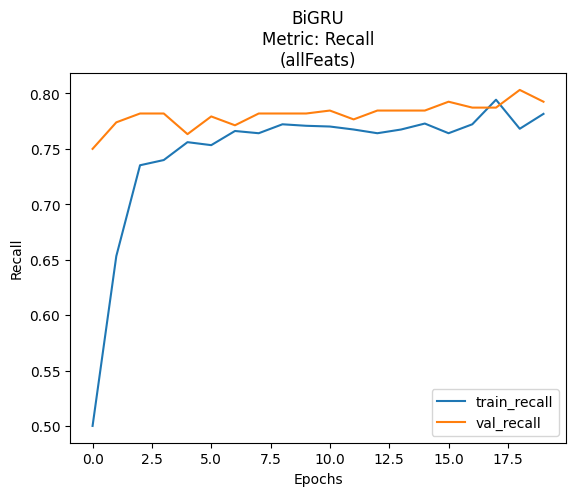

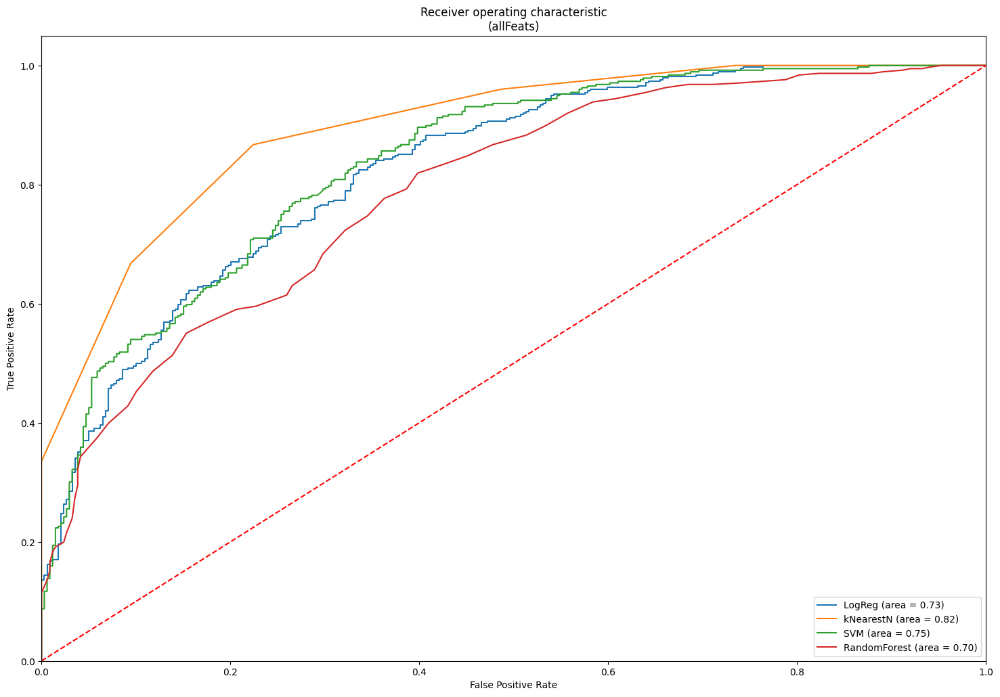

23/23 [==============================] - 0s 4ms/step


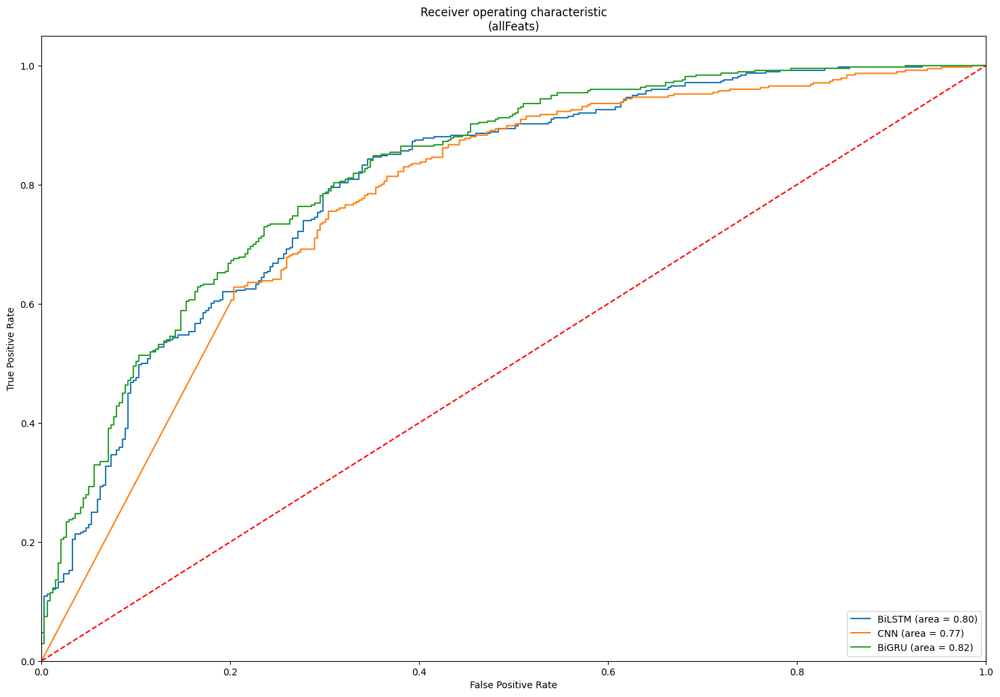

23/23 [==============================] - 0s 3ms/step


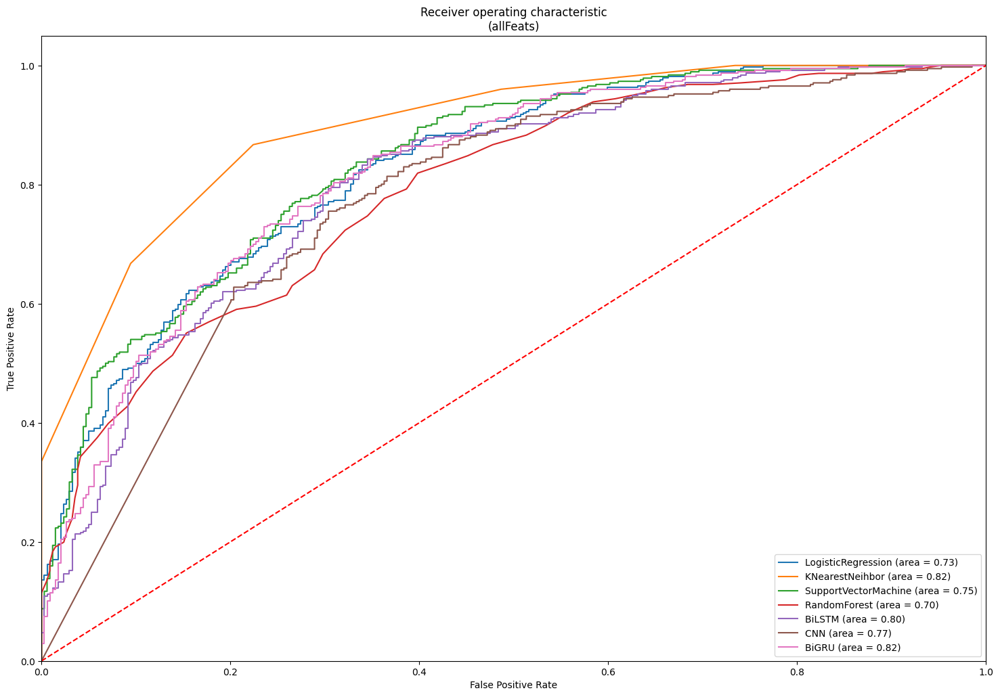

  adding: kaggle/working/results/Word2Vec/allFeats/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/allFeats/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/allFeats/modelBiGRU/modelBiGRU_precision_allFeats.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/allFeats/modelBiGRU/modelBiGRU_recall_allFeats.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/allFeats/modelBiGRU/modelBiGRU_accuracy_allFeats.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/allFeats/modelBiGRU/modelBiGRU_f1_score_allFeats.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/allFeats/modelBiGRU/modelBiGRU_loss_allFeats.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/allFeats/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/allFeats/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/allFeats/Algorithms/SupportVectorMachine/SVM_NoScaling_allFeats.txt (deflated 51%)
  adding: kaggle/wor

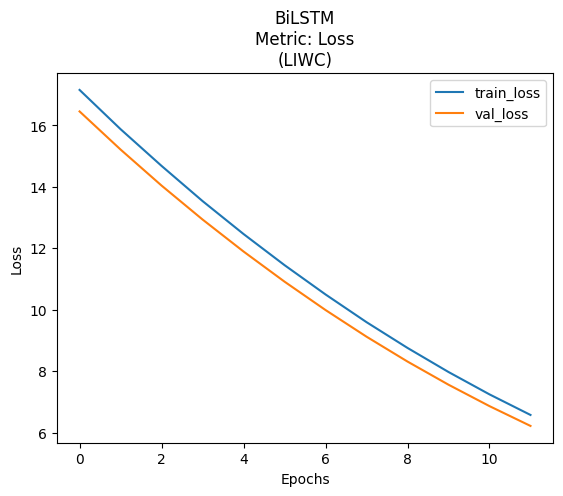

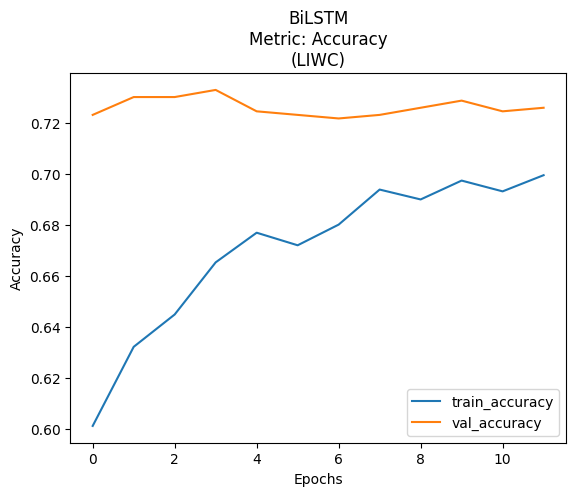

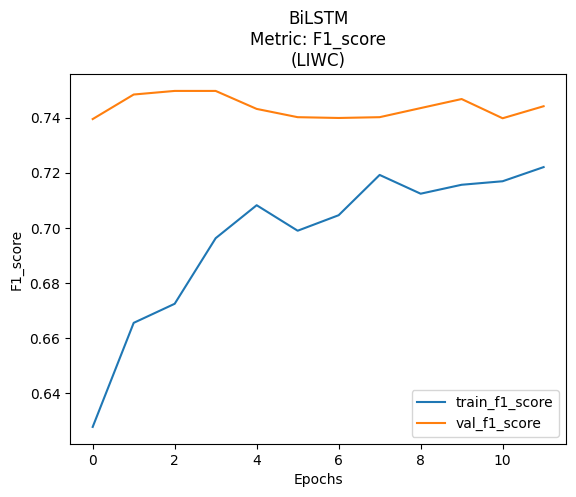

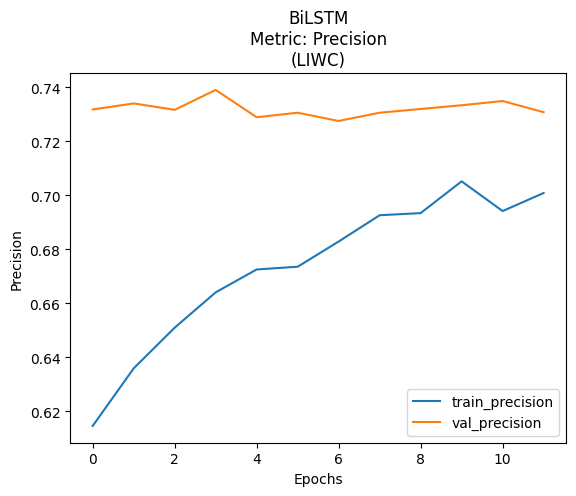

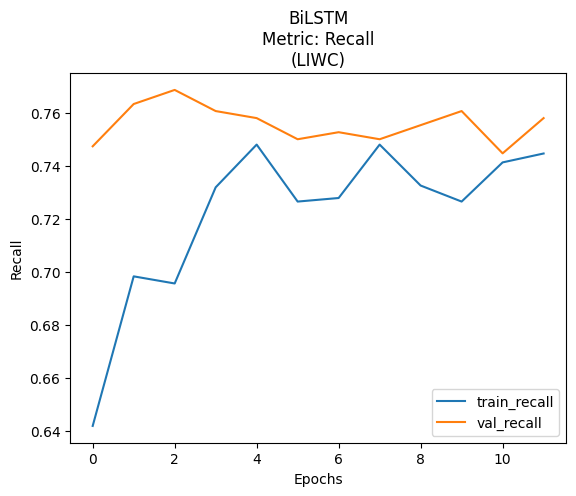



CNN

Epoch 1/12
119/119 [==============================] - 3s 16ms/step - loss: 1.5316 - accuracy: 0.5324 - f1_score: 0.6567 - precision_10: 0.5339 - recall_10: 0.8528 - val_loss: 0.8667 - val_accuracy: 0.5510 - val_f1_score: 0.6365 - val_precision_10: 0.5542 - val_recall_10: 0.7473
Epoch 2/12
119/119 [==============================] - 2s 13ms/step - loss: 1.0366 - accuracy: 0.5550 - f1_score: 0.6044 - precision_10: 0.5660 - recall_10: 0.6485 - val_loss: 0.7633 - val_accuracy: 0.5986 - val_f1_score: 0.6390 - val_precision_10: 0.6062 - val_recall_10: 0.6755
Epoch 3/12
119/119 [==============================] - 2s 14ms/step - loss: 0.9048 - accuracy: 0.5825 - f1_score: 0.6149 - precision_10: 0.5953 - recall_10: 0.6358 - val_loss: 0.7140 - val_accuracy: 0.6280 - val_f1_score: 0.6683 - val_precision_10: 0.6291 - val_recall_10: 0.7128
Epoch 4/12
119/119 [==============================] - 2s 14ms/step - loss: 0.8041 - accuracy: 0.6138 - f1_score: 0.6390 - precision_10: 0.6266 - recall_10: 

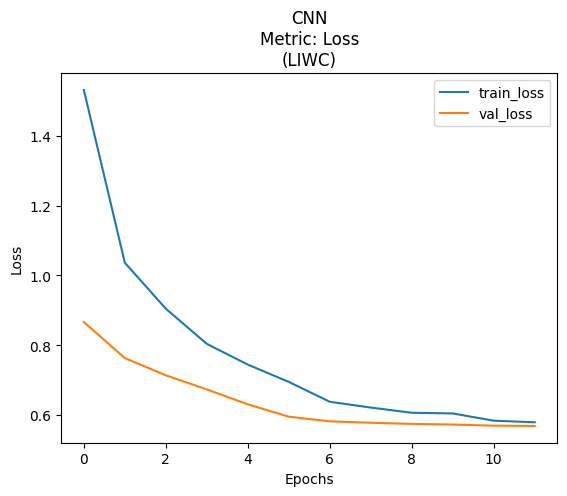

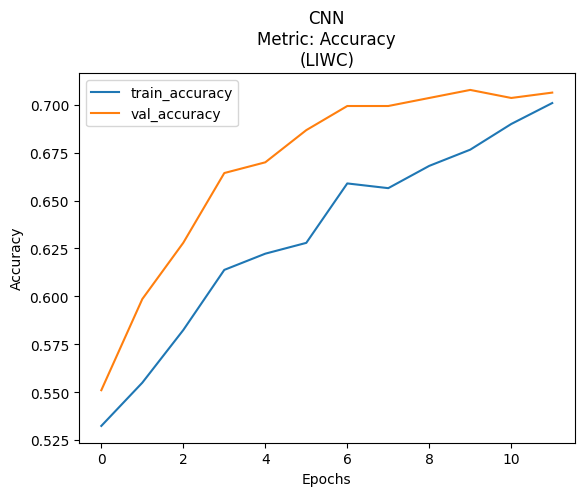

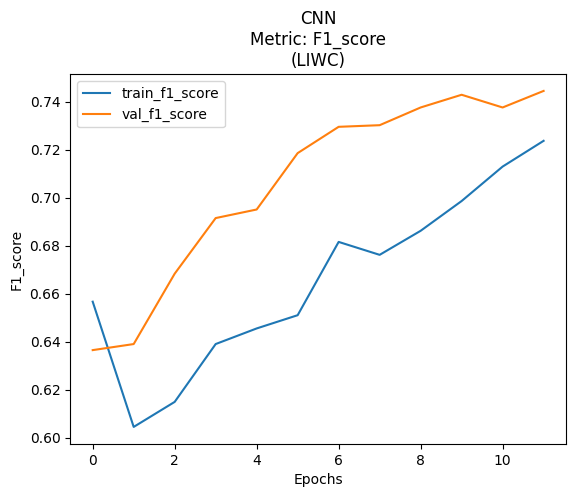

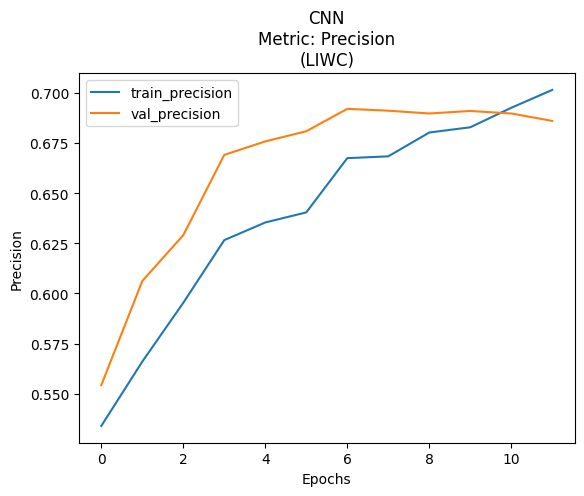

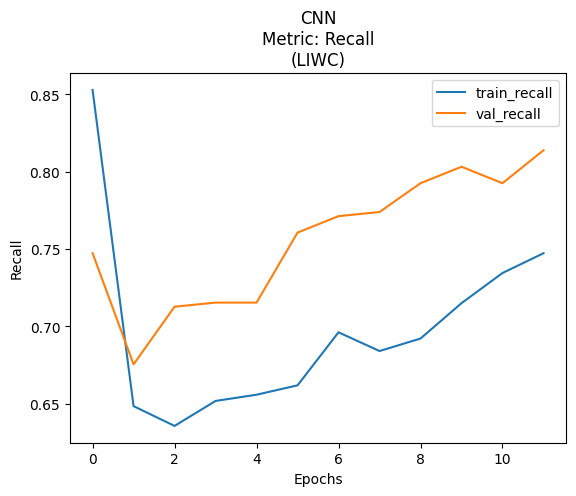



BiGRU

Epoch 1/12
119/119 [==============================] - 5s 14ms/step - loss: 0.7076 - accuracy: 0.5620 - f1_score: 0.6733 - precision_11: 0.5529 - recall_11: 0.8609 - val_loss: 0.6320 - val_accuracy: 0.6797 - val_f1_score: 0.7353 - val_precision_11: 0.6503 - val_recall_11: 0.8457
Epoch 2/12
119/119 [==============================] - 1s 9ms/step - loss: 0.6367 - accuracy: 0.6564 - f1_score: 0.7085 - precision_11: 0.6381 - recall_11: 0.7964 - val_loss: 0.5899 - val_accuracy: 0.7105 - val_f1_score: 0.7370 - val_precision_11: 0.7056 - val_recall_11: 0.7713
Epoch 3/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6056 - accuracy: 0.6765 - f1_score: 0.7102 - precision_11: 0.6696 - recall_11: 0.7560 - val_loss: 0.5660 - val_accuracy: 0.7077 - val_f1_score: 0.7268 - val_precision_11: 0.7147 - val_recall_11: 0.7394
Epoch 4/12
119/119 [==============================] - 2s 13ms/step - loss: 0.5881 - accuracy: 0.6966 - f1_score: 0.7231 - precision_11: 0.6934 - recall_11:

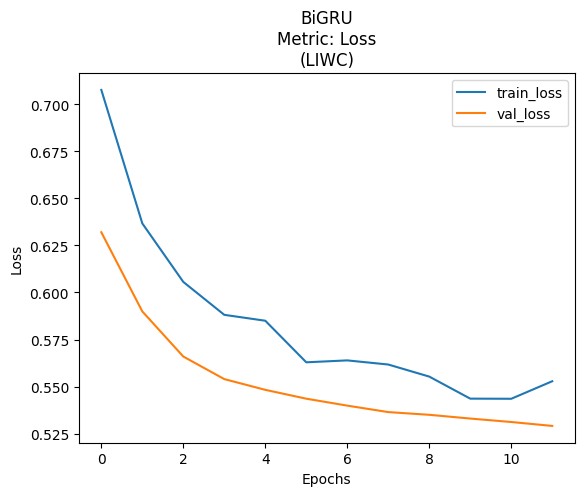

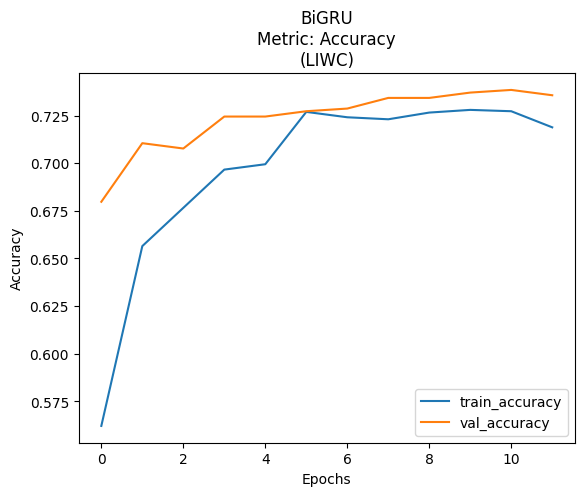

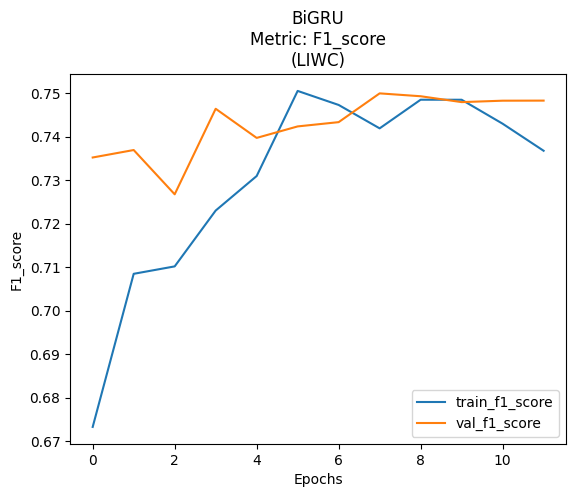

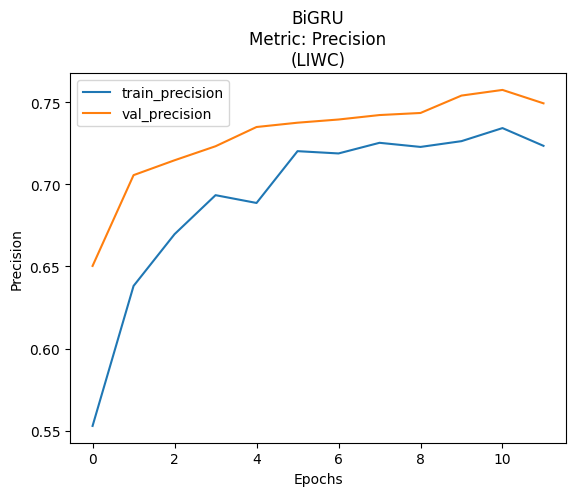

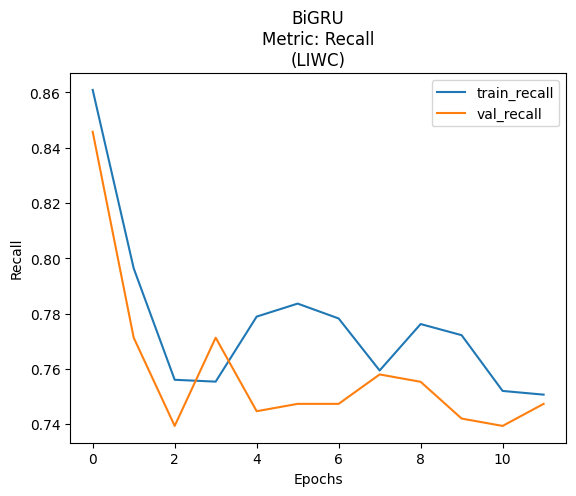

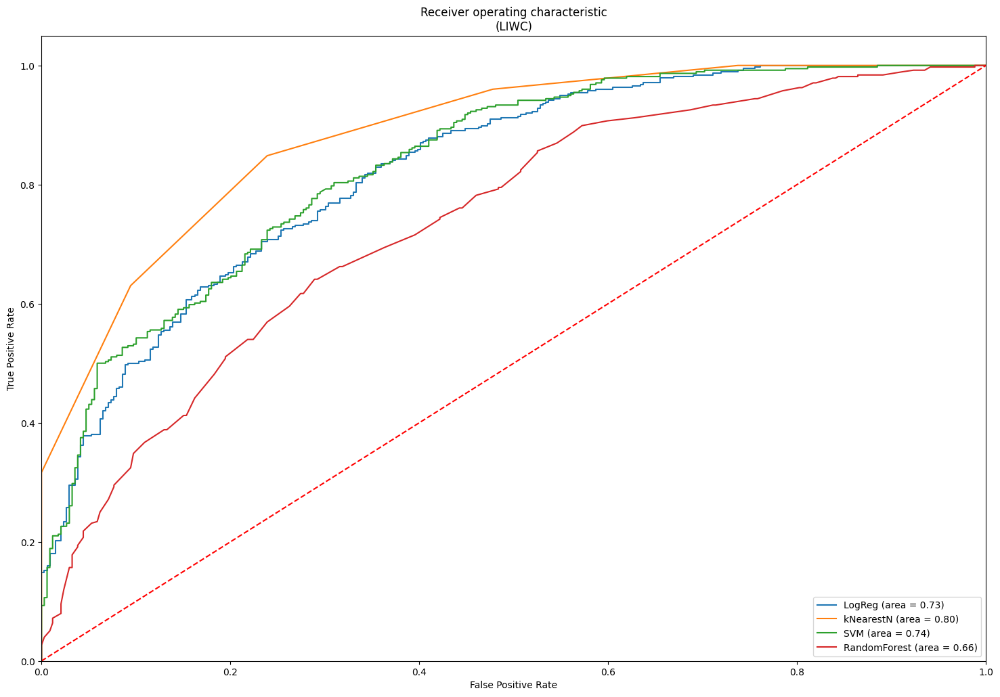

23/23 [==============================] - 0s 3ms/step


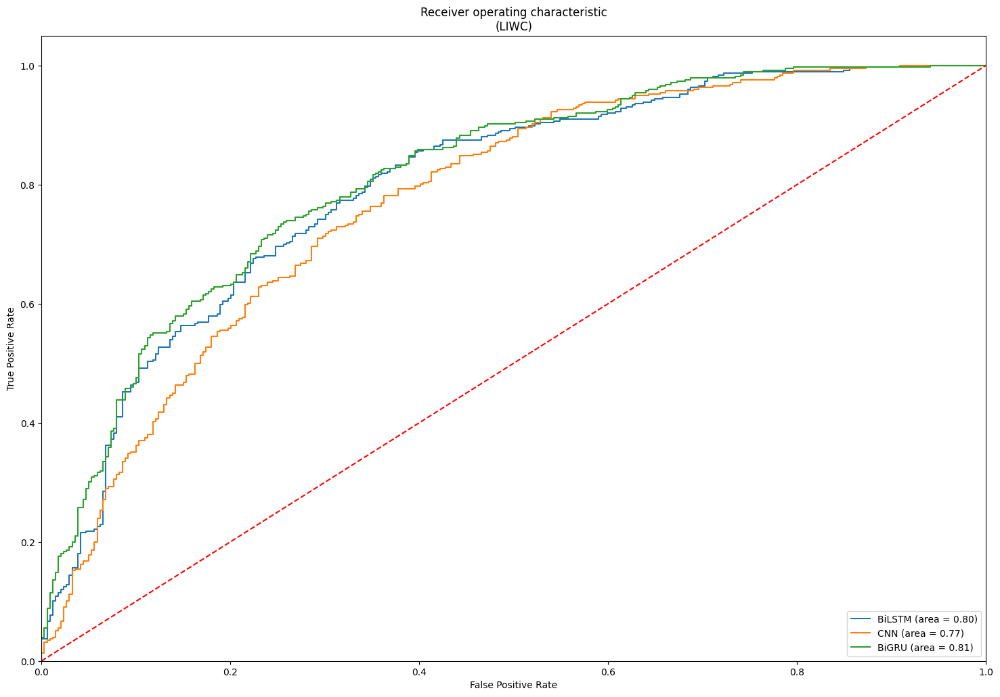

23/23 [==============================] - 0s 4ms/step


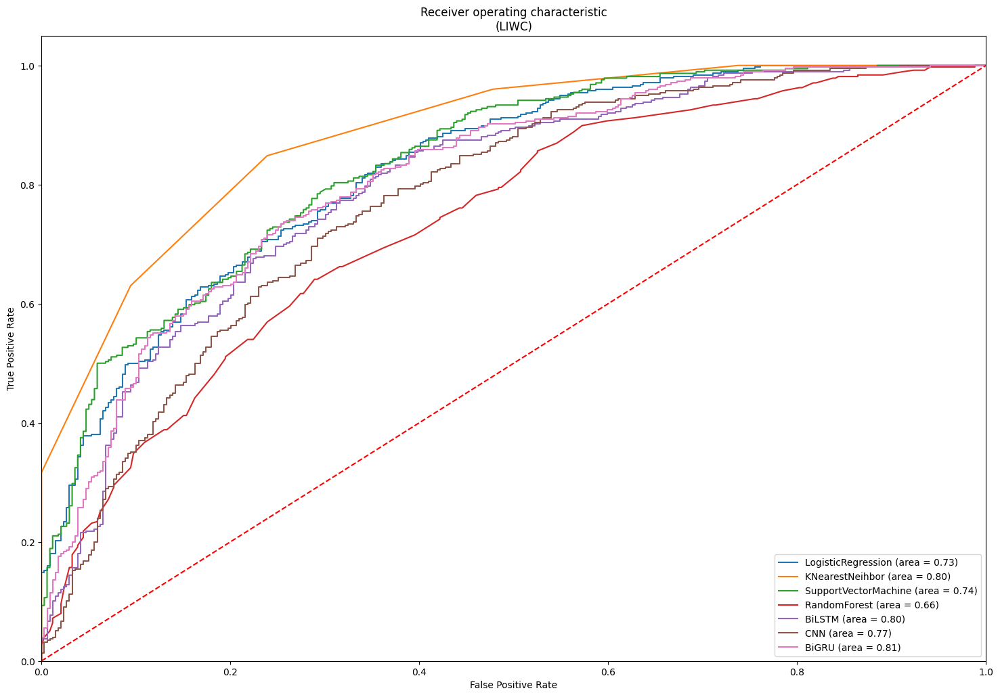

  adding: kaggle/working/results/Word2Vec/LIWC/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/LIWC/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/LIWC/modelBiGRU/modelBiGRU_precision_LIWC.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/LIWC/modelBiGRU/modelBiGRU_accuracy_LIWC.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/LIWC/modelBiGRU/modelBiGRU_loss_LIWC.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/LIWC/modelBiGRU/modelBiGRU_f1_score_LIWC.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/LIWC/modelBiGRU/modelBiGRU_recall_LIWC.png (deflated 12%)
  adding: kaggle/working/results/Word2Vec/LIWC/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/LIWC/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/LIWC/Algorithms/SupportVectorMachine/SVM_NoScaling_LIWC.txt (deflated 51%)
  adding: kaggle/working/results/Word2Vec/LIWC/Algorithms/KNearestNeighbors/ (stored

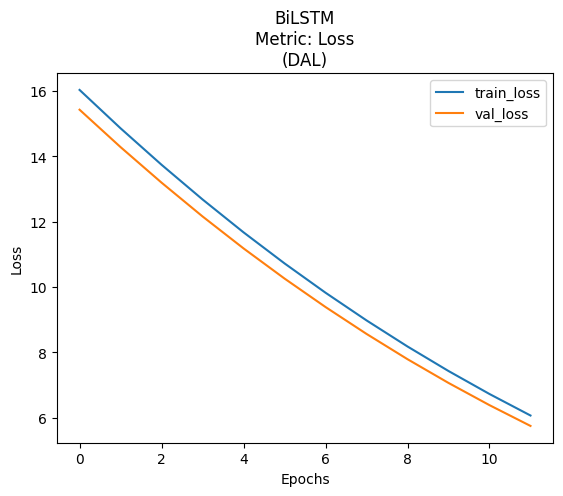

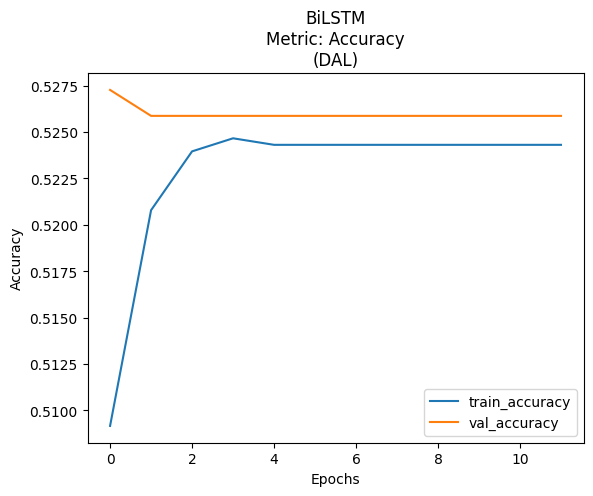

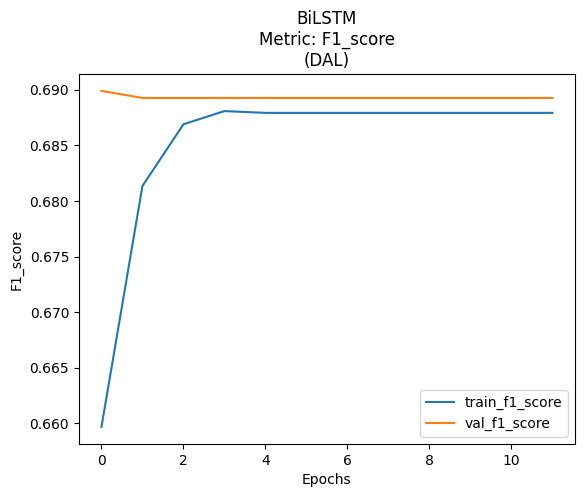

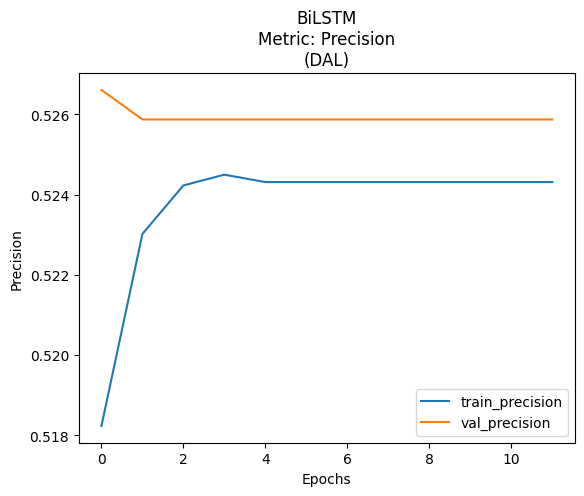

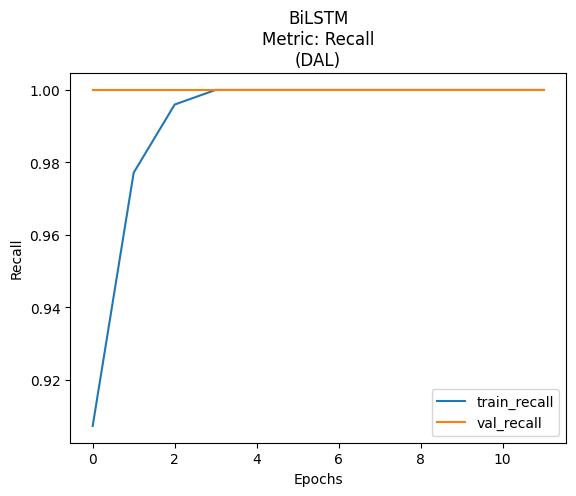



CNN

Epoch 1/12
119/119 [==============================] - 4s 22ms/step - loss: 0.6935 - accuracy: 0.4979 - f1_score: 0.4984 - precision_13: 0.5233 - recall_13: 0.4758 - val_loss: 0.6929 - val_accuracy: 0.4909 - val_f1_score: 0.6331 - val_precision_13: 0.5097 - val_recall_13: 0.8351
Epoch 2/12
119/119 [==============================] - 2s 15ms/step - loss: 0.6914 - accuracy: 0.5292 - f1_score: 0.6670 - precision_13: 0.5301 - recall_13: 0.8992 - val_loss: 0.6925 - val_accuracy: 0.5245 - val_f1_score: 0.6881 - val_precision_13: 0.5252 - val_recall_13: 0.9973
Epoch 3/12
119/119 [==============================] - 2s 14ms/step - loss: 0.6903 - accuracy: 0.5335 - f1_score: 0.6713 - precision_13: 0.5323 - recall_13: 0.9086 - val_loss: 0.6923 - val_accuracy: 0.5273 - val_f1_score: 0.6899 - val_precision_13: 0.5266 - val_recall_13: 1.0000
Epoch 4/12
119/119 [==============================] - 2s 16ms/step - loss: 0.6892 - accuracy: 0.5275 - f1_score: 0.6686 - precision_13: 0.5287 - recall_13: 

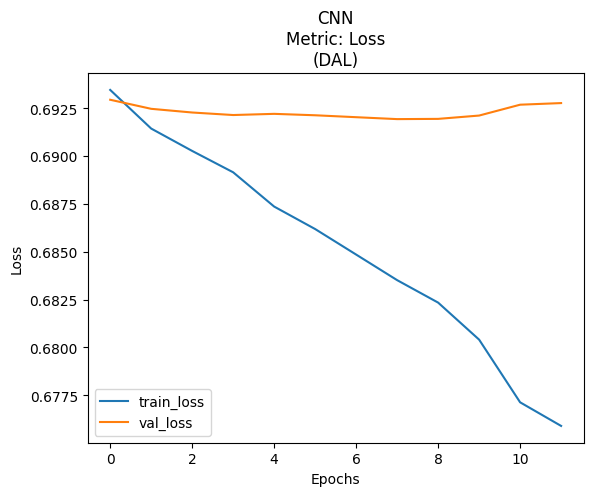

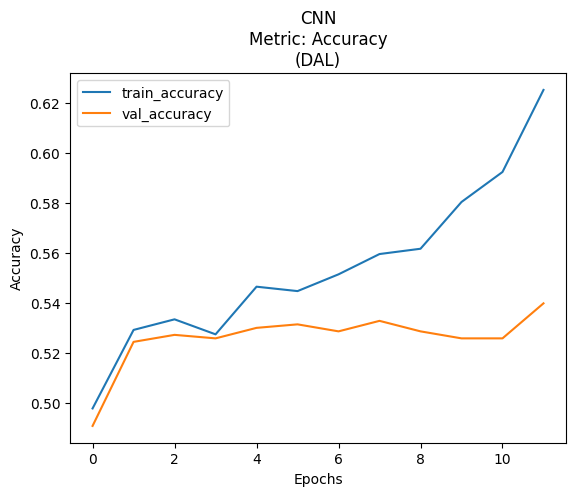

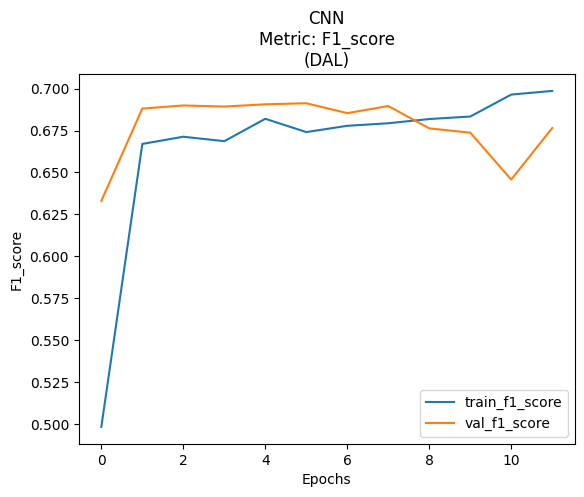

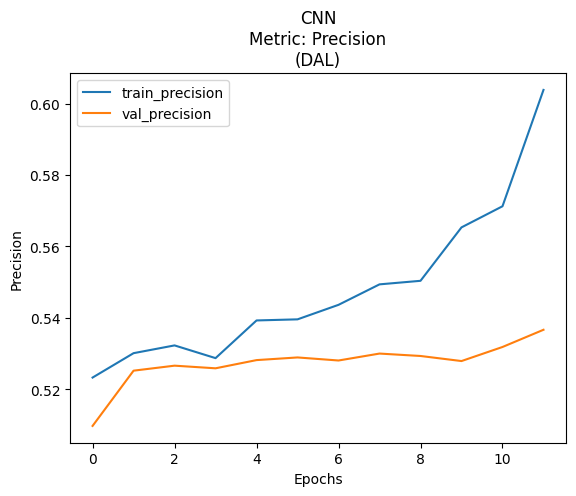

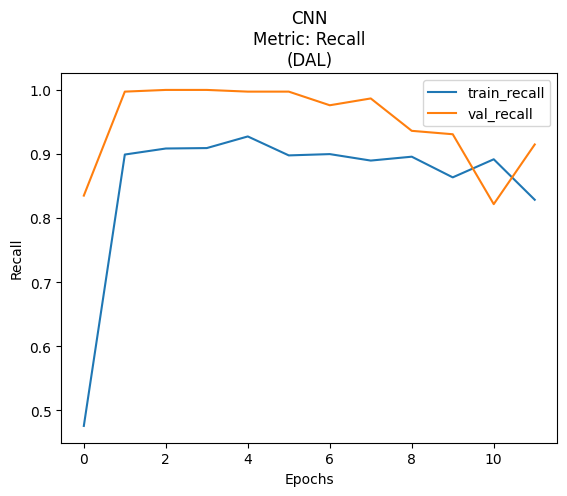



BiGRU

Epoch 1/12
119/119 [==============================] - 6s 20ms/step - loss: 0.6918 - accuracy: 0.5162 - f1_score: 0.6442 - precision_14: 0.5243 - recall_14: 0.8353 - val_loss: 0.6910 - val_accuracy: 0.5231 - val_f1_score: 0.6863 - val_precision_14: 0.5246 - val_recall_14: 0.9920
Epoch 2/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6886 - accuracy: 0.5233 - f1_score: 0.6672 - precision_14: 0.5262 - recall_14: 0.9113 - val_loss: 0.6908 - val_accuracy: 0.5231 - val_f1_score: 0.6869 - val_precision_14: 0.5245 - val_recall_14: 0.9947
Epoch 3/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6871 - accuracy: 0.5433 - f1_score: 0.6827 - precision_14: 0.5370 - recall_14: 0.9368 - val_loss: 0.6905 - val_accuracy: 0.5217 - val_f1_score: 0.6851 - val_precision_14: 0.5239 - val_recall_14: 0.9894
Epoch 4/12
119/119 [==============================] - 1s 12ms/step - loss: 0.6833 - accuracy: 0.5521 - f1_score: 0.6929 - precision_14: 0.5409 - recall_14

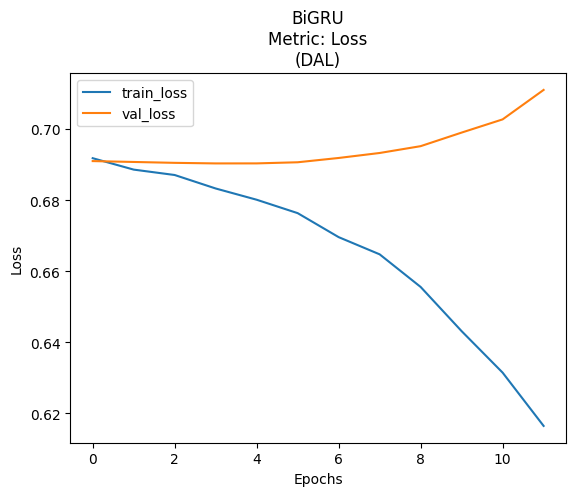

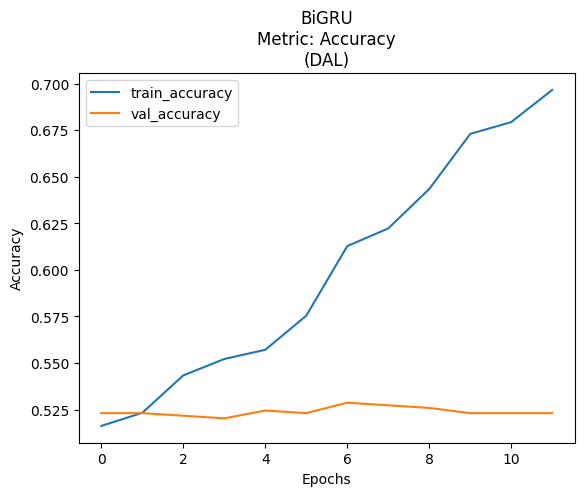

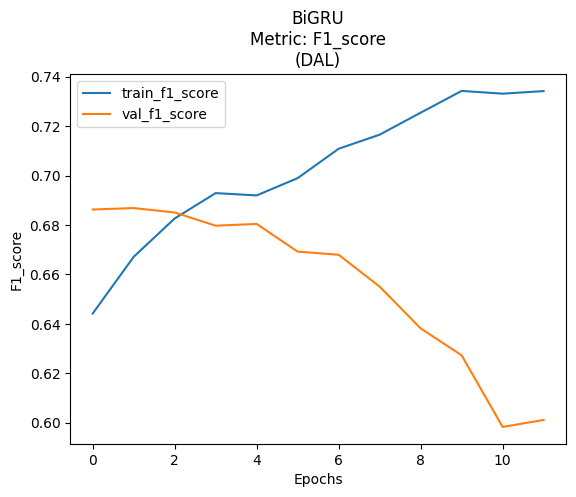

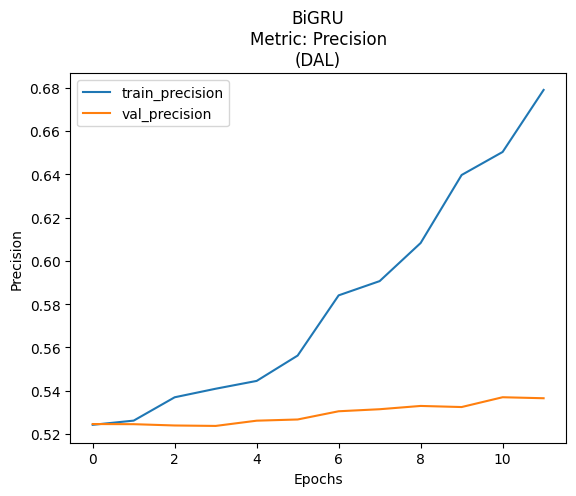

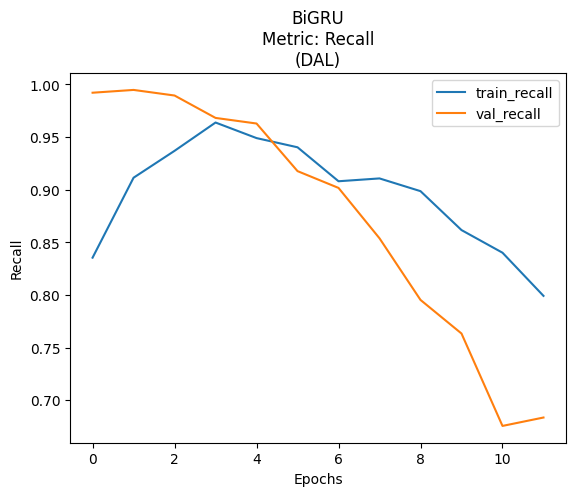

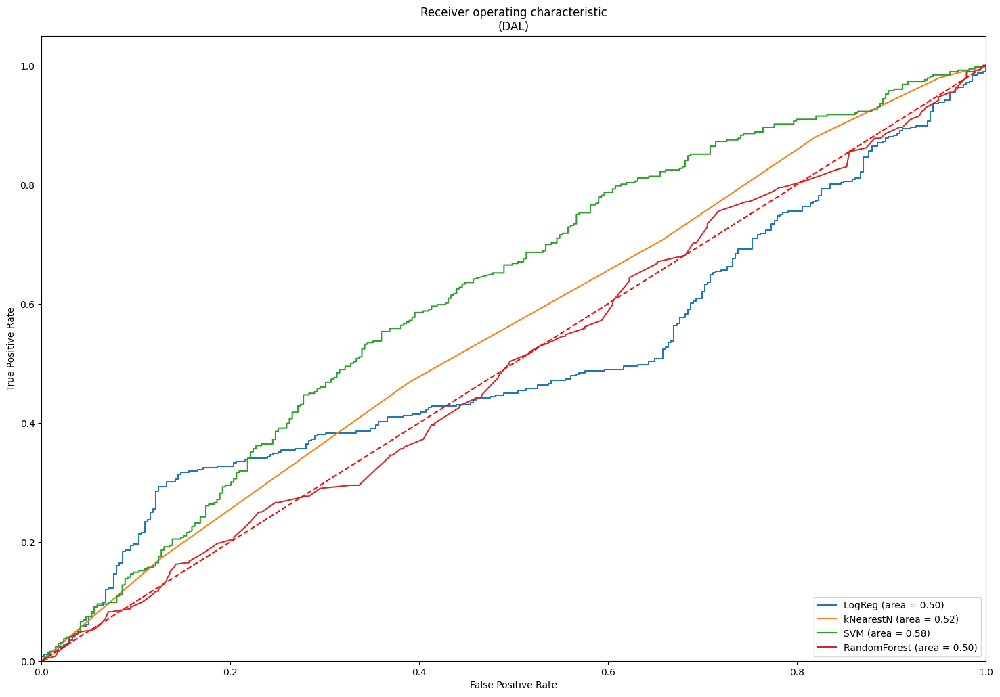

23/23 [==============================] - 0s 3ms/step


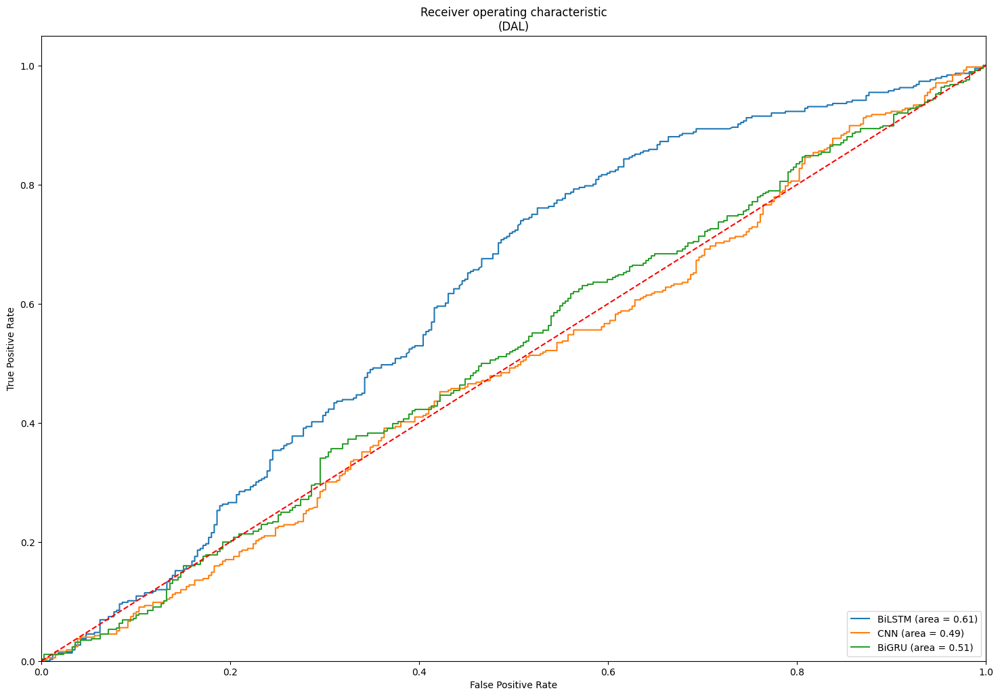

23/23 [==============================] - 0s 5ms/step


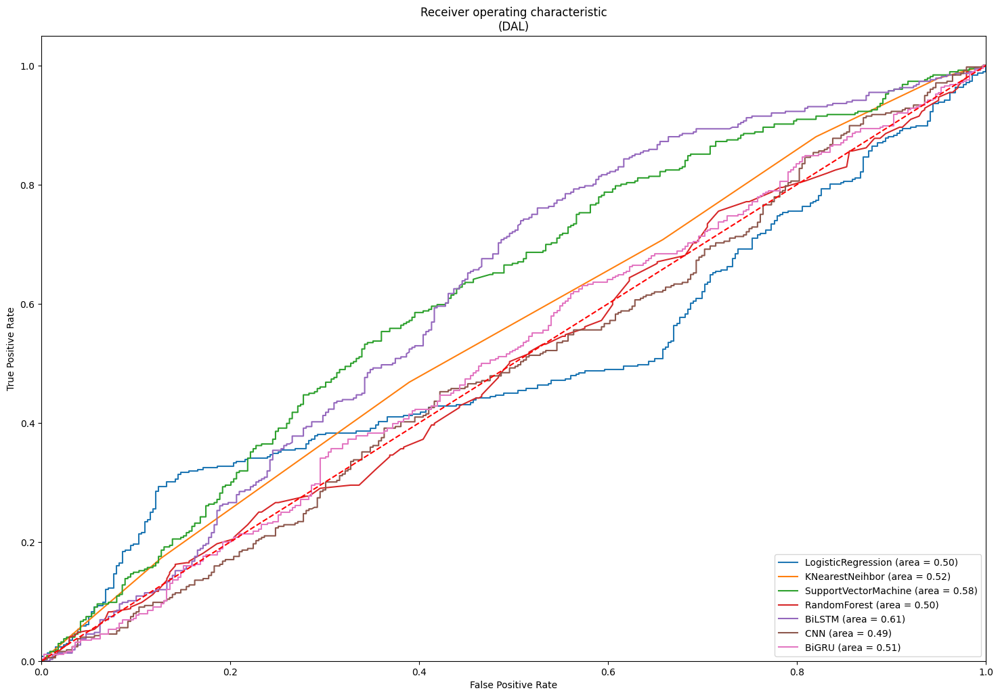

  adding: kaggle/working/results/Word2Vec/DAL/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/DAL/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/DAL/modelBiGRU/modelBiGRU_precision_DAL.png (deflated 16%)
  adding: kaggle/working/results/Word2Vec/DAL/modelBiGRU/modelBiGRU_recall_DAL.png (deflated 12%)
  adding: kaggle/working/results/Word2Vec/DAL/modelBiGRU/modelBiGRU_f1_score_DAL.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/DAL/modelBiGRU/modelBiGRU_accuracy_DAL.png (deflated 16%)
  adding: kaggle/working/results/Word2Vec/DAL/modelBiGRU/modelBiGRU_loss_DAL.png (deflated 16%)
  adding: kaggle/working/results/Word2Vec/DAL/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/DAL/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/DAL/Algorithms/SupportVectorMachine/SVM_NoScaling_DAL.txt (deflated 51%)
  adding: kaggle/working/results/Word2Vec/DAL/Algorithms/KNearestNeighbors/ (stored 0%)
  adding: ka

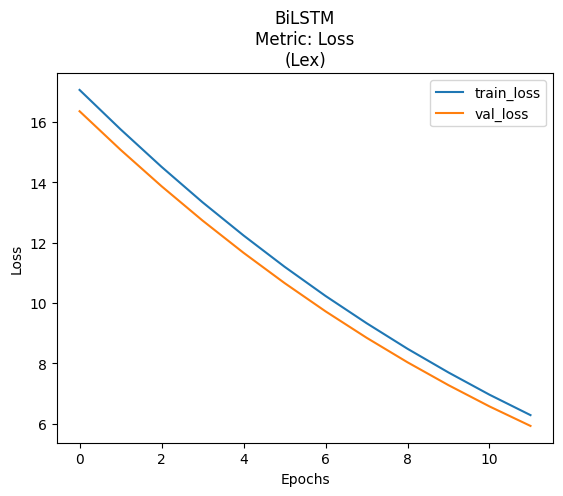

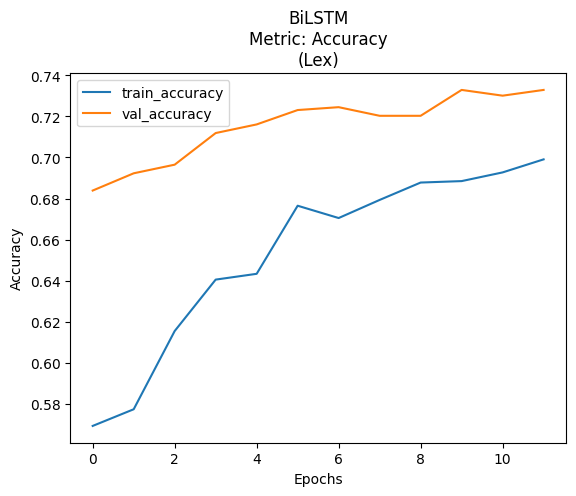

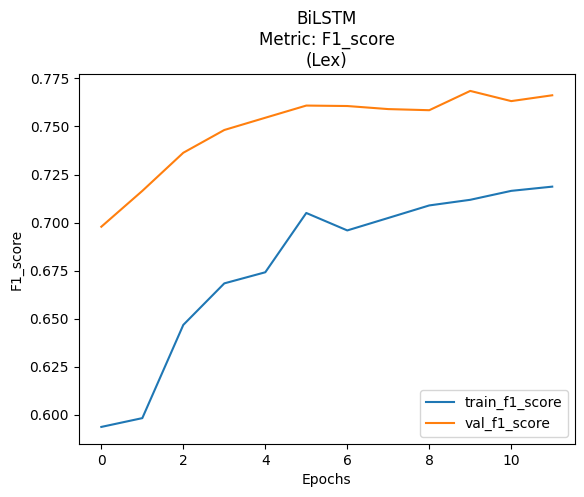

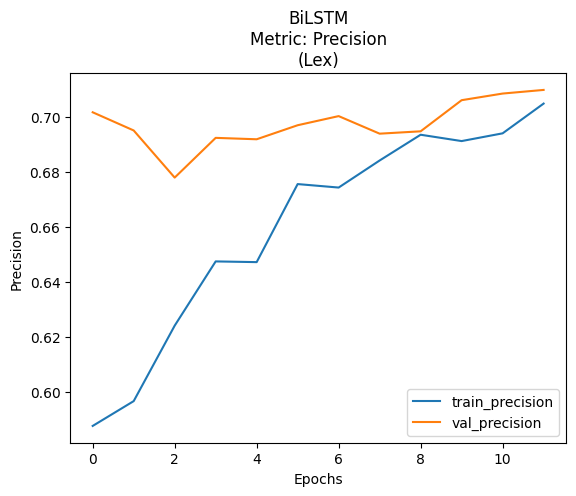

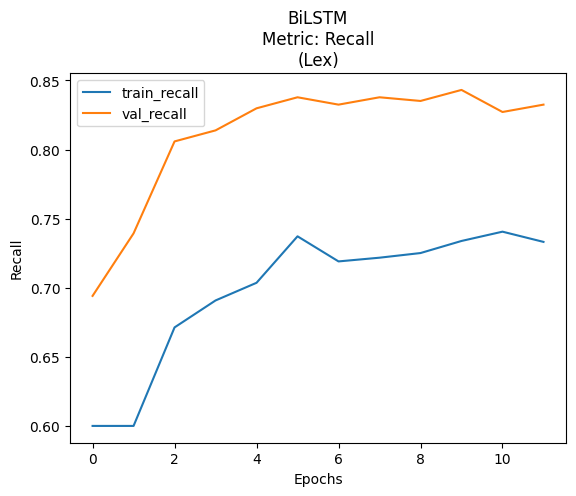



CNN

Epoch 1/12
119/119 [==============================] - 4s 21ms/step - loss: 1.0993 - accuracy: 0.5070 - f1_score: 0.4240 - precision_16: 0.5473 - recall_16: 0.3461 - val_loss: 0.6917 - val_accuracy: 0.5469 - val_f1_score: 0.6424 - val_precision_16: 0.5491 - val_recall_16: 0.7739
Epoch 2/12
119/119 [==============================] - 2s 18ms/step - loss: 0.7257 - accuracy: 0.5606 - f1_score: 0.6376 - precision_16: 0.5617 - recall_16: 0.7372 - val_loss: 0.6635 - val_accuracy: 0.6042 - val_f1_score: 0.6780 - val_precision_16: 0.5924 - val_recall_16: 0.7926
Epoch 3/12
119/119 [==============================] - 2s 18ms/step - loss: 0.6927 - accuracy: 0.6011 - f1_score: 0.6641 - precision_16: 0.5946 - recall_16: 0.7520 - val_loss: 0.6398 - val_accuracy: 0.6392 - val_f1_score: 0.6929 - val_precision_16: 0.6272 - val_recall_16: 0.7739
Epoch 4/12
119/119 [==============================] - 2s 18ms/step - loss: 0.6634 - accuracy: 0.6209 - f1_score: 0.6741 - precision_16: 0.6136 - recall_16: 

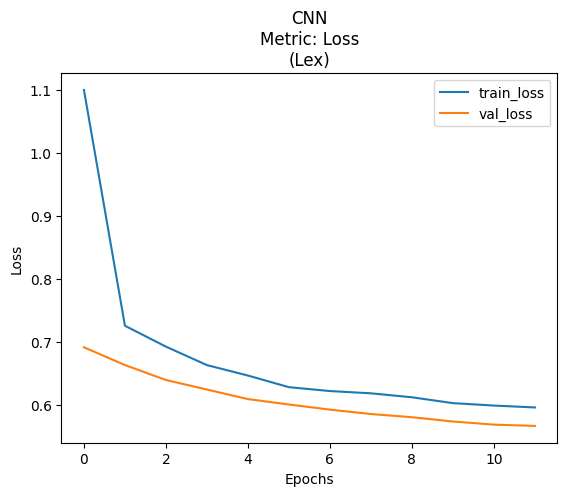

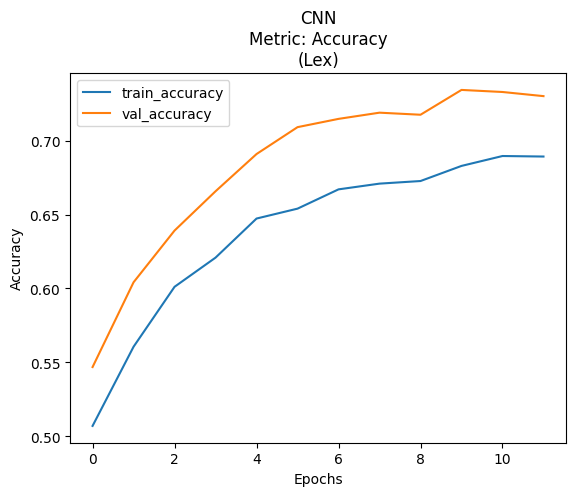

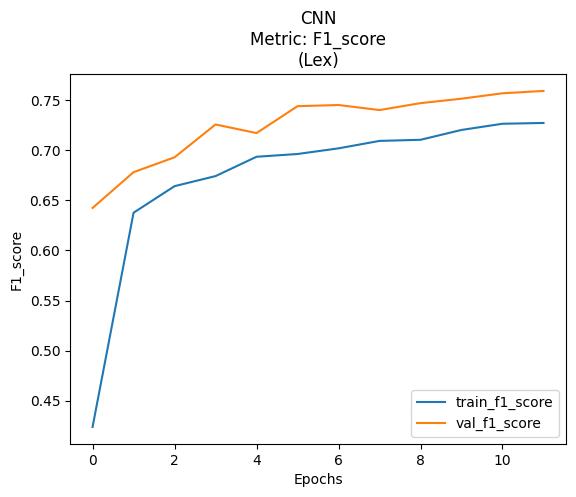

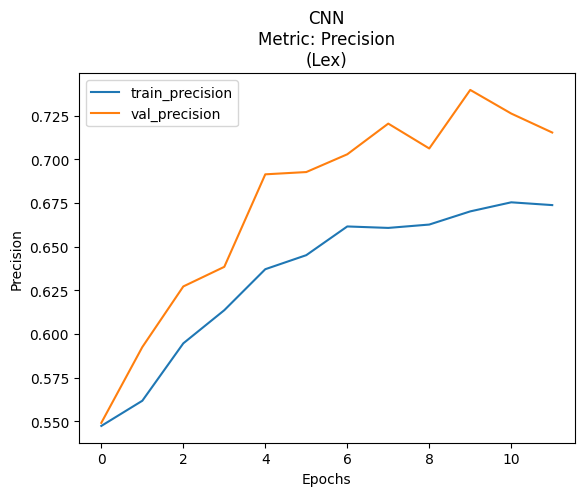

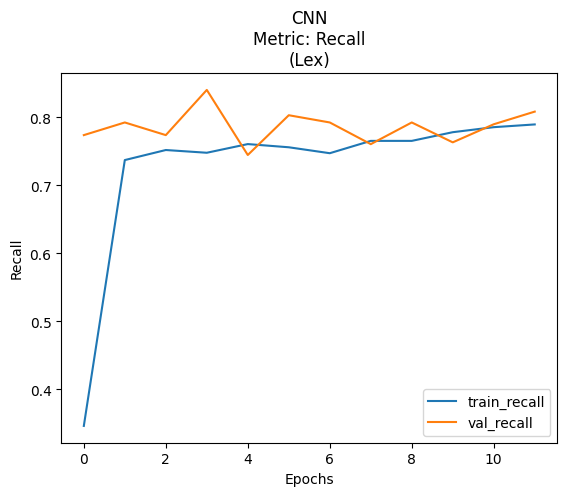



BiGRU

Epoch 1/12
119/119 [==============================] - 9s 19ms/step - loss: 0.7134 - accuracy: 0.5599 - f1_score: 0.6878 - precision_17: 0.5476 - recall_17: 0.9247 - val_loss: 0.6219 - val_accuracy: 0.6727 - val_f1_score: 0.7451 - val_precision_17: 0.6310 - val_recall_17: 0.9096
Epoch 2/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6243 - accuracy: 0.6554 - f1_score: 0.7122 - precision_17: 0.6335 - recall_17: 0.8132 - val_loss: 0.5810 - val_accuracy: 0.7371 - val_f1_score: 0.7638 - val_precision_17: 0.7238 - val_recall_17: 0.8085
Epoch 3/12
119/119 [==============================] - 1s 10ms/step - loss: 0.5963 - accuracy: 0.6818 - f1_score: 0.7165 - precision_17: 0.6724 - recall_17: 0.7668 - val_loss: 0.5620 - val_accuracy: 0.7301 - val_f1_score: 0.7522 - val_precision_17: 0.7270 - val_recall_17: 0.7793
Epoch 4/12
119/119 [==============================] - 1s 10ms/step - loss: 0.5789 - accuracy: 0.7079 - f1_score: 0.7339 - precision_17: 0.7025 - recall_17

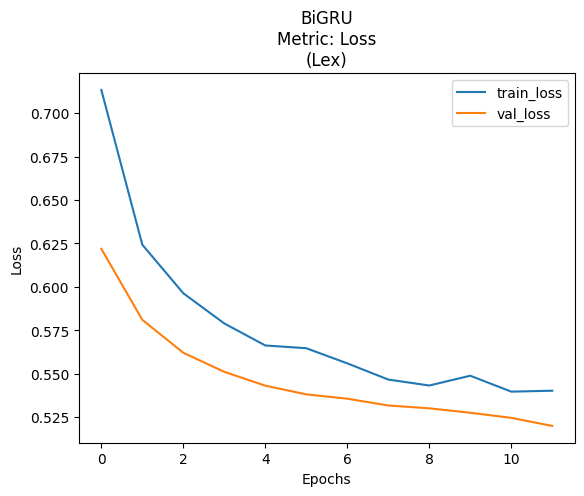

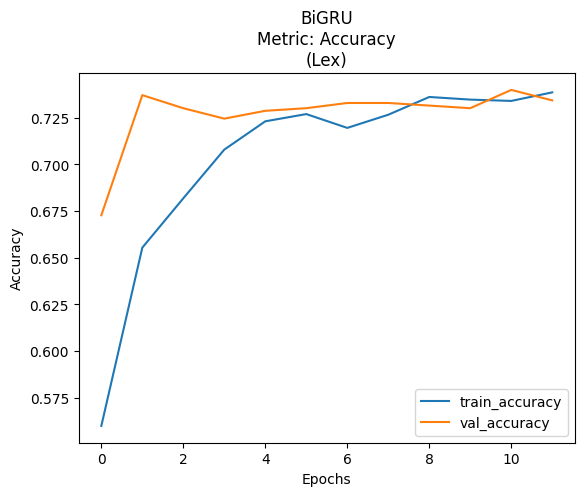

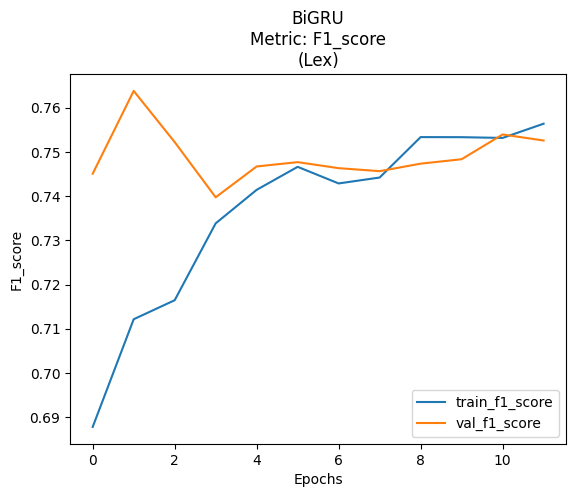

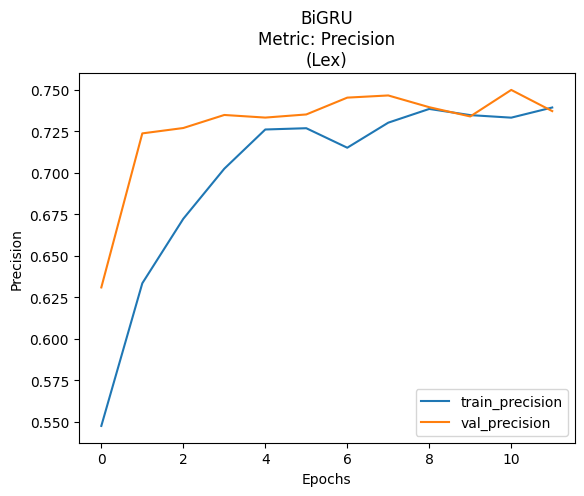

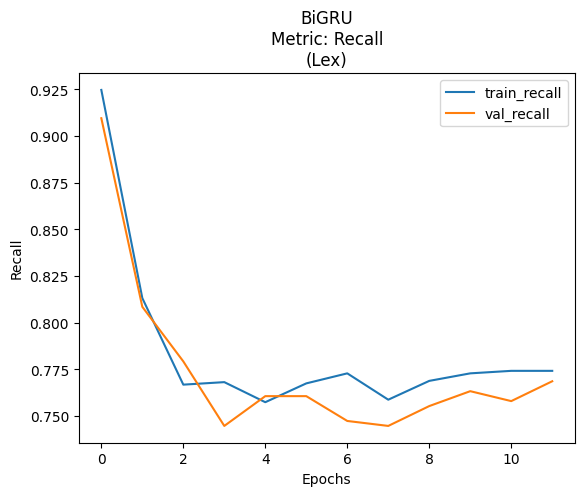

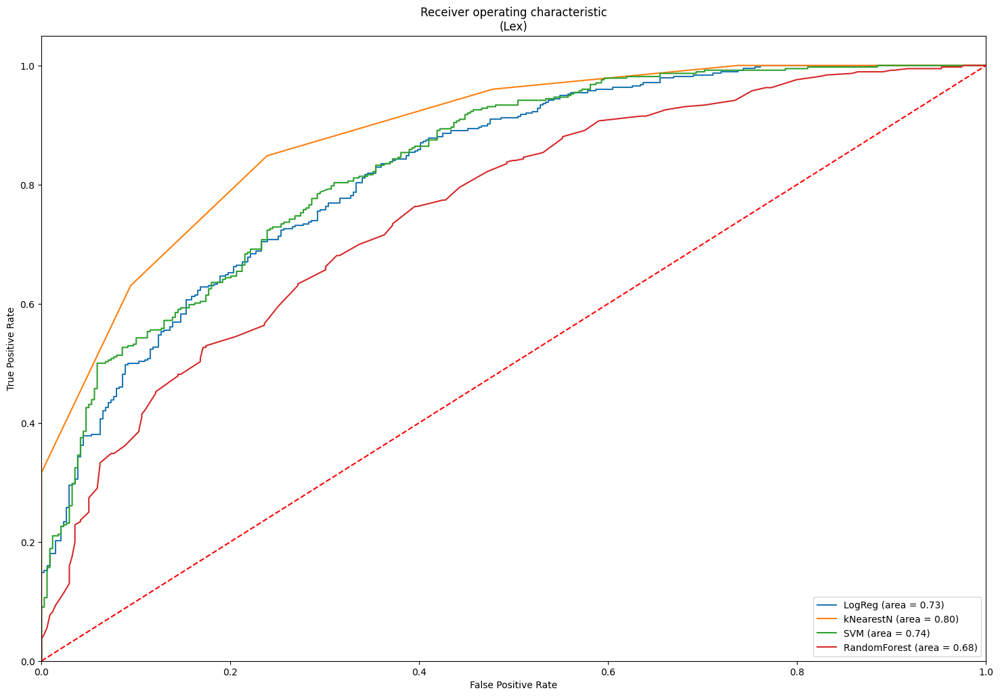

23/23 [==============================] - 1s 66ms/step


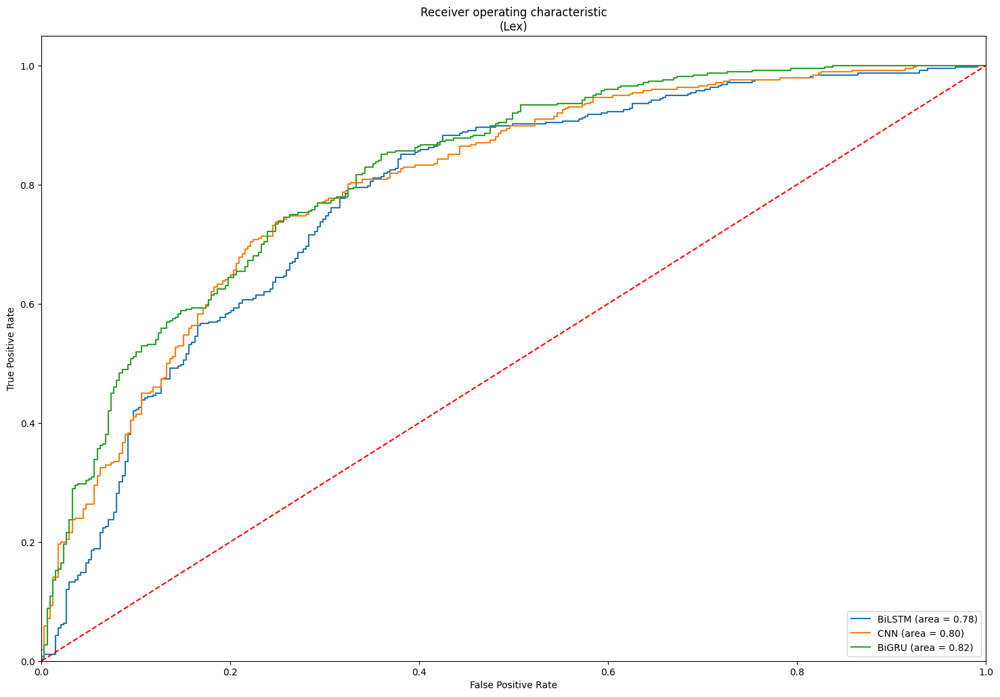

23/23 [==============================] - 0s 5ms/step


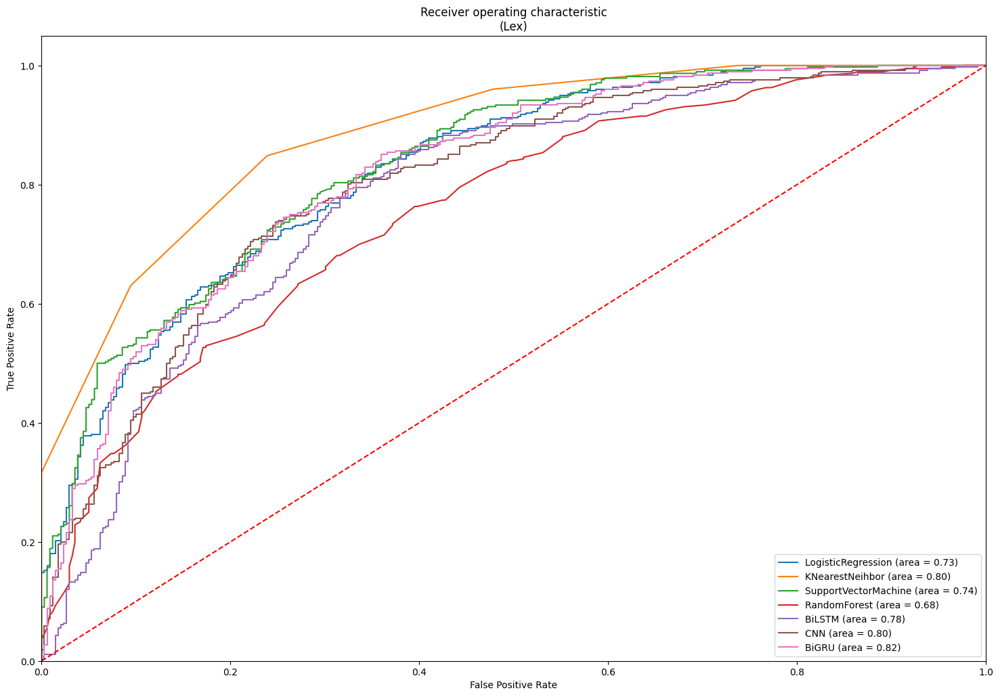

  adding: kaggle/working/results/Word2Vec/Lex/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/Lex/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/Lex/modelBiGRU/modelBiGRU_recall_Lex.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/Lex/modelBiGRU/modelBiGRU_f1_score_Lex.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/Lex/modelBiGRU/modelBiGRU_loss_Lex.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/Lex/modelBiGRU/modelBiGRU_precision_Lex.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/Lex/modelBiGRU/modelBiGRU_accuracy_Lex.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/Lex/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/Lex/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/Lex/Algorithms/SupportVectorMachine/SVM_NoScaling_Lex.txt (deflated 51%)
  adding: kaggle/working/results/Word2Vec/Lex/Algorithms/KNearestNeighbors/ (stored 0%)
  adding: ka

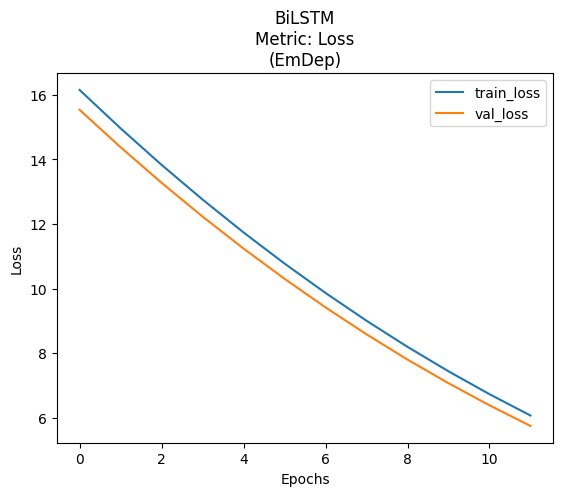

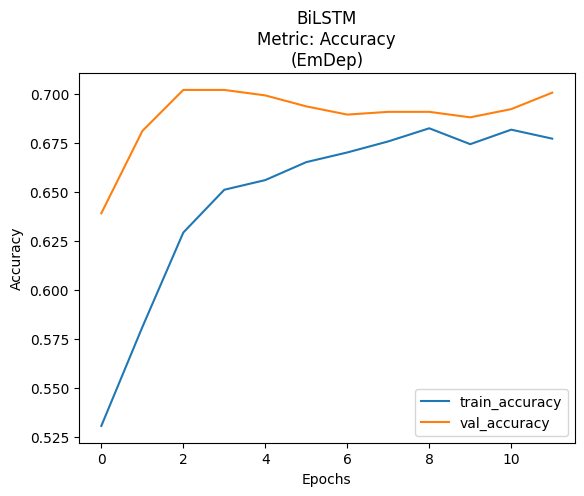

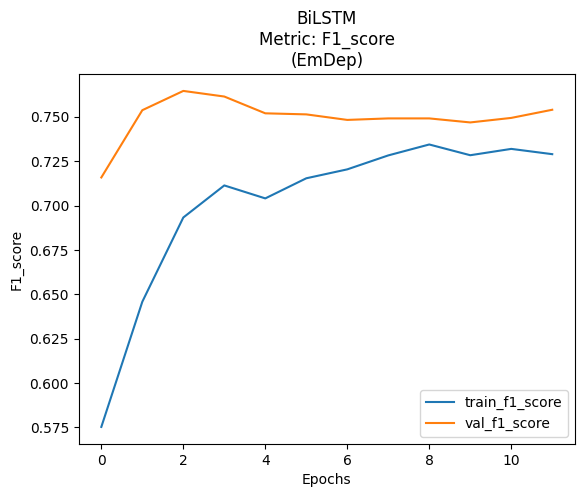

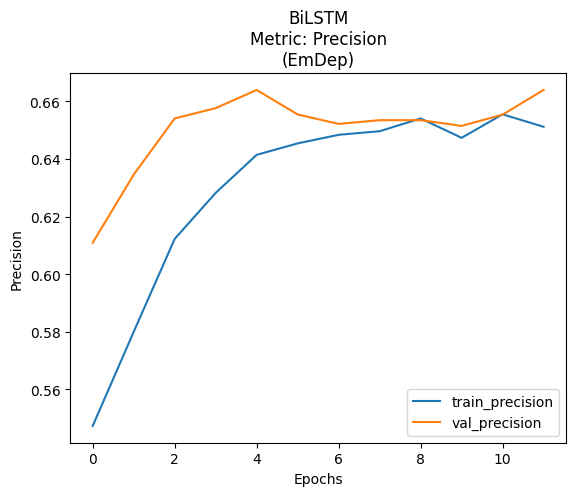

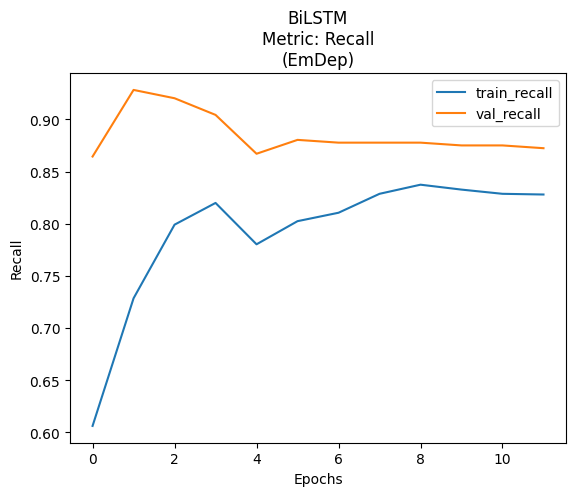



CNN

Epoch 1/12
119/119 [==============================] - 4s 18ms/step - loss: 0.7094 - accuracy: 0.4605 - f1_score: 0.2671 - precision_19: 0.4642 - recall_19: 0.1875 - val_loss: 0.7045 - val_accuracy: 0.3846 - val_f1_score: 0.2787 - val_precision_19: 0.3632 - val_recall_19: 0.2261
Epoch 2/12
119/119 [==============================] - 2s 14ms/step - loss: 0.7012 - accuracy: 0.4387 - f1_score: 0.4741 - precision_19: 0.4659 - recall_19: 0.4825 - val_loss: 0.6991 - val_accuracy: 0.4210 - val_f1_score: 0.5539 - val_precision_19: 0.4656 - val_recall_19: 0.6835
Epoch 3/12
119/119 [==============================] - 2s 14ms/step - loss: 0.6945 - accuracy: 0.4915 - f1_score: 0.6155 - precision_19: 0.5099 - recall_19: 0.7762 - val_loss: 0.6948 - val_accuracy: 0.4797 - val_f1_score: 0.6388 - val_precision_19: 0.5031 - val_recall_19: 0.8750
Epoch 4/12
119/119 [==============================] - 2s 14ms/step - loss: 0.6886 - accuracy: 0.5345 - f1_score: 0.6493 - precision_19: 0.5366 - recall_19: 

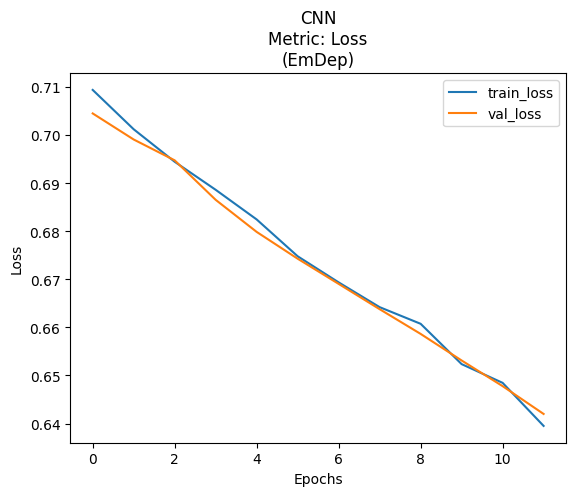

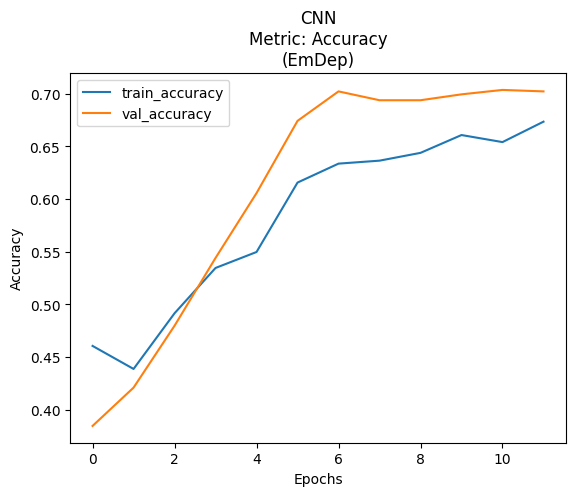

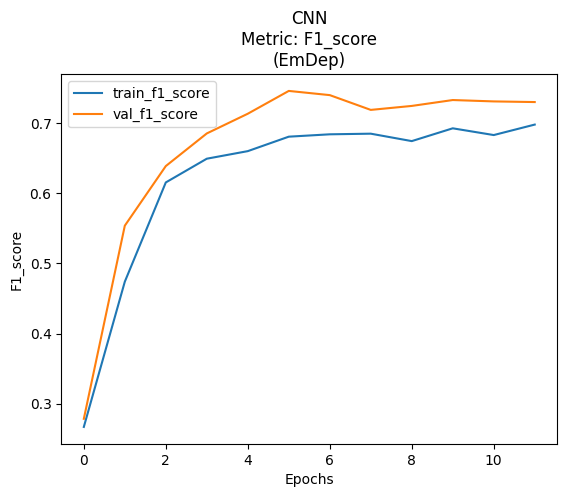

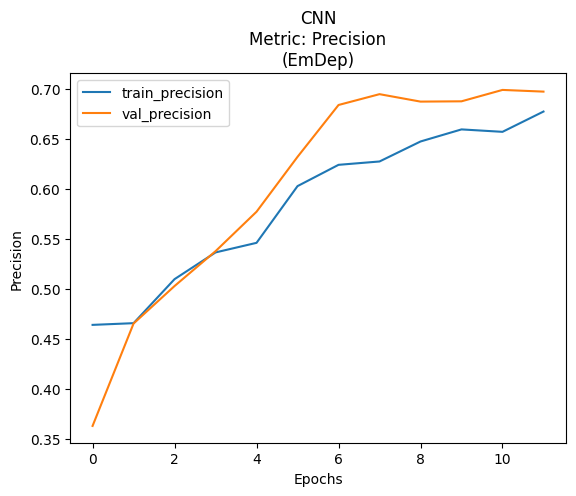

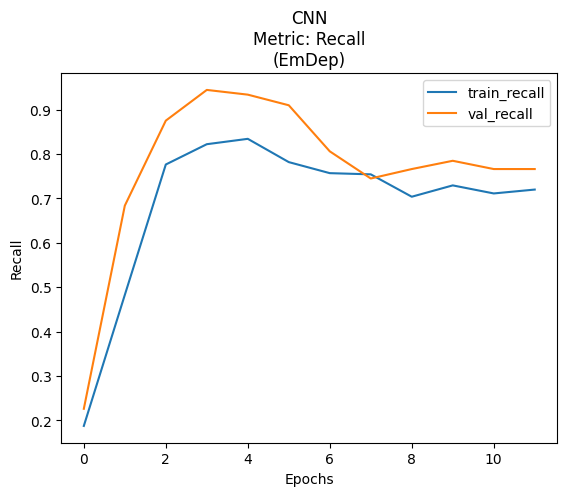



BiGRU

Epoch 1/12
119/119 [==============================] - 6s 16ms/step - loss: 0.6675 - accuracy: 0.6212 - f1_score: 0.6157 - precision_20: 0.6578 - recall_20: 0.5786 - val_loss: 0.6446 - val_accuracy: 0.6895 - val_f1_score: 0.7344 - val_precision_20: 0.6674 - val_recall_20: 0.8165
Epoch 2/12
119/119 [==============================] - 1s 10ms/step - loss: 0.6385 - accuracy: 0.6853 - f1_score: 0.7118 - precision_20: 0.6847 - recall_20: 0.7413 - val_loss: 0.6198 - val_accuracy: 0.7049 - val_f1_score: 0.7442 - val_precision_20: 0.6837 - val_recall_20: 0.8165
Epoch 3/12
119/119 [==============================] - 1s 10ms/step - loss: 0.6178 - accuracy: 0.6906 - f1_score: 0.7188 - precision_20: 0.6867 - recall_20: 0.7540 - val_loss: 0.6006 - val_accuracy: 0.7049 - val_f1_score: 0.7455 - val_precision_20: 0.6821 - val_recall_20: 0.8218
Epoch 4/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6011 - accuracy: 0.7054 - f1_score: 0.7334 - precision_20: 0.6978 - recall_20

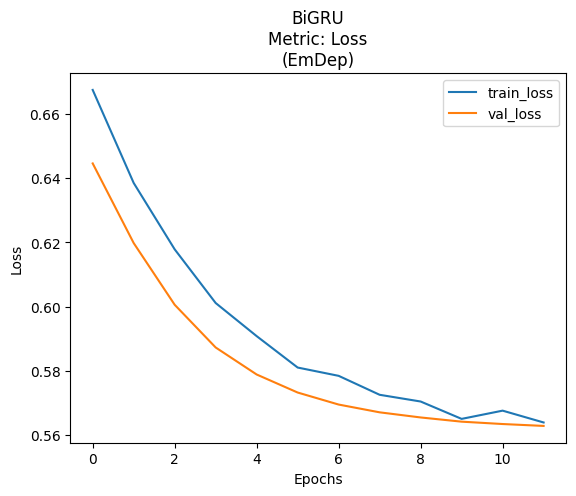

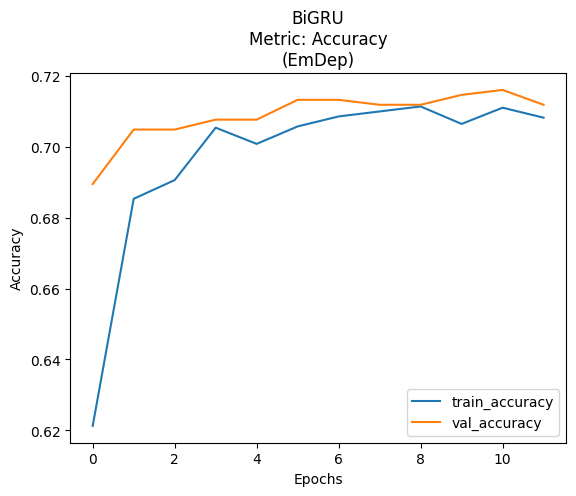

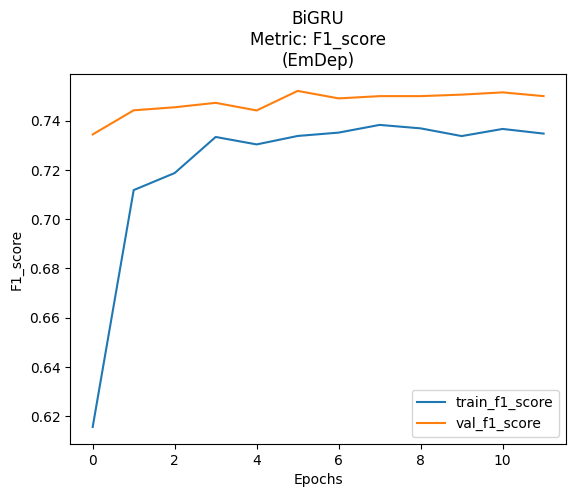

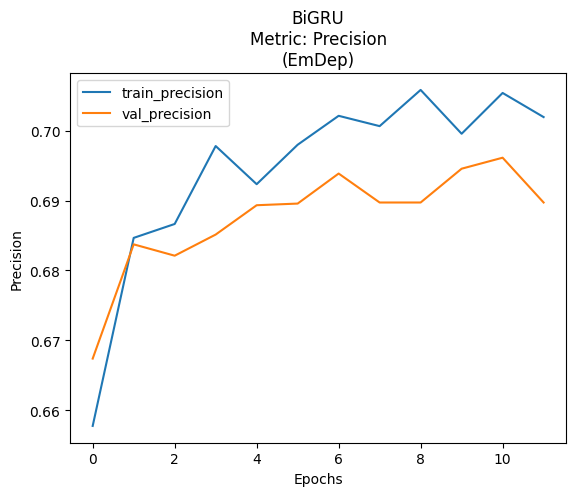

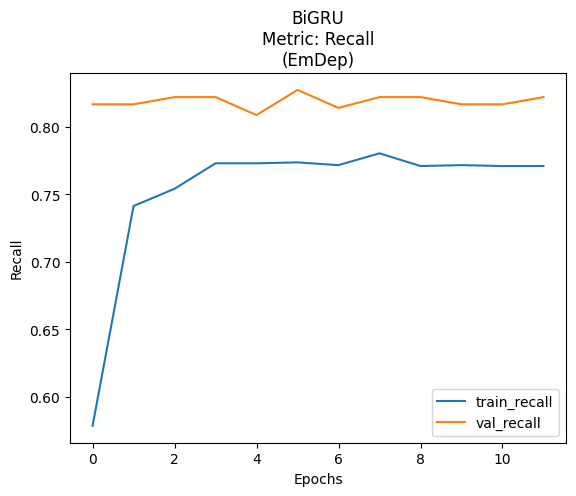

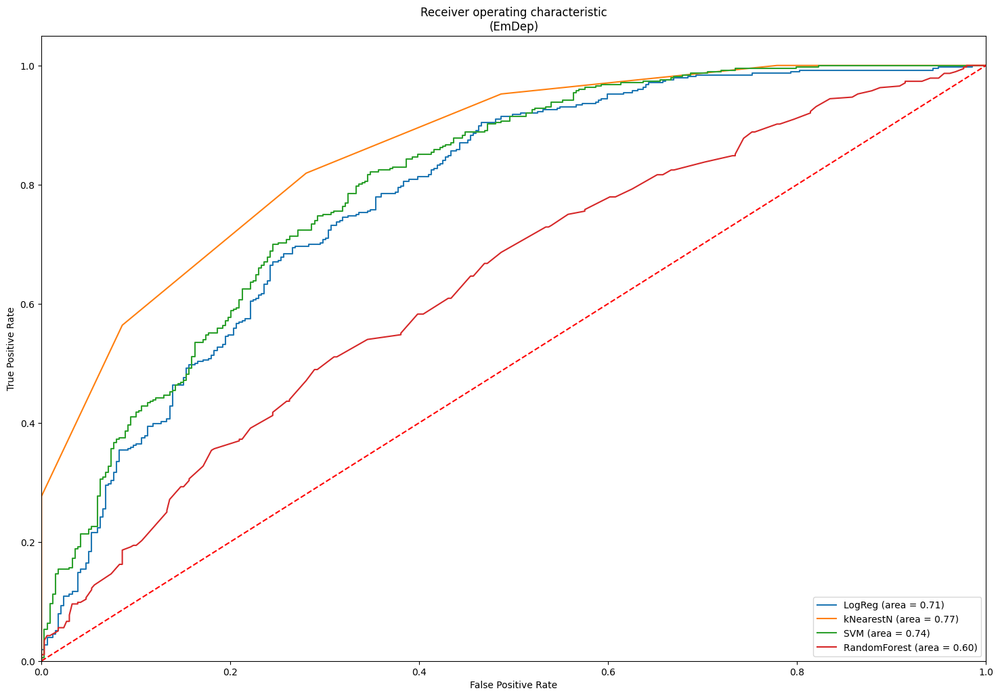

23/23 [==============================] - 0s 4ms/step


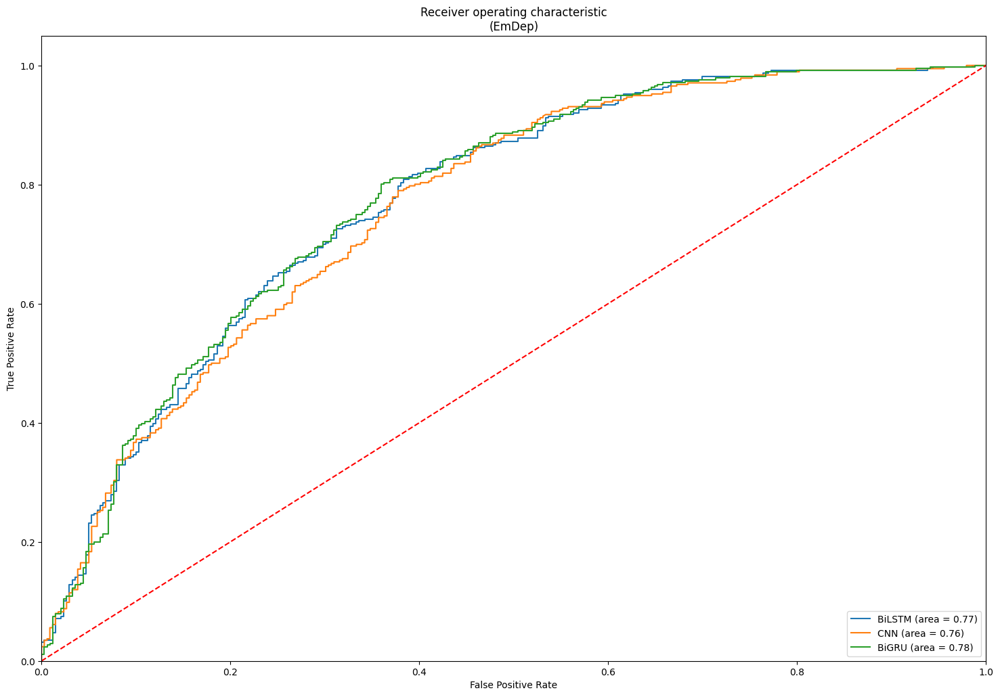

23/23 [==============================] - 0s 4ms/step


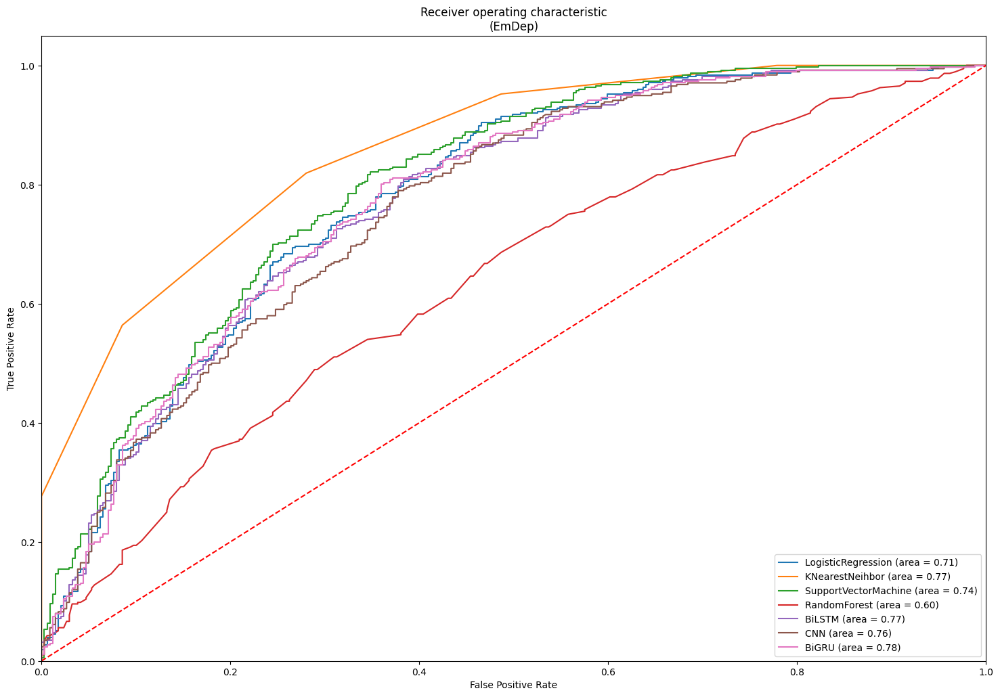

  adding: kaggle/working/results/Word2Vec/EmDep/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/EmDep/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/EmDep/modelBiGRU/modelBiGRU_loss_EmDep.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/EmDep/modelBiGRU/modelBiGRU_precision_EmDep.png (deflated 11%)
  adding: kaggle/working/results/Word2Vec/EmDep/modelBiGRU/modelBiGRU_recall_EmDep.png (deflated 19%)
  adding: kaggle/working/results/Word2Vec/EmDep/modelBiGRU/modelBiGRU_f1_score_EmDep.png (deflated 17%)
  adding: kaggle/working/results/Word2Vec/EmDep/modelBiGRU/modelBiGRU_accuracy_EmDep.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/EmDep/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/EmDep/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/EmDep/Algorithms/SupportVectorMachine/SVM_NoScaling_EmDep.txt (deflated 52%)
  adding: kaggle/working/results/Word2Vec/EmDep/Algorithms/KNearestN

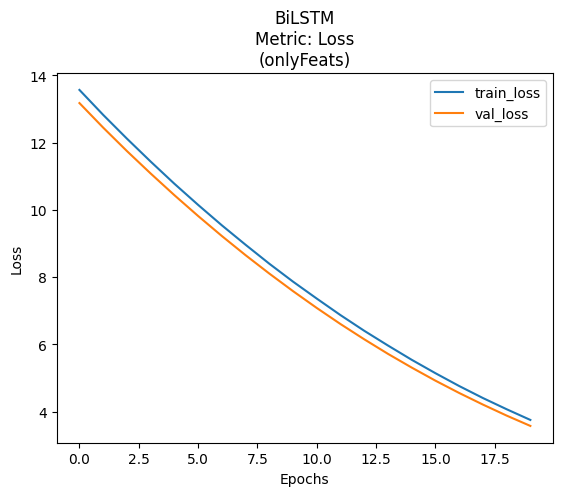

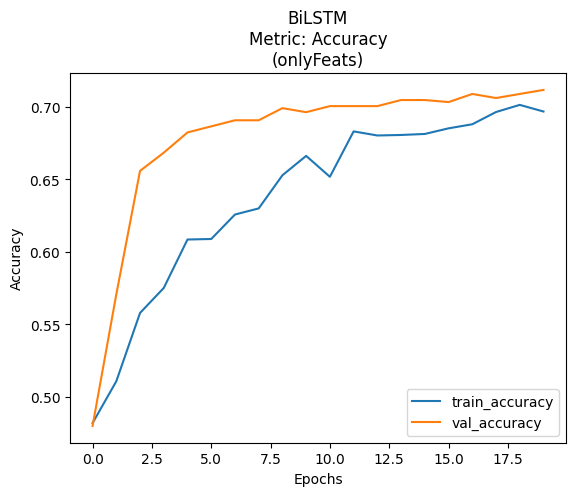

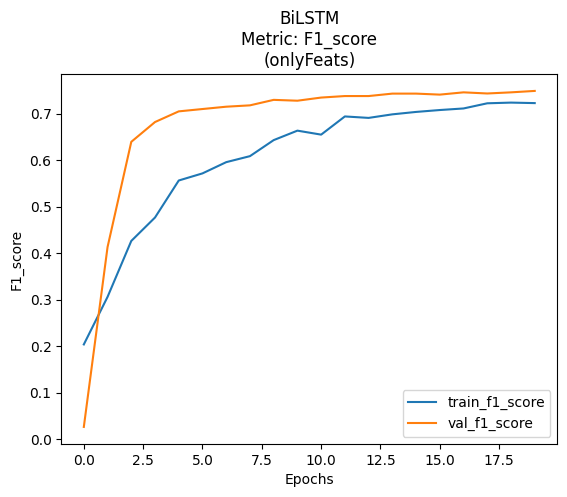

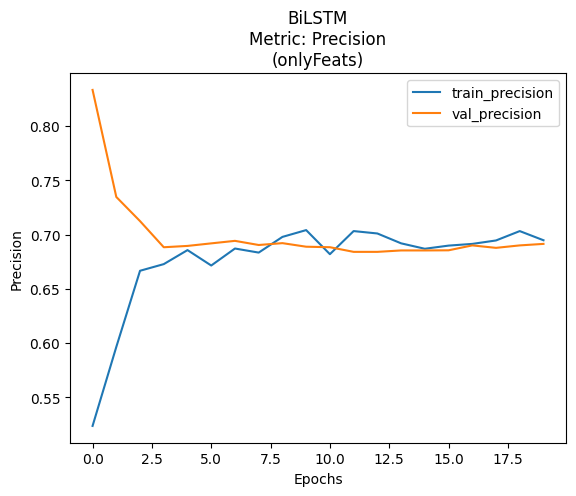

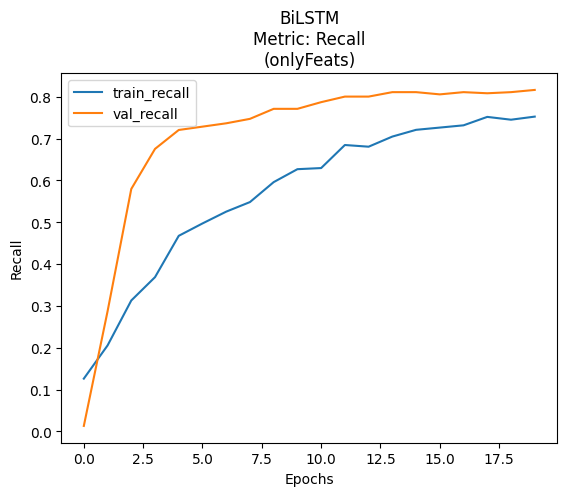



CNN

Epoch 1/20
119/119 [==============================] - 3s 14ms/step - loss: 3.1857 - accuracy: 0.4732 - f1_score: 0.1333 - precision_22: 0.4852 - recall_22: 0.0773 - val_loss: 1.1284 - val_accuracy: 0.4811 - val_f1_score: 0.2960 - val_precision_22: 0.5166 - val_recall_22: 0.2074
Epoch 2/20
119/119 [==============================] - 1s 10ms/step - loss: 1.3213 - accuracy: 0.5035 - f1_score: 0.4988 - precision_22: 0.5299 - recall_22: 0.4711 - val_loss: 0.8713 - val_accuracy: 0.5315 - val_f1_score: 0.5677 - val_precision_22: 0.5514 - val_recall_22: 0.5851
Epoch 3/20
119/119 [==============================] - 1s 10ms/step - loss: 1.0951 - accuracy: 0.5317 - f1_score: 0.5503 - precision_22: 0.5542 - recall_22: 0.5464 - val_loss: 0.7822 - val_accuracy: 0.5720 - val_f1_score: 0.5797 - val_precision_22: 0.5994 - val_recall_22: 0.5612
Epoch 4/20
119/119 [==============================] - 1s 10ms/step - loss: 0.9917 - accuracy: 0.5578 - f1_score: 0.5727 - precision_22: 0.5804 - recall_22: 

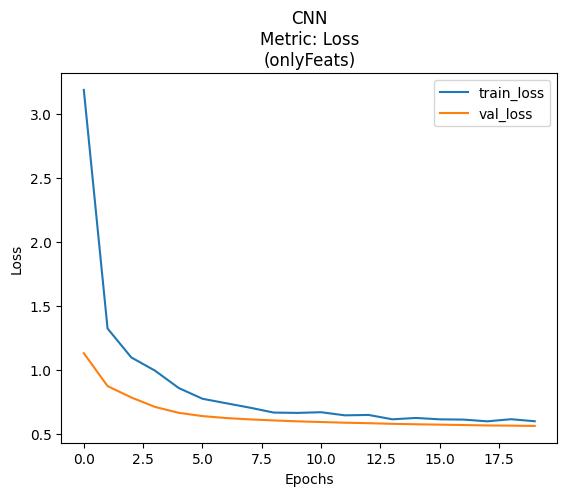

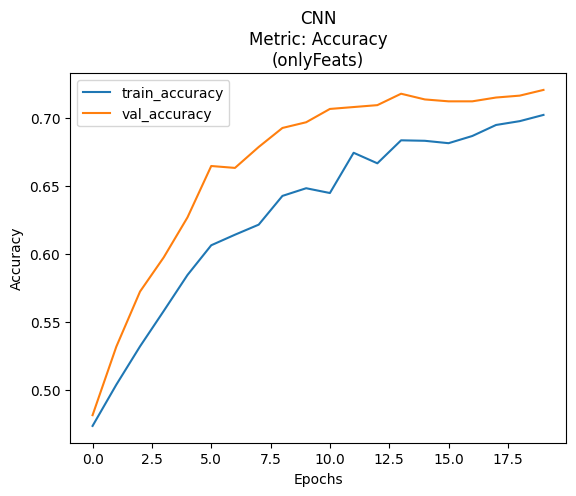

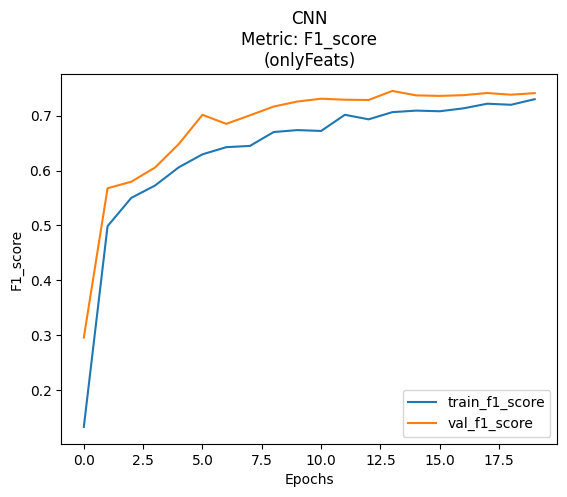

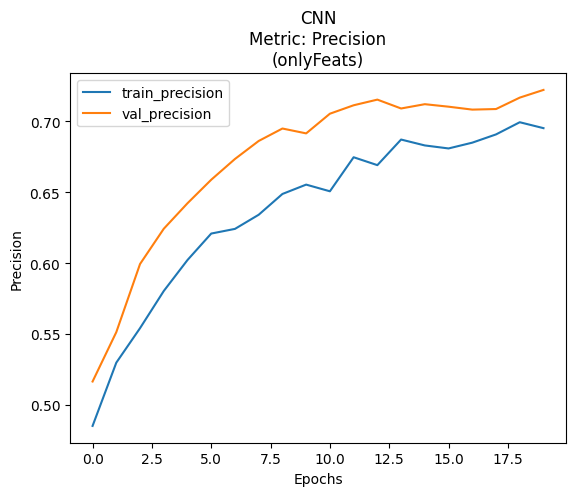

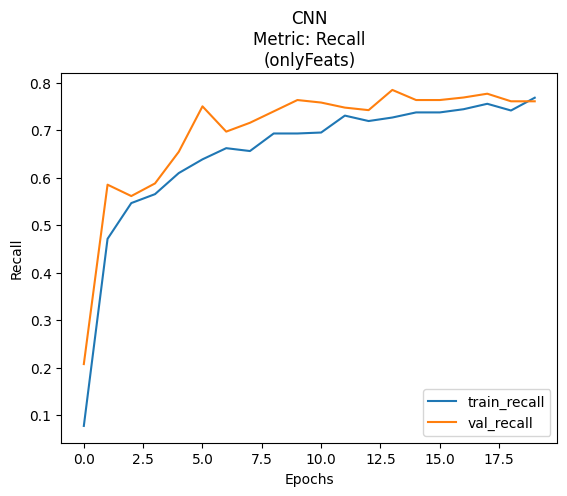



BiGRU

Epoch 1/20
119/119 [==============================] - 7s 16ms/step - loss: 0.6959 - accuracy: 0.5310 - f1_score: 0.5626 - precision_23: 0.5505 - recall_23: 0.5753 - val_loss: 0.6643 - val_accuracy: 0.6028 - val_f1_score: 0.6858 - val_precision_23: 0.5871 - val_recall_23: 0.8245
Epoch 2/20
119/119 [==============================] - 1s 9ms/step - loss: 0.6679 - accuracy: 0.6029 - f1_score: 0.6407 - precision_23: 0.6095 - recall_23: 0.6754 - val_loss: 0.6437 - val_accuracy: 0.6573 - val_f1_score: 0.7187 - val_precision_23: 0.6323 - val_recall_23: 0.8324
Epoch 3/20
119/119 [==============================] - 1s 8ms/step - loss: 0.6548 - accuracy: 0.6145 - f1_score: 0.6500 - precision_23: 0.6203 - recall_23: 0.6828 - val_loss: 0.6250 - val_accuracy: 0.6839 - val_f1_score: 0.7322 - val_precision_23: 0.6603 - val_recall_23: 0.8218
Epoch 4/20
119/119 [==============================] - 1s 9ms/step - loss: 0.6297 - accuracy: 0.6522 - f1_score: 0.6786 - precision_23: 0.6582 - recall_23: 0

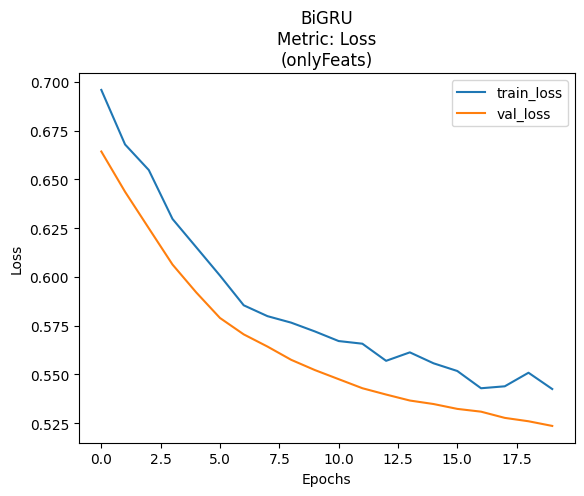

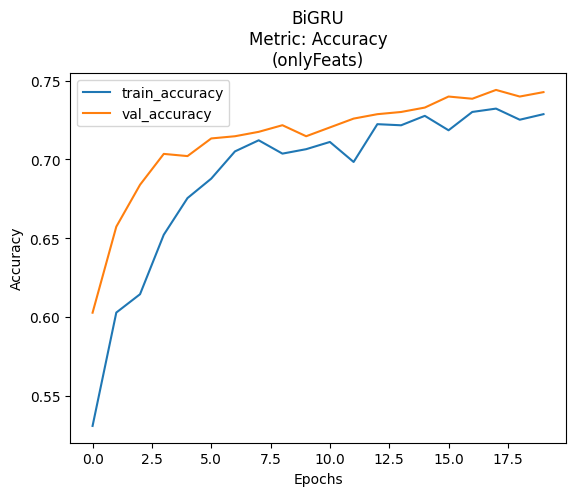

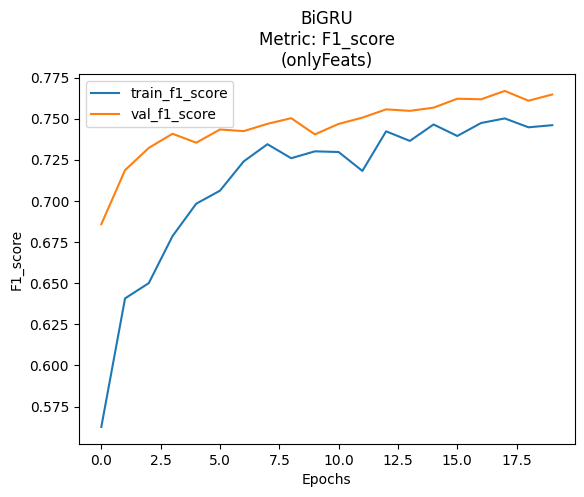

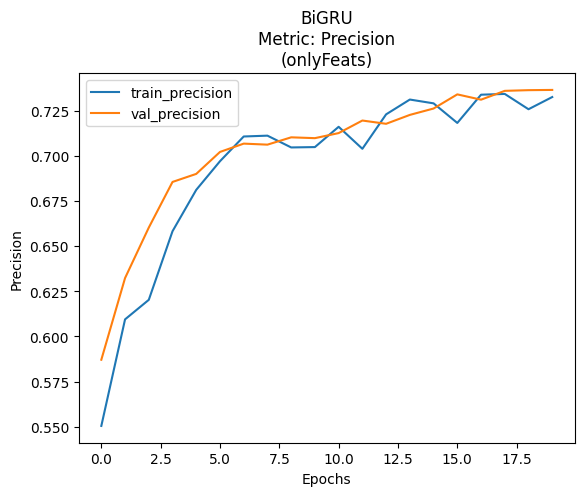

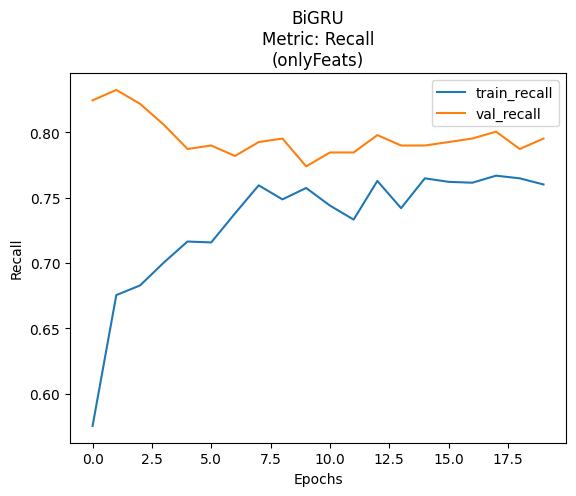

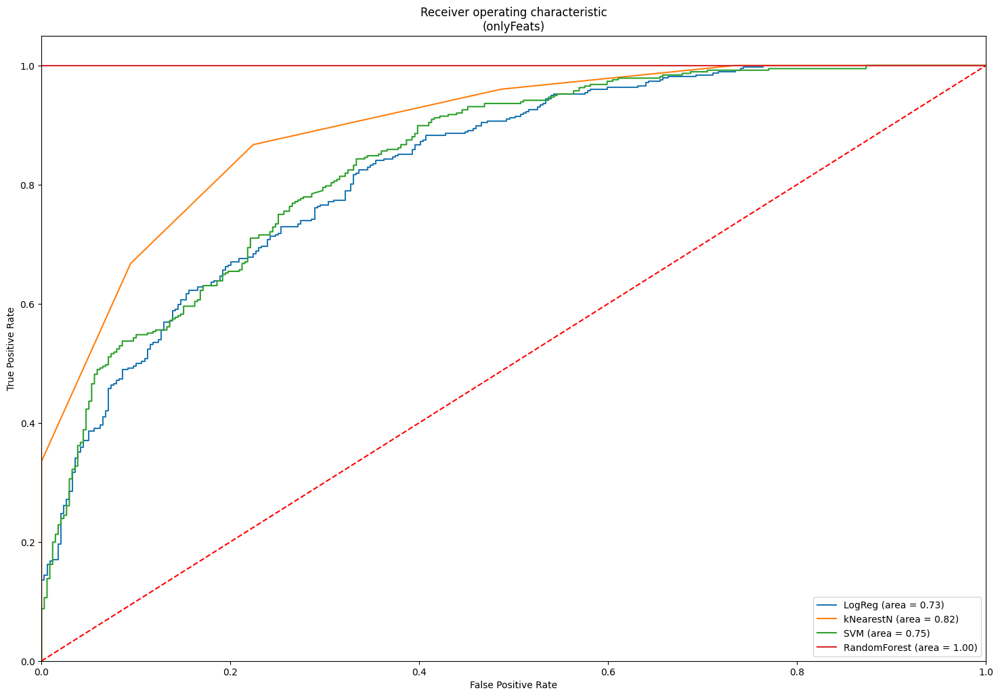

23/23 [==============================] - 0s 4ms/step


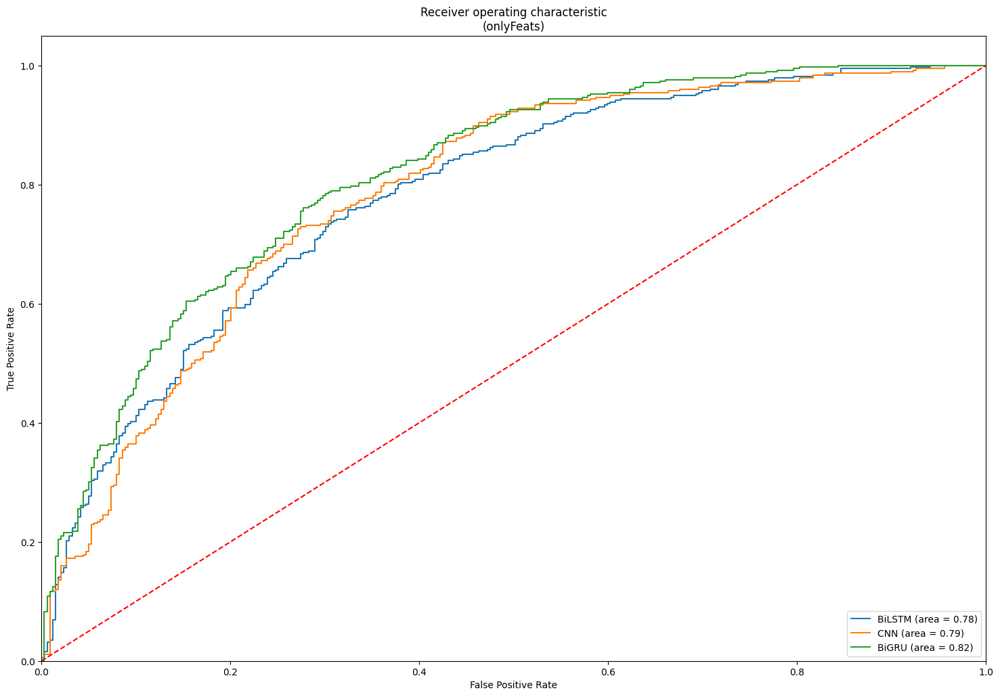

23/23 [==============================] - 0s 4ms/step


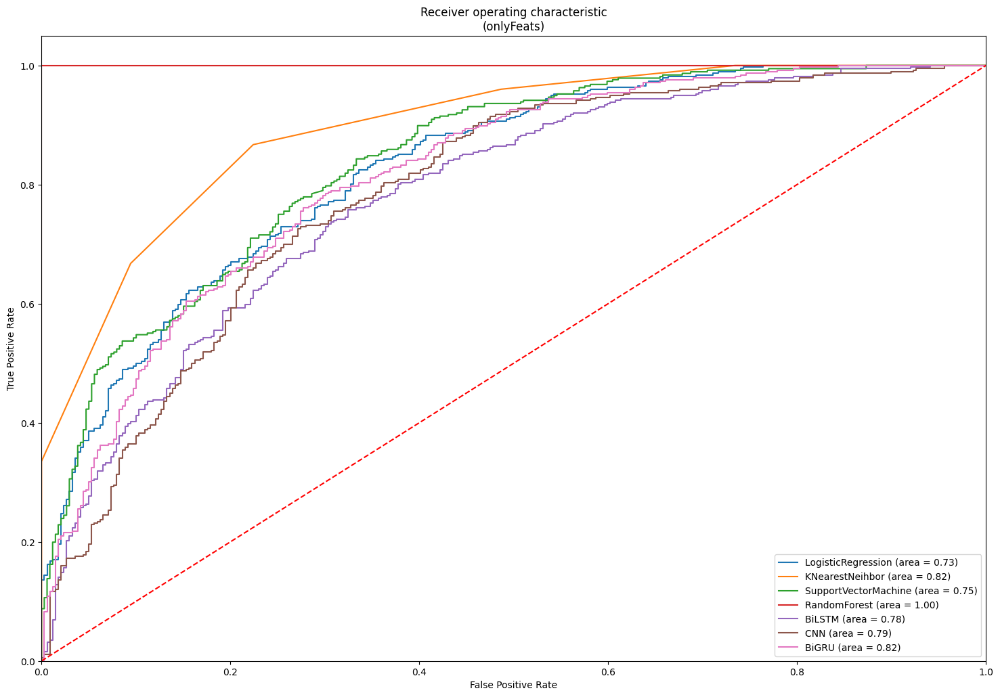

  adding: kaggle/working/results/Word2Vec/onlyFeats/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/modelBiGRU/modelBiGRU_f1_score_onlyFeats.png (deflated 12%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/modelBiGRU/modelBiGRU_loss_onlyFeats.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/modelBiGRU/modelBiGRU_accuracy_onlyFeats.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/modelBiGRU/modelBiGRU_recall_onlyFeats.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/modelBiGRU/modelBiGRU_precision_onlyFeats.png (deflated 12%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyFeats/Algorithms/SupportVectorMachine/SVM_NoScaling_onlyFeats.txt (deflated 52%)
  ad

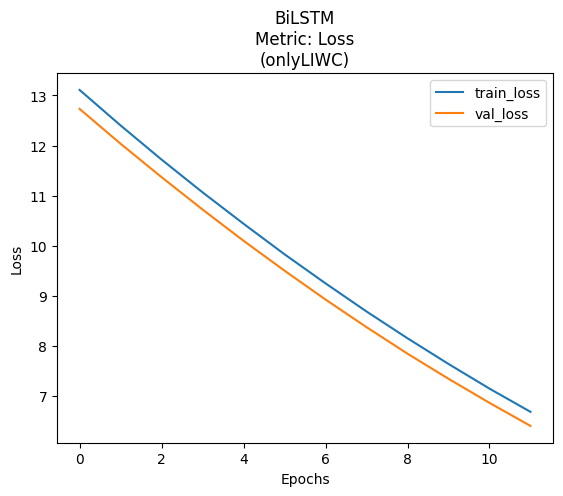

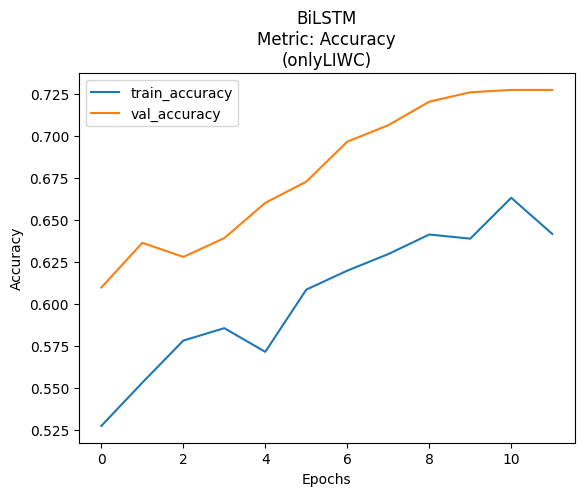

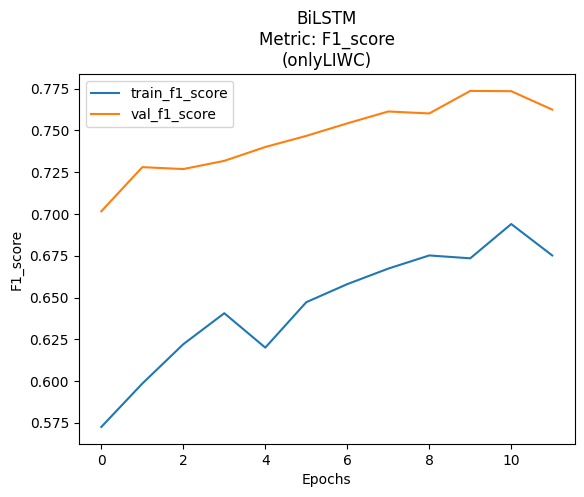

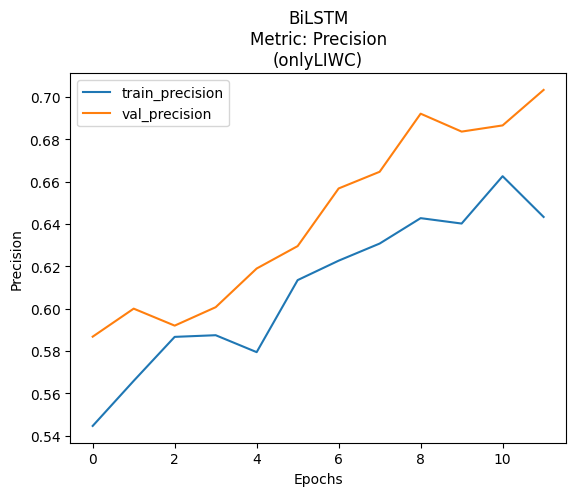

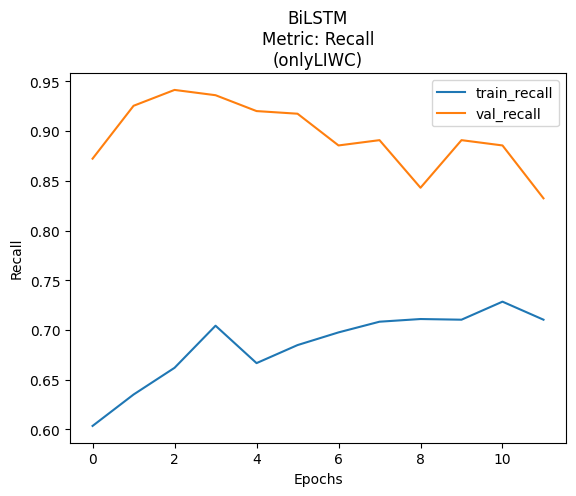



CNN

Epoch 1/12
119/119 [==============================] - 6s 31ms/step - loss: 0.8128 - accuracy: 0.5137 - f1_score: 0.6471 - precision_25: 0.5223 - recall_25: 0.8501 - val_loss: 0.7322 - val_accuracy: 0.5594 - val_f1_score: 0.6878 - val_precision_25: 0.5482 - val_recall_25: 0.9229
Epoch 2/12
119/119 [==============================] - 2s 13ms/step - loss: 0.7028 - accuracy: 0.5645 - f1_score: 0.6448 - precision_25: 0.5633 - recall_25: 0.7540 - val_loss: 0.6903 - val_accuracy: 0.6140 - val_f1_score: 0.6899 - val_precision_25: 0.5973 - val_recall_25: 0.8165
Epoch 3/12
119/119 [==============================] - 2s 13ms/step - loss: 0.6741 - accuracy: 0.6121 - f1_score: 0.6563 - precision_25: 0.6128 - recall_25: 0.7063 - val_loss: 0.6672 - val_accuracy: 0.6364 - val_f1_score: 0.6963 - val_precision_25: 0.6208 - val_recall_25: 0.7926
Epoch 4/12
119/119 [==============================] - 2s 15ms/step - loss: 0.6641 - accuracy: 0.6152 - f1_score: 0.6504 - precision_25: 0.6210 - recall_25: 

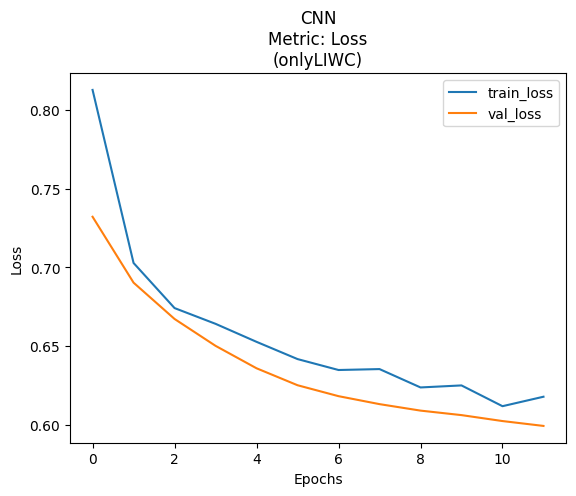

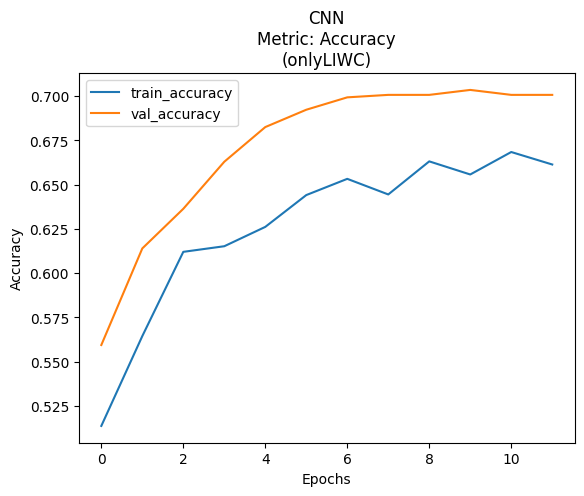

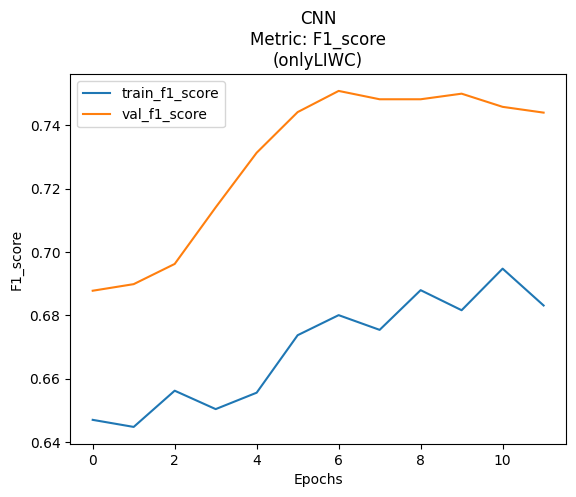

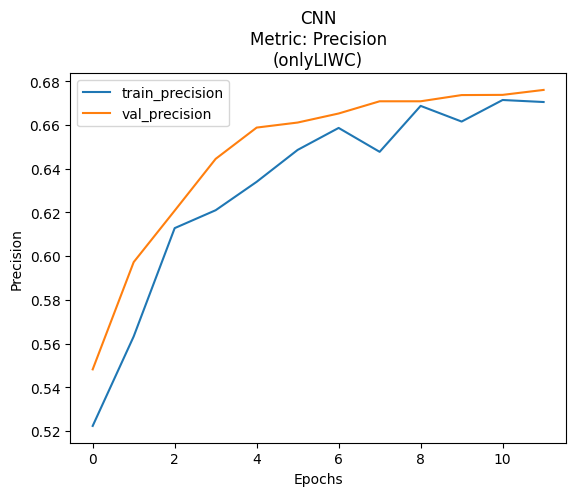

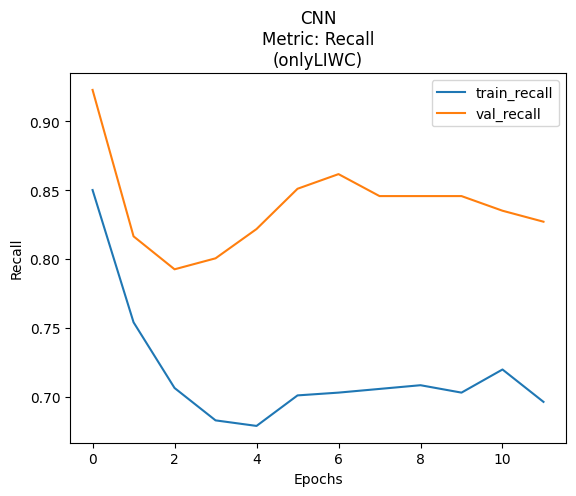



BiGRU

Epoch 1/12
119/119 [==============================] - 8s 18ms/step - loss: 0.7144 - accuracy: 0.4993 - f1_score: 0.6021 - precision_26: 0.5161 - recall_26: 0.7224 - val_loss: 0.6722 - val_accuracy: 0.5804 - val_f1_score: 0.6746 - val_precision_26: 0.5696 - val_recall_26: 0.8271
Epoch 2/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6697 - accuracy: 0.5779 - f1_score: 0.6536 - precision_26: 0.5736 - recall_26: 0.7594 - val_loss: 0.6381 - val_accuracy: 0.6713 - val_f1_score: 0.7245 - val_precision_26: 0.6478 - val_recall_26: 0.8218
Epoch 3/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6444 - accuracy: 0.6350 - f1_score: 0.6883 - precision_26: 0.6231 - recall_26: 0.7688 - val_loss: 0.6108 - val_accuracy: 0.7175 - val_f1_score: 0.7500 - val_precision_26: 0.7014 - val_recall_26: 0.8059
Epoch 4/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6190 - accuracy: 0.6674 - f1_score: 0.7016 - precision_26: 0.6623 - recall_26

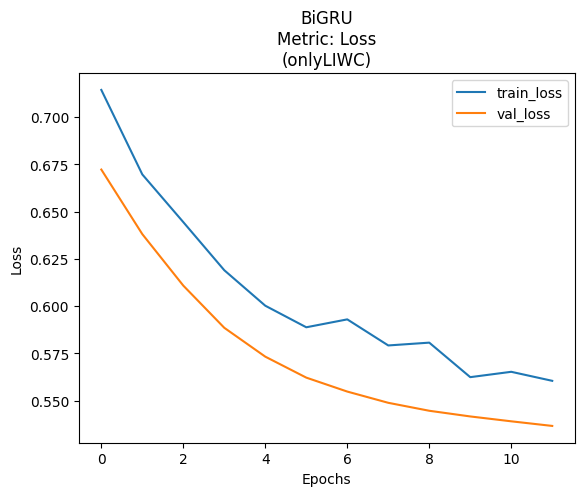

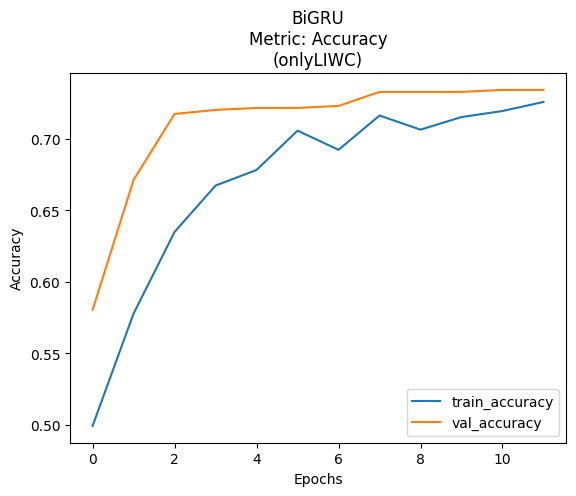

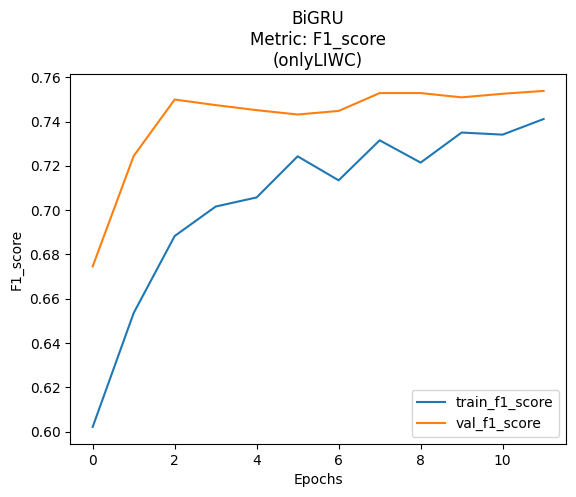

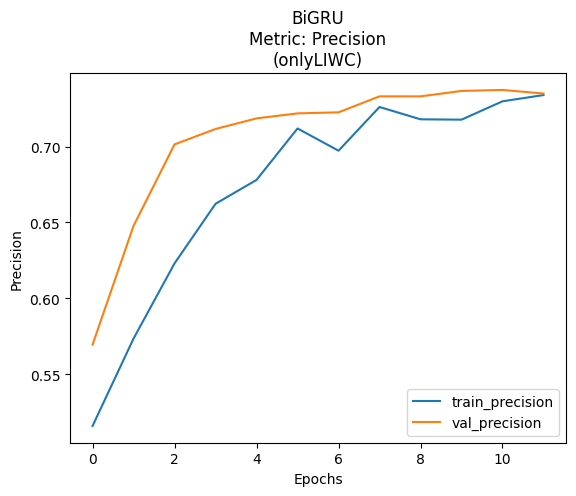

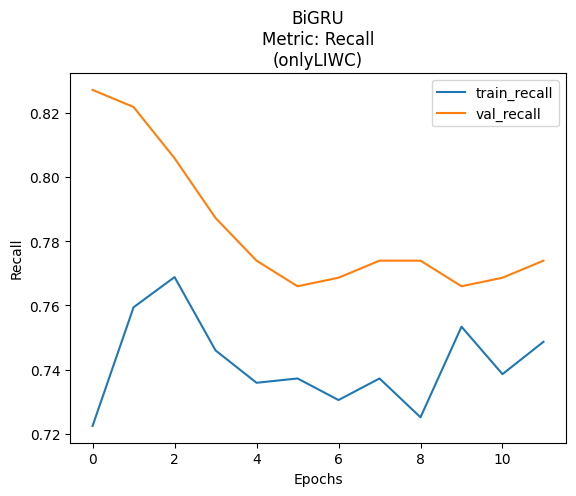

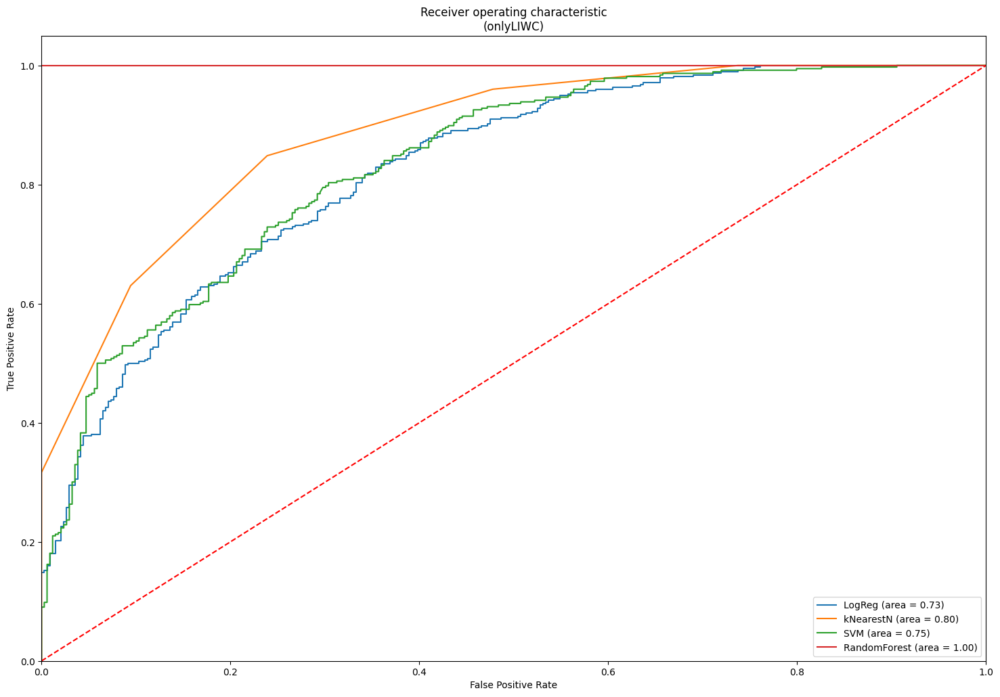

23/23 [==============================] - 0s 4ms/step


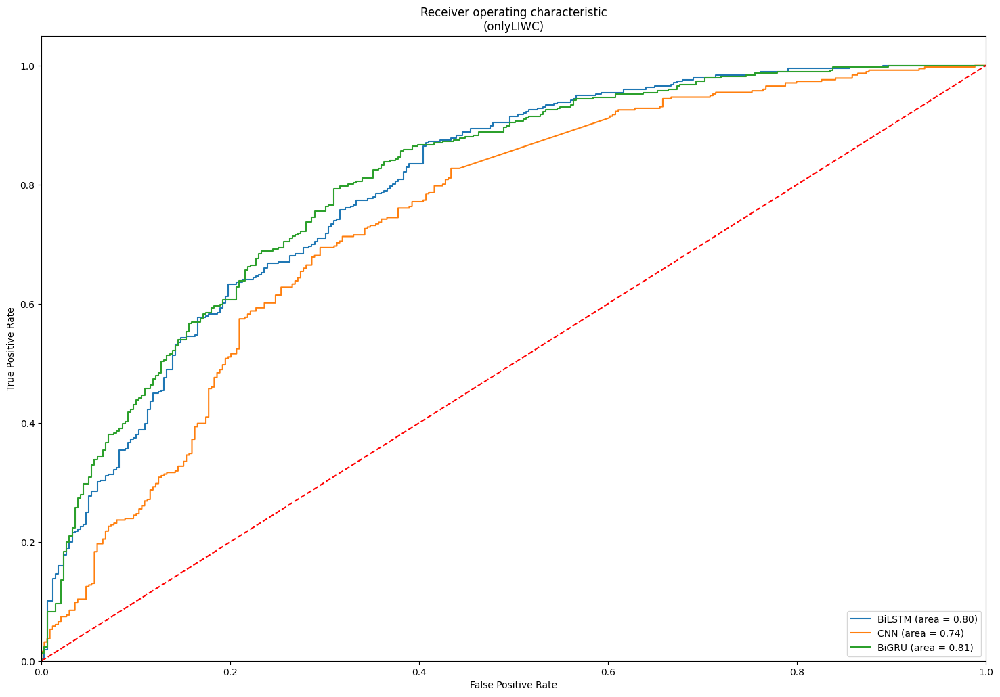

23/23 [==============================] - 0s 4ms/step


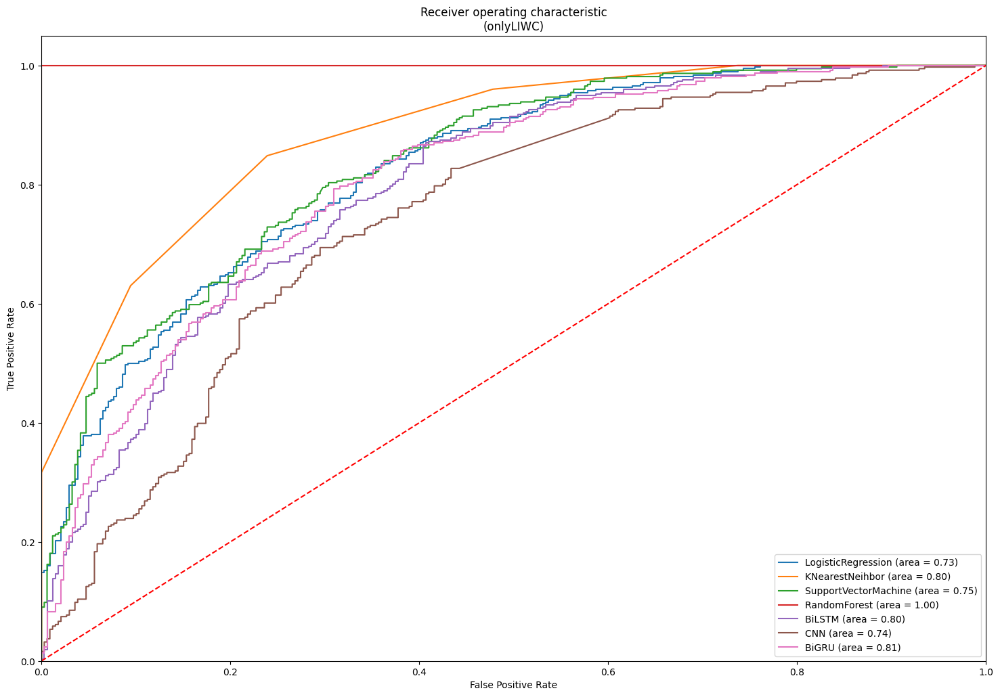

  adding: kaggle/working/results/Word2Vec/onlyLIWC/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/modelBiGRU/modelBiGRU_recall_onlyLIWC.png (deflated 12%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/modelBiGRU/modelBiGRU_accuracy_onlyLIWC.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/modelBiGRU/modelBiGRU_loss_onlyLIWC.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/modelBiGRU/modelBiGRU_precision_onlyLIWC.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/modelBiGRU/modelBiGRU_f1_score_onlyLIWC.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLIWC/Algorithms/SupportVectorMachine/SVM_NoScaling_onlyLIWC.txt (deflated 52%)
  adding: kaggle/wor

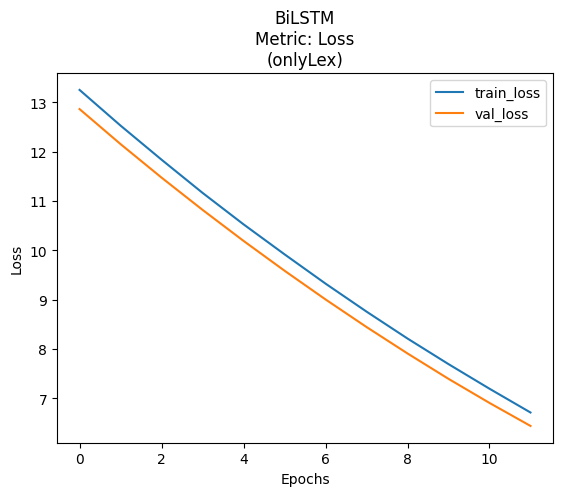

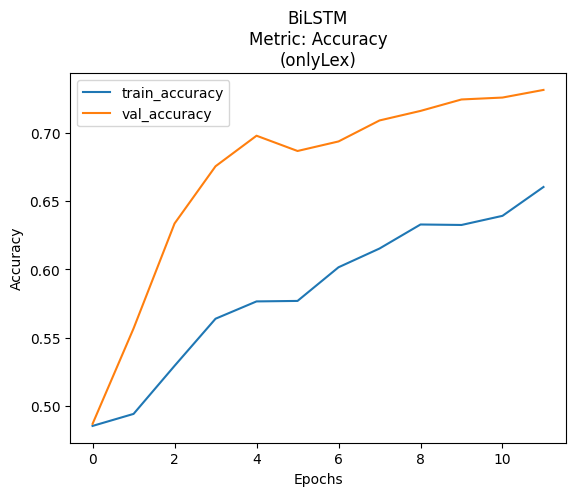

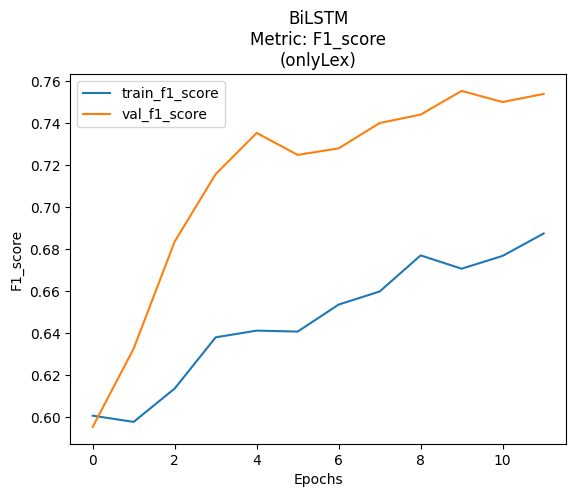

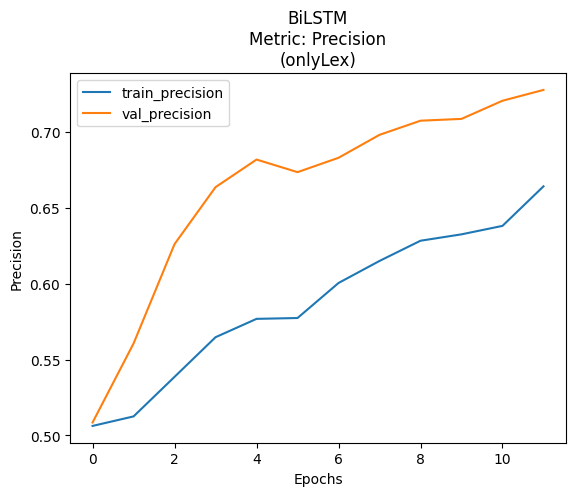

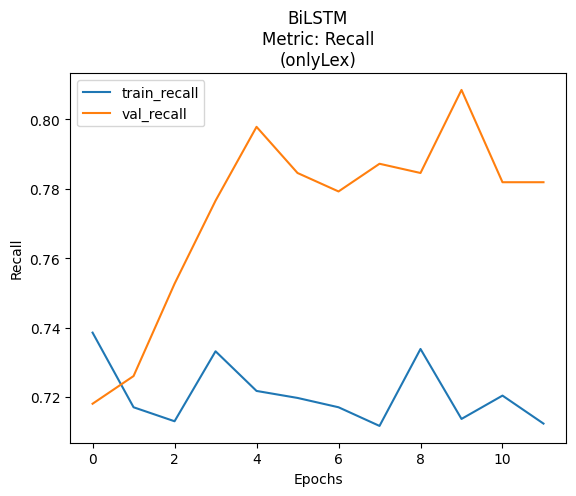



CNN

Epoch 1/12
119/119 [==============================] - 4s 14ms/step - loss: 1.2871 - accuracy: 0.4711 - f1_score: 0.4641 - precision_28: 0.4950 - recall_28: 0.4368 - val_loss: 0.8420 - val_accuracy: 0.5119 - val_f1_score: 0.5643 - val_precision_28: 0.5318 - val_recall_28: 0.6011
Epoch 2/12
119/119 [==============================] - 1s 8ms/step - loss: 1.0380 - accuracy: 0.5074 - f1_score: 0.5386 - precision_28: 0.5292 - recall_28: 0.5484 - val_loss: 0.7871 - val_accuracy: 0.5455 - val_f1_score: 0.6002 - val_precision_28: 0.5584 - val_recall_28: 0.6489
Epoch 3/12
119/119 [==============================] - 1s 10ms/step - loss: 0.9112 - accuracy: 0.5226 - f1_score: 0.5713 - precision_28: 0.5397 - recall_28: 0.6069 - val_loss: 0.7541 - val_accuracy: 0.5762 - val_f1_score: 0.6423 - val_precision_28: 0.5775 - val_recall_28: 0.7234
Epoch 4/12
119/119 [==============================] - 1s 8ms/step - loss: 0.8120 - accuracy: 0.5472 - f1_score: 0.6095 - precision_28: 0.5563 - recall_28: 0.

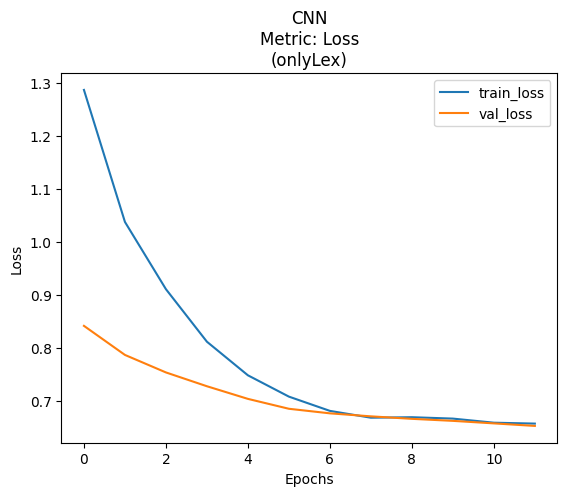

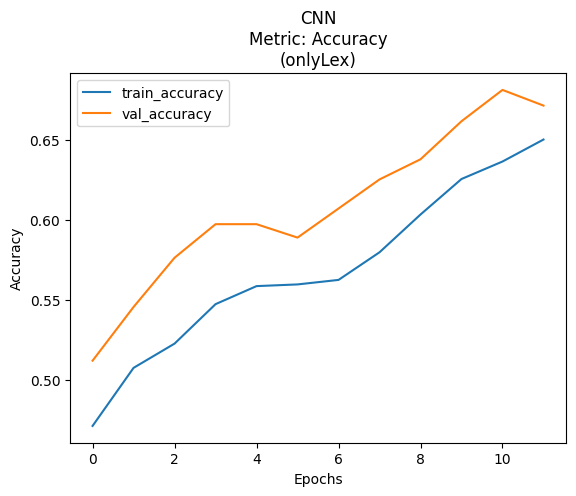

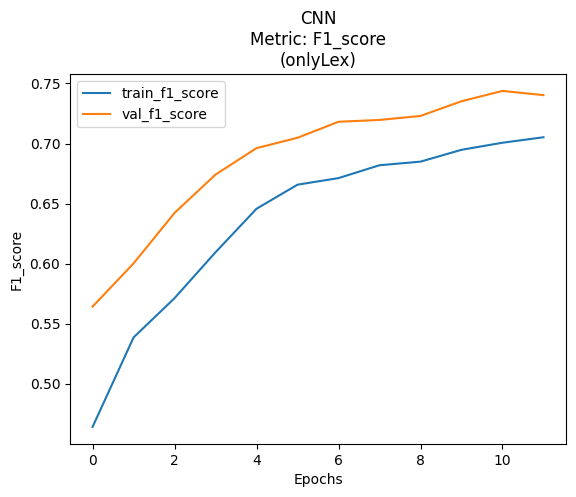

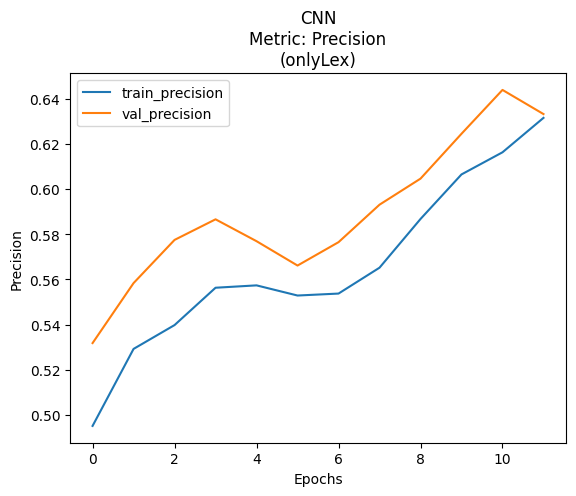

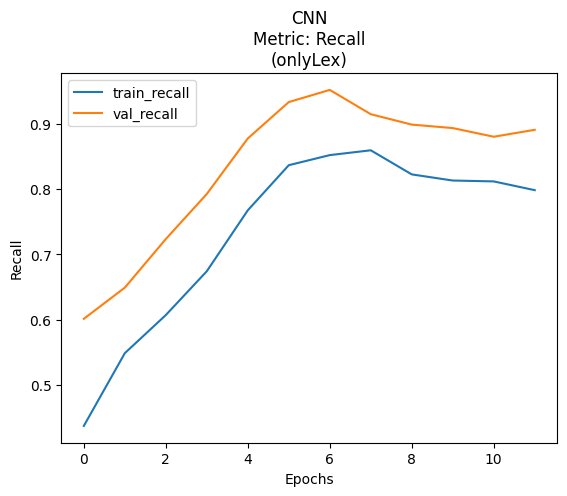



BiGRU

Epoch 1/12
119/119 [==============================] - 8s 18ms/step - loss: 0.7268 - accuracy: 0.5148 - f1_score: 0.3458 - precision_29: 0.5900 - recall_29: 0.2446 - val_loss: 0.6495 - val_accuracy: 0.6280 - val_f1_score: 0.6254 - val_precision_29: 0.6647 - val_recall_29: 0.5904
Epoch 2/12
119/119 [==============================] - 1s 9ms/step - loss: 0.6585 - accuracy: 0.6106 - f1_score: 0.5897 - precision_29: 0.6589 - recall_29: 0.5336 - val_loss: 0.6181 - val_accuracy: 0.6797 - val_f1_score: 0.7176 - val_precision_29: 0.6690 - val_recall_29: 0.7739
Epoch 3/12
119/119 [==============================] - 1s 10ms/step - loss: 0.6326 - accuracy: 0.6561 - f1_score: 0.6639 - precision_29: 0.6808 - recall_29: 0.6478 - val_loss: 0.5980 - val_accuracy: 0.6881 - val_f1_score: 0.7310 - val_precision_29: 0.6689 - val_recall_29: 0.8059
Epoch 4/12
119/119 [==============================] - 1s 11ms/step - loss: 0.6171 - accuracy: 0.6818 - f1_score: 0.7005 - precision_29: 0.6916 - recall_29:

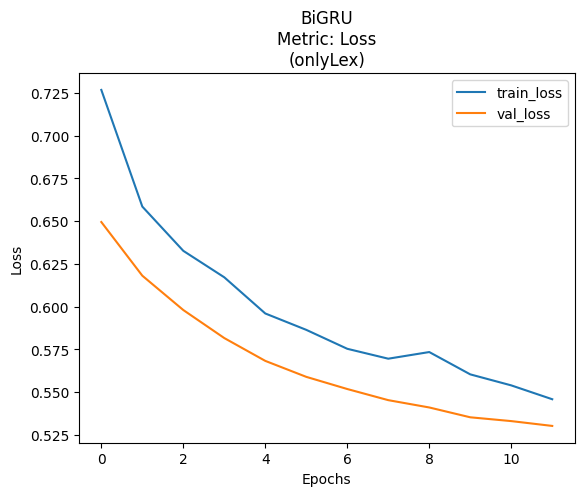

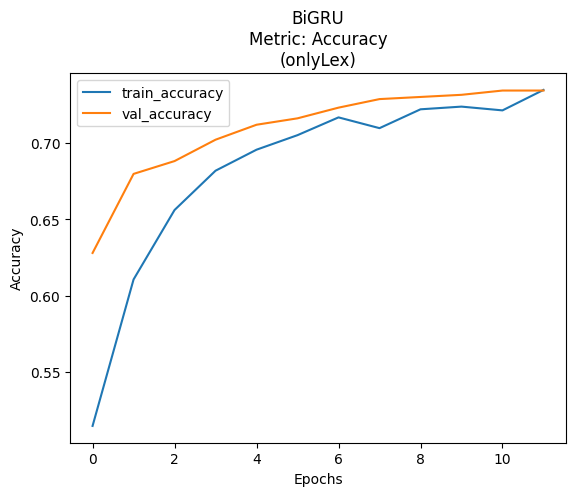

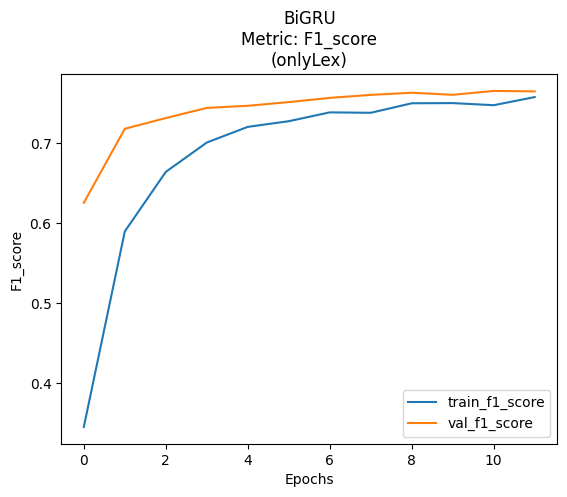

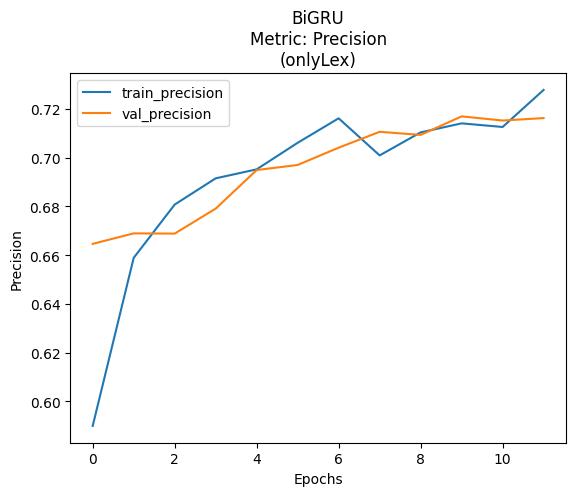

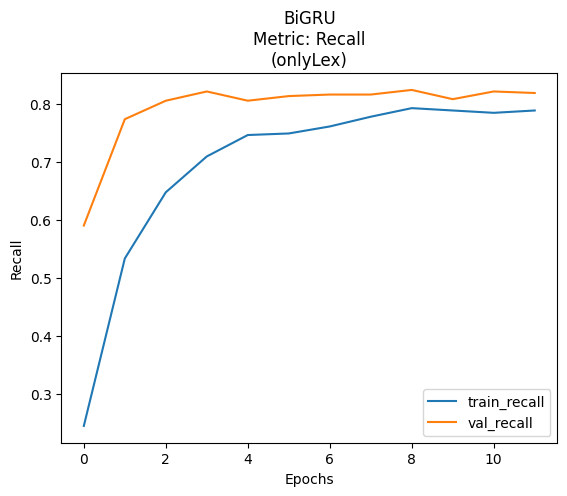

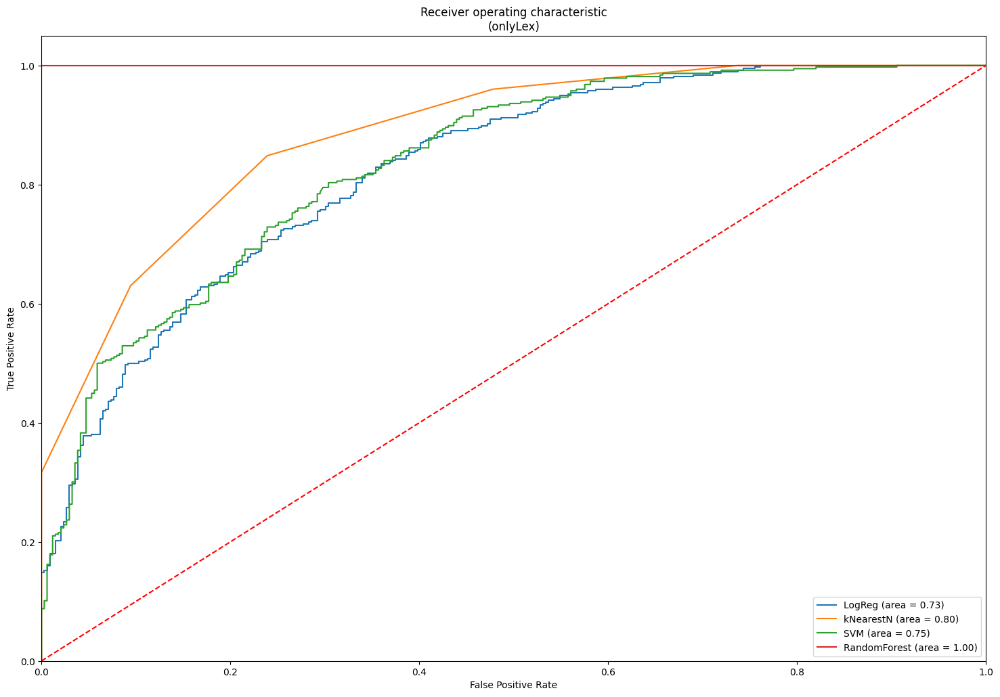

23/23 [==============================] - 0s 3ms/step


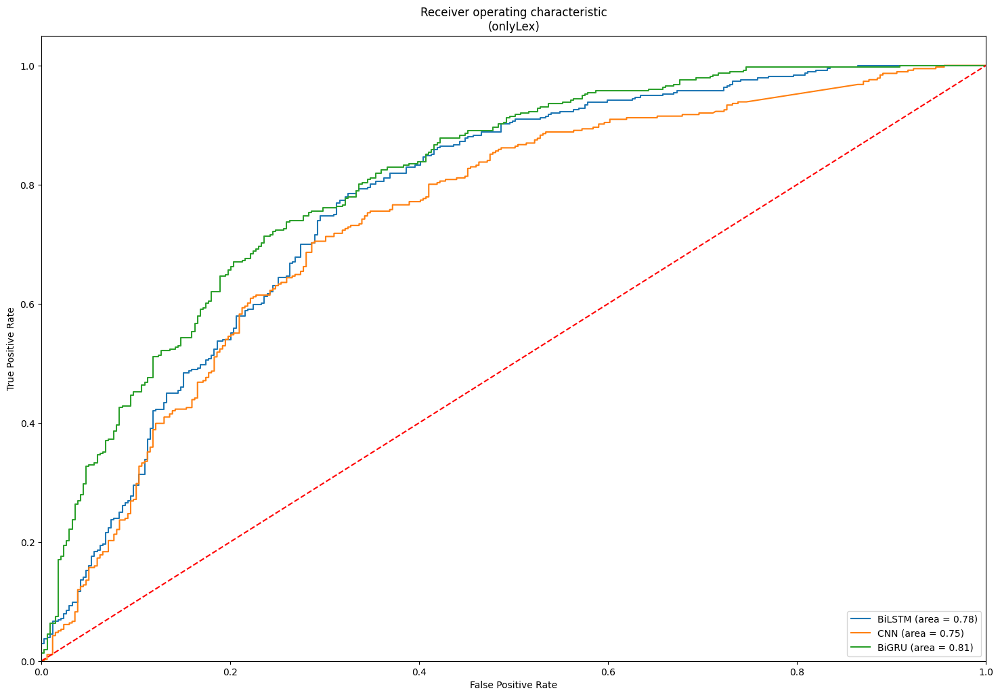

23/23 [==============================] - 0s 3ms/step


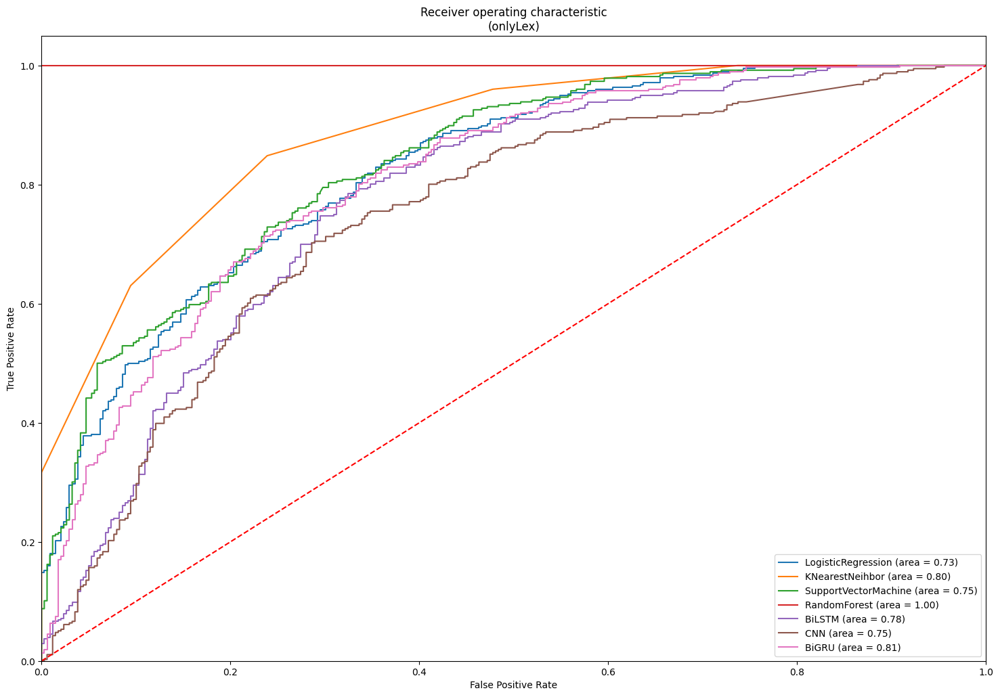

  adding: kaggle/working/results/Word2Vec/onlyLex/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLex/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLex/modelBiGRU/modelBiGRU_f1_score_onlyLex.png (deflated 16%)
  adding: kaggle/working/results/Word2Vec/onlyLex/modelBiGRU/modelBiGRU_recall_onlyLex.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/onlyLex/modelBiGRU/modelBiGRU_precision_onlyLex.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/onlyLex/modelBiGRU/modelBiGRU_accuracy_onlyLex.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyLex/modelBiGRU/modelBiGRU_loss_onlyLex.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyLex/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLex/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyLex/Algorithms/SupportVectorMachine/SVM_NoScaling_onlyLex.txt (deflated 52%)
  adding: kaggle/working/results/Wor

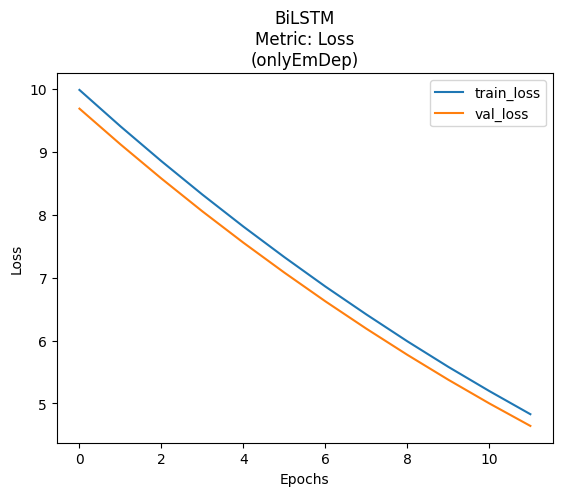

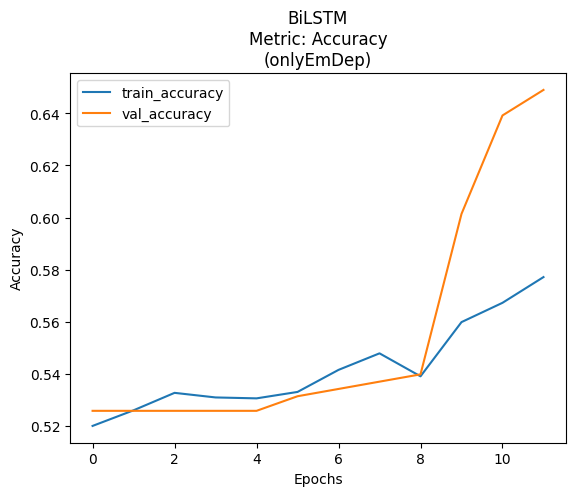

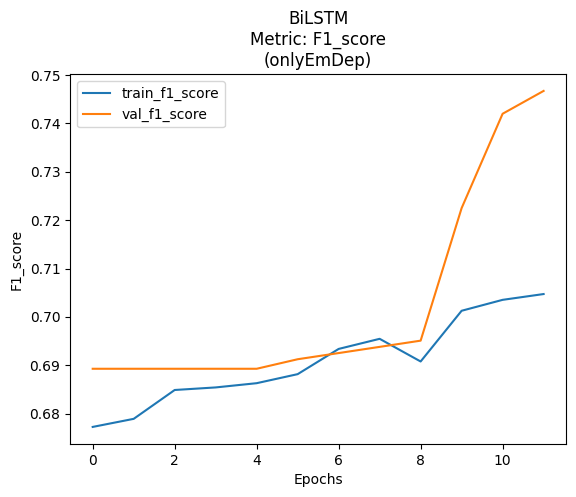

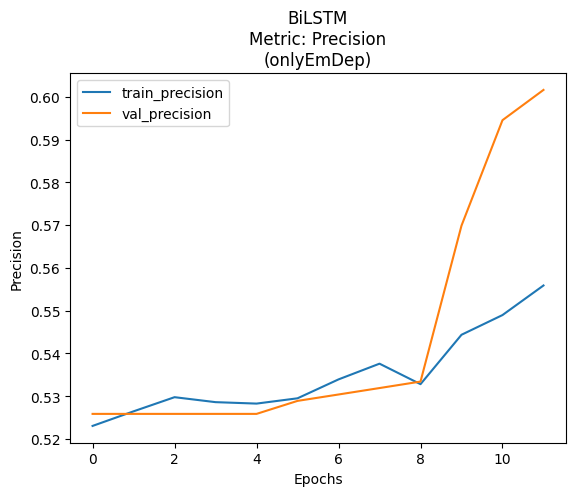

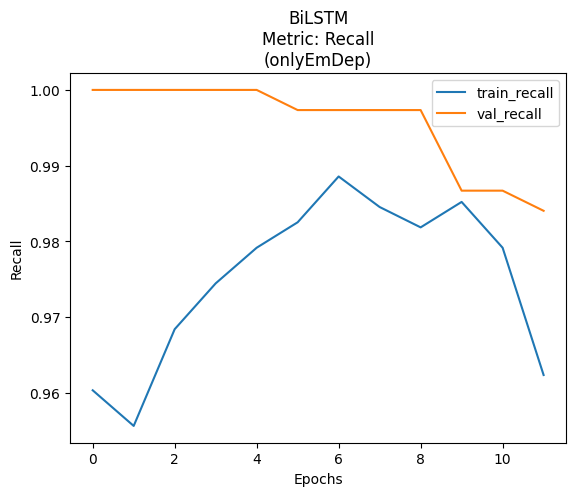



CNN

Epoch 1/12
119/119 [==============================] - 4s 12ms/step - loss: 0.6884 - accuracy: 0.5317 - f1_score: 0.6478 - precision_31: 0.5348 - recall_31: 0.8212 - val_loss: 0.6787 - val_accuracy: 0.5371 - val_f1_score: 0.6826 - val_precision_31: 0.5337 - val_recall_31: 0.9468
Epoch 2/12
119/119 [==============================] - 1s 6ms/step - loss: 0.6921 - accuracy: 0.5218 - f1_score: 0.6367 - precision_31: 0.5291 - recall_31: 0.7991 - val_loss: 0.6760 - val_accuracy: 0.5455 - val_f1_score: 0.6878 - val_precision_31: 0.5383 - val_recall_31: 0.9521
Epoch 3/12
119/119 [==============================] - 1s 6ms/step - loss: 0.6810 - accuracy: 0.5409 - f1_score: 0.6515 - precision_31: 0.5411 - recall_31: 0.8185 - val_loss: 0.6734 - val_accuracy: 0.5497 - val_f1_score: 0.6892 - val_precision_31: 0.5409 - val_recall_31: 0.9495
Epoch 4/12
119/119 [==============================] - 1s 6ms/step - loss: 0.6853 - accuracy: 0.5338 - f1_score: 0.6416 - precision_31: 0.5374 - recall_31: 0.7

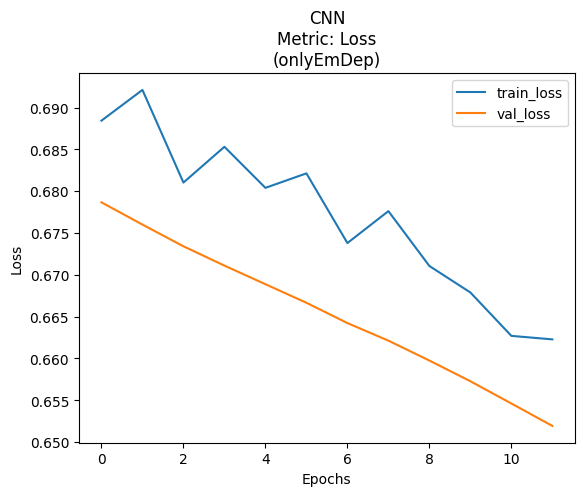

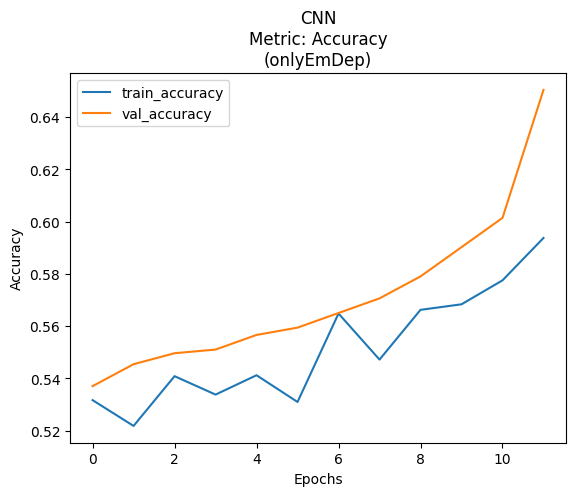

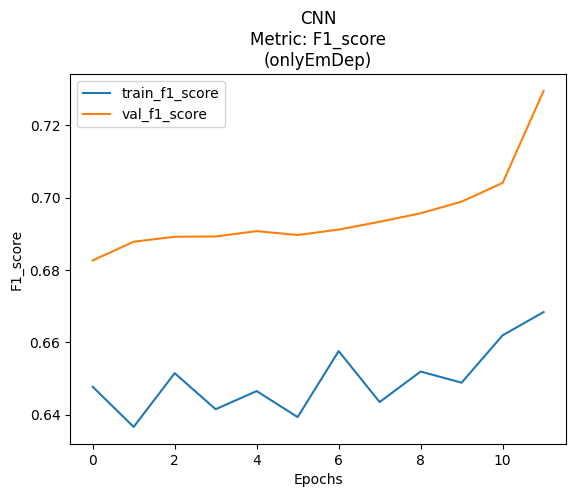

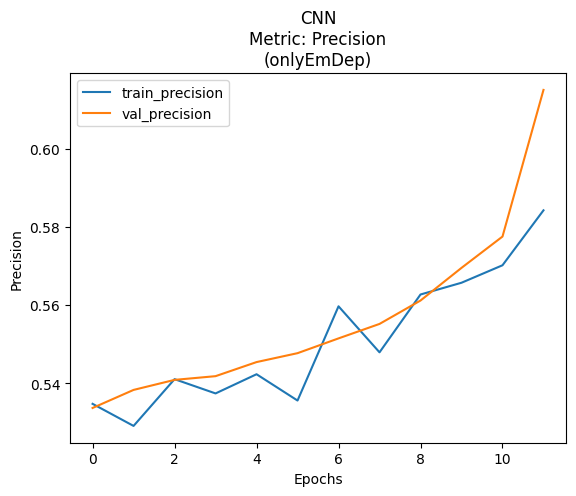

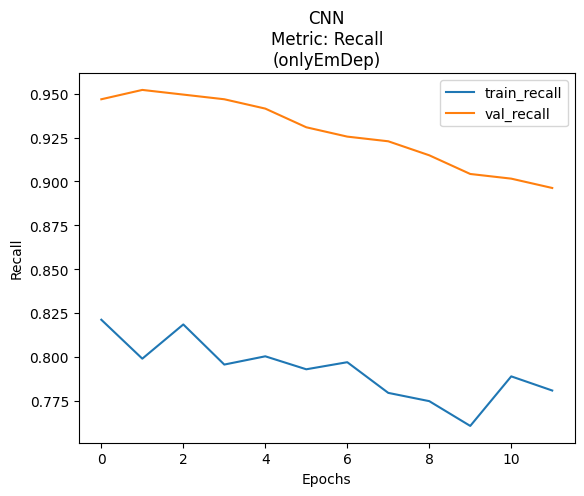



BiGRU

Epoch 1/12
119/119 [==============================] - 8s 18ms/step - loss: 0.6769 - accuracy: 0.5486 - f1_score: 0.6656 - precision_32: 0.5442 - recall_32: 0.8569 - val_loss: 0.6580 - val_accuracy: 0.6336 - val_f1_score: 0.7385 - val_precision_32: 0.5911 - val_recall_32: 0.9840
Epoch 2/12
119/119 [==============================] - 1s 10ms/step - loss: 0.6623 - accuracy: 0.6029 - f1_score: 0.6989 - precision_32: 0.5800 - recall_32: 0.8790 - val_loss: 0.6396 - val_accuracy: 0.6993 - val_f1_score: 0.7650 - val_precision_32: 0.6494 - val_recall_32: 0.9309
Epoch 3/12
119/119 [==============================] - 1s 10ms/step - loss: 0.6422 - accuracy: 0.6589 - f1_score: 0.7241 - precision_32: 0.6287 - recall_32: 0.8535 - val_loss: 0.6245 - val_accuracy: 0.7161 - val_f1_score: 0.7653 - val_precision_32: 0.6769 - val_recall_32: 0.8803
Epoch 4/12
119/119 [==============================] - 1s 10ms/step - loss: 0.6311 - accuracy: 0.6786 - f1_score: 0.7313 - precision_32: 0.6511 - recall_32

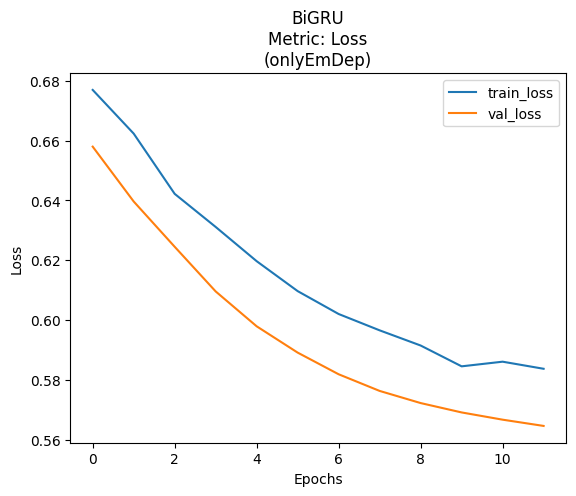

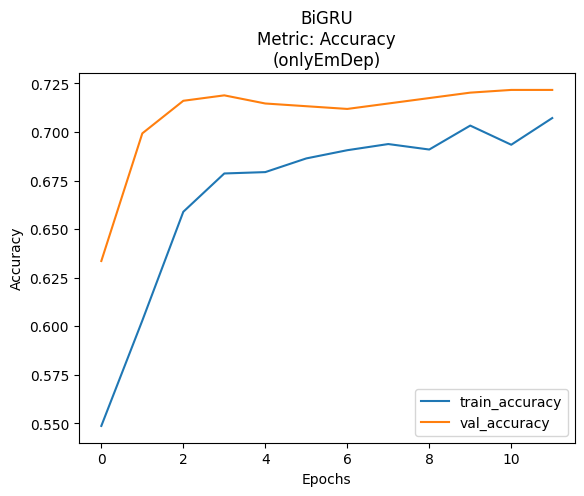

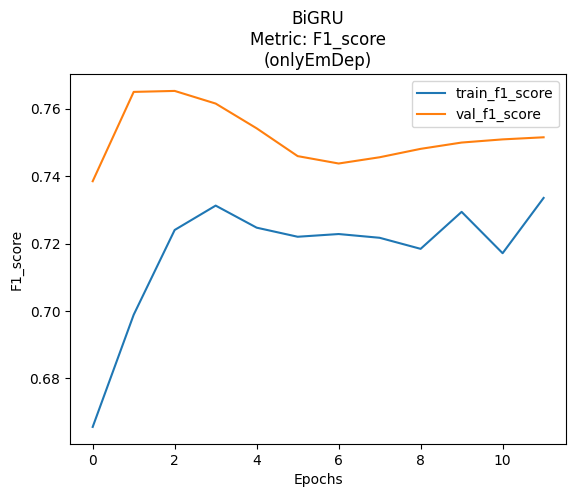

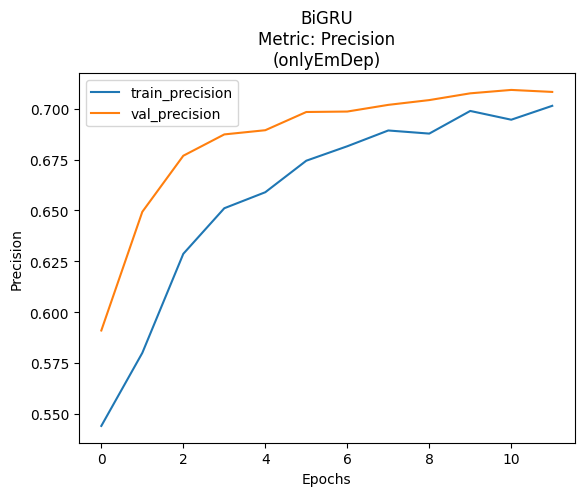

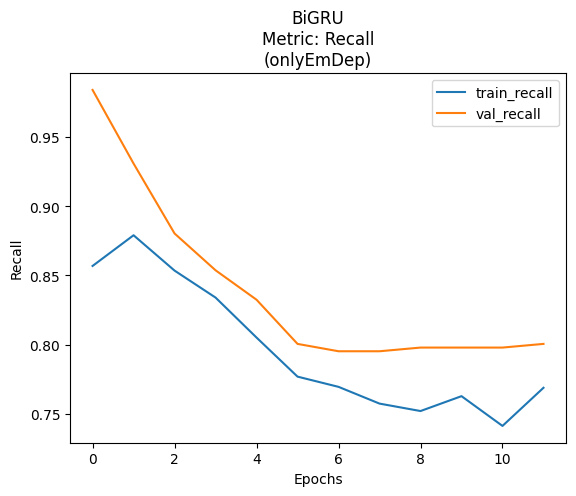

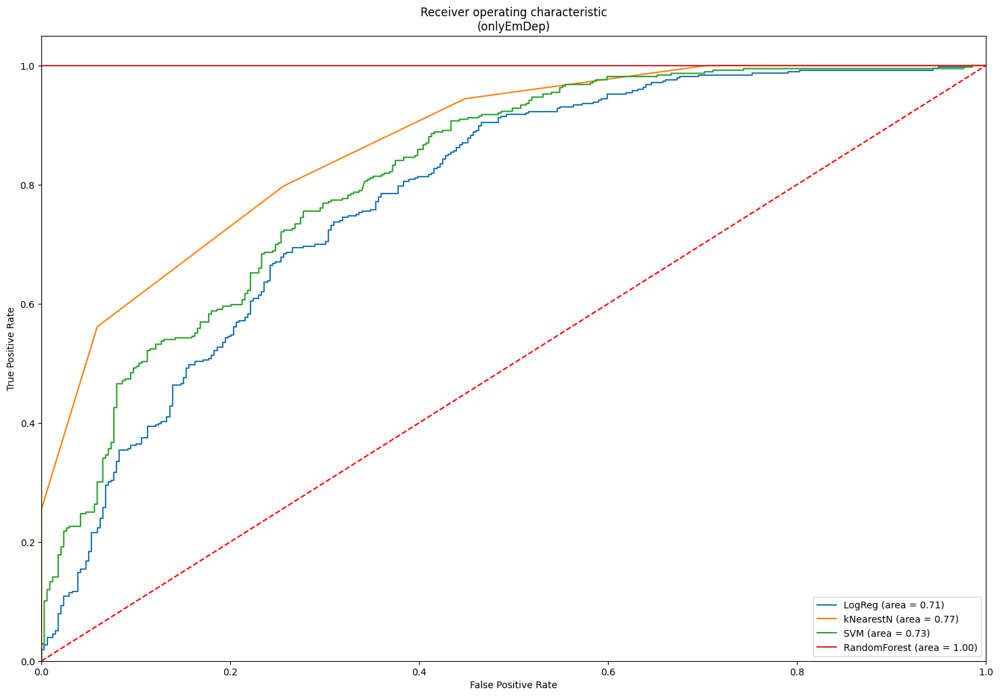

23/23 [==============================] - 0s 3ms/step


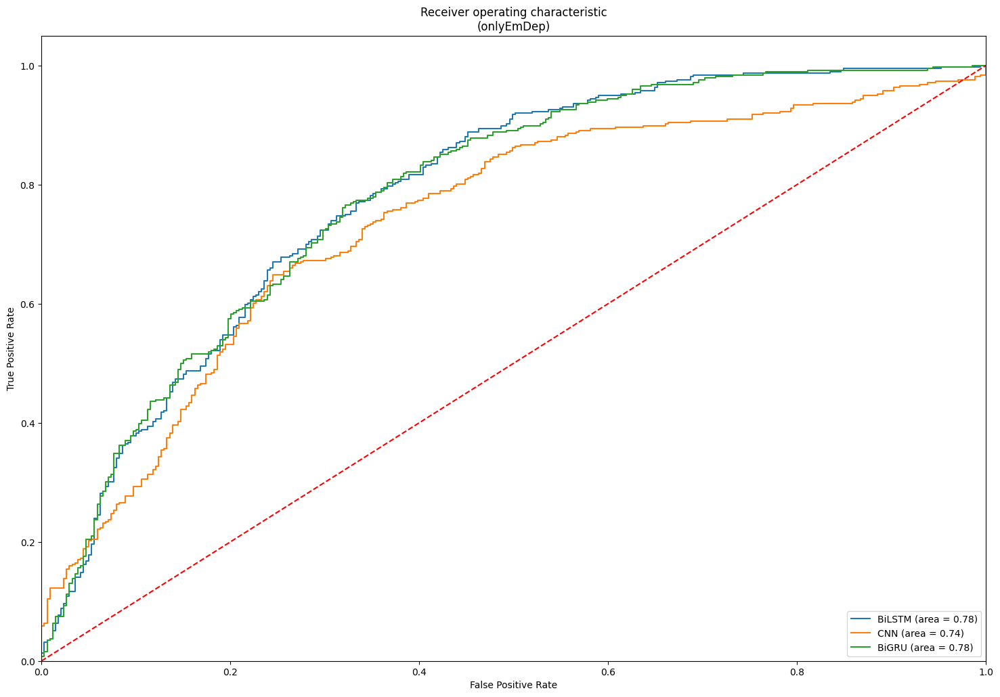

23/23 [==============================] - 0s 3ms/step


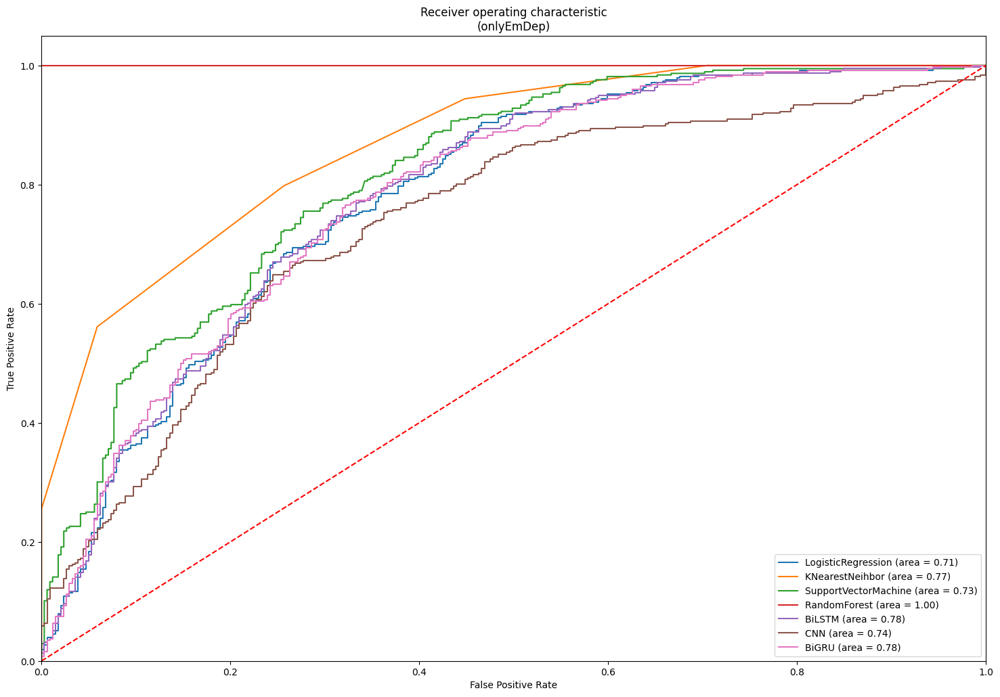

  adding: kaggle/working/results/Word2Vec/onlyEmDep/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/modelBiGRU/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/modelBiGRU/modelBiGRU_loss_onlyEmDep.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/modelBiGRU/modelBiGRU_precision_onlyEmDep.png (deflated 14%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/modelBiGRU/modelBiGRU_f1_score_onlyEmDep.png (deflated 13%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/modelBiGRU/modelBiGRU_accuracy_onlyEmDep.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/modelBiGRU/modelBiGRU_recall_onlyEmDep.png (deflated 15%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/ROC_onlyEmDep.png (deflated 22%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/Algorithms/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/onlyEmDep/Algorithms/SupportVectorMachine/ (stored 0%)
  adding: kaggle/working/results/Word2Vec/only

./
  stressTrainEmDep_BERTnWord2Vec_text.csv
  stressTestEmDep_BERTnWord2Vec_text.csv
./Word2Vec/
  GoogleNews-vectors-negative300.bin
./results/Word2Vec/DAL/
  ROC_DAL.png
  Word2Vec_DAL_Results.zip
./results/Word2Vec/DAL/Algorithms/
  ROC_DAL.png
./results/Word2Vec/DAL/Algorithms/KNearestNeighbors/
  KNN_noScaling_DAL.txt
./results/Word2Vec/DAL/Algorithms/LogisticRegression/
  LR_noScaling_DAL.txt
./results/Word2Vec/DAL/Algorithms/RandomForest/
  RF_Standard_DAL.txt
./results/Word2Vec/DAL/Algorithms/SupportVectorMachine/
  SVM_NoScaling_DAL.txt
./results/Word2Vec/DAL/NNs/
  ROC_DAL.png
./results/Word2Vec/DAL/NNs/modelBiGRU/
  modelBiGRU_evaluationScore_DAL.txt
  log_modelBiGRU_DAL.csv
./results/Word2Vec/DAL/NNs/modelBiLSTM/
  modelBiLSTM_evaluationScore_DAL.txt
  log_modelBiLSTM_DAL.csv
./results/Word2Vec/DAL/NNs/modelCNN/
  modelCNN_evaluationScore_DAL.txt
  log_modelCNN_DAL.csv
./results/Word2Vec/DAL/modelBiGRU/
  modelBiGRU_precision_DAL.png
  modelBiGRU_recall_DAL.png
  modelBiGRU_f1_score_DAL.png
  modelBiGRU_accuracy_DAL.png
  modelBiGRU_loss_DAL.png
./results/Word2Vec/DAL/modelBiLSTM/
  modelBiLSTM_precision_DAL.png
  modelBiLSTM_recall_DAL.png
  modelBiLSTM_f1_score_DAL.png
  modelBiLSTM_loss_DAL.png
  modelBiLSTM_accuracy_DAL.png
./results/Word2Vec/DAL/modelCNN/
  modelCNN_accuracy_DAL.png
  modelCNN_f1_score_DAL.png
  modelCNN_recall_DAL.png
  modelCNN_precision_DAL.png
  modelCNN_loss_DAL.png
./results/Word2Vec/EmDep/
  Word2Vec_EmDep_Results.zip
  ROC_EmDep.png
./results/Word2Vec/EmDep/Algorithms/
  ROC_EmDep.png
./results/Word2Vec/EmDep/Algorithms/KNearestNeighbors/
  KNN_noScaling_EmDep.txt
./results/Word2Vec/EmDep/Algorithms/LogisticRegression/
  LR_noScaling_EmDep.txt
./results/Word2Vec/EmDep/Algorithms/RandomForest/
  RF_Standard_EmDep.txt
./results/Word2Vec/EmDep/Algorithms/SupportVectorMachine/
  SVM_NoScaling_EmDep.txt
./results/Word2Vec/EmDep/NNs/
  ROC_EmDep.png
./results/Word2Vec/EmDep/NNs/modelBiGRU/
  modelBiGRU_evaluationScore_EmDep.txt
  log_modelBiGRU_EmDep.csv
./results/Word2Vec/EmDep/NNs/modelBiLSTM/
  log_modelBiLSTM_EmDep.csv
  modelBiLSTM_evaluationScore_EmDep.txt
./results/Word2Vec/EmDep/NNs/modelCNN/
  log_modelCNN_EmDep.csv
  modelCNN_evaluationScore_EmDep.txt
./results/Word2Vec/EmDep/modelBiGRU/
  modelBiGRU_loss_EmDep.png
  modelBiGRU_precision_EmDep.png
  modelBiGRU_recall_EmDep.png
  modelBiGRU_f1_score_EmDep.png
  modelBiGRU_accuracy_EmDep.png
./results/Word2Vec/EmDep/modelBiLSTM/
  modelBiLSTM_f1_score_EmDep.png
  modelBiLSTM_loss_EmDep.png
  modelBiLSTM_precision_EmDep.png
  modelBiLSTM_accuracy_EmDep.png
  modelBiLSTM_recall_EmDep.png
./results/Word2Vec/EmDep/modelCNN/
  modelCNN_accuracy_EmDep.png
  modelCNN_loss_EmDep.png
  modelCNN_precision_EmDep.png
  modelCNN_f1_score_EmDep.png
  modelCNN_recall_EmDep.png
./results/Word2Vec/LIWC/
  Word2Vec_LIWC_Results.zip
  ROC_LIWC.png
./results/Word2Vec/LIWC/Algorithms/
  ROC_LIWC.png
./results/Word2Vec/LIWC/Algorithms/KNearestNeighbors/
  KNN_noScaling_LIWC.txt
./results/Word2Vec/LIWC/Algorithms/LogisticRegression/
  LR_noScaling_LIWC.txt
./results/Word2Vec/LIWC/Algorithms/RandomForest/
  RF_Standard_LIWC.txt
./results/Word2Vec/LIWC/Algorithms/SupportVectorMachine/
  SVM_NoScaling_LIWC.txt
./results/Word2Vec/LIWC/NNs/
  ROC_LIWC.png
./results/Word2Vec/LIWC/NNs/modelBiGRU/
  log_modelBiGRU_LIWC.csv
  modelBiGRU_evaluationScore_LIWC.txt
./results/Word2Vec/LIWC/NNs/modelBiLSTM/
  modelBiLSTM_evaluationScore_LIWC.txt
  log_modelBiLSTM_LIWC.csv
./results/Word2Vec/LIWC/NNs/modelCNN/
  modelCNN_evaluationScore_LIWC.txt
  log_modelCNN_LIWC.csv
./results/Word2Vec/LIWC/modelBiGRU/
  modelBiGRU_precision_LIWC.png
  modelBiGRU_accuracy_LIWC.png
  modelBiGRU_loss_LIWC.png
  modelBiGRU_f1_score_LIWC.png
  modelBiGRU_recall_LIWC.png
./results/Word2Vec/LIWC/modelBiLSTM/
  modelBiLSTM_f1_score_LIWC.png
  modelBiLSTM_loss_LIWC.png
  modelBiLSTM_precision_LIWC.png
  modelBiLSTM_accuracy_LIWC.png
  modelBiLSTM_recall_LIWC.png
./results/Word2Vec/LIWC/modelCN

In [32]:
# run the imports and define functions
file_store_dir = "/kaggle/working/results"
if not os.path.exists(file_store_dir):
    os.makedirs(file_store_dir)

file_store_dir_BERT = "/kaggle/working/results/BERT"
if not os.path.exists(file_store_dir_BERT):
    os.makedirs(file_store_dir_BERT)

file_store_dir_Word2Vec = "/kaggle/working/results/Word2Vec"
if not os.path.exists(file_store_dir_Word2Vec):
    os.makedirs(file_store_dir_Word2Vec)

#---- Data ----
# Download the saved datasets
dataset_train_embs = "/kaggle/working/stressTrainEmDep_BERTnWord2Vec_text.csv"
dataset_test_embs = "/kaggle/working/stressTestEmDep_BERTnWord2Vec_text.csv"

if not os.path.exists(dataset_train_embs):
    !gdown 1IcrTBMXnXkcrBo543NDjGH7UT3QLYNa-
    !gdown 1mtp-OP249SJsj-LYTEFbHpArcRwpOqte


# BERT
train_df_embs = pd.read_csv(dataset_train_embs)
test_df_embs = pd.read_csv(dataset_test_embs)
BERT_feats_df_train = emb_feats_df(train_df_embs,train_df_embs["BERT"],BERT_EMB_OUT)
BERT_feats_df_test = emb_feats_df(test_df_embs, test_df_embs["BERT"],BERT_EMB_OUT)

# Word2Vec
train_df_embs = pd.read_csv(dataset_train_embs)
test_df_embs = pd.read_csv(dataset_test_embs)
Word2Vec_feats_df_train = emb_feats_df(train_df_embs, train_df_embs["Word2Vec"], Word2Vec_EMB_OUT)
Word2Vec_feats_df_test = emb_feats_df(train_df_embs, test_df_embs["Word2Vec"], Word2Vec_EMB_OUT)


# print("\n\n\nBERT Sentence Embeddings\n")
# best_models_BERT,best_model_types_BERT = run_all_feats(file_store_dir_BERT, BERT_feats_df_train, BERT_feats_df_test, "BERT")
# ROC_curves_NNsAlgos(best_models_BERT,best_model_types_BERT,testX_orig,testY_orig,testX_algo,testY_algo,file_store_dir_BERT,"BERT",class_num)

print("\n\n\nWord2Vec Google News Sentence Embeddings\n")
best_models_Word2Vec,best_model_types_Word2Vec  = run_all_feats(file_store_dir_Word2Vec, Word2Vec_feats_df_train, Word2Vec_feats_df_test, "Word2Vec")
# ROC_curves_NNsAlgos(best_models_Word2Vec,best_model_types_Word2Vec,testX_orig,testY_orig,testX_algo,testY_algo,file_store_dir_Word2Vec,"Word2Vec",class_num)


# Display all file links to download
FileLinks(".")

In [29]:
# Path to Word2Vec model
Word2Vec_path = "/kaggle/working/Word2Vec/"
Word2Vec_news = os.path.join(Word2Vec_path, "GoogleNews-vectors-negative300.bin.gz")

# Embedding dimension
Word2Vec_EMB_OUT = 300


In [23]:
import os
import pandas as pd

# Define dataset paths
dataset_train_embs = "/kaggle/working/stressTrainEmDep_BERTnWord2Vec_text.csv"
dataset_test_embs = "/kaggle/working/stressTestEmDep_BERTnWord2Vec_text.csv"

# Check if datasets exist; if not, download them
if not os.path.exists(dataset_train_embs):
    !gdown --id 19ZMTk5ZwmyL_eVVhXGC_kAdFTReu25Nm -O /kaggle/working/stressTrainEmDep_BERTnWord2Vec_text.csv
if not os.path.exists(dataset_test_embs):
    !gdown --id 1XcaYJ78vXov-yhyBFDUWx2rH7DbeKx5k -O /kaggle/working/stressTestEmDep_BERTnWord2Vec_text.csv

# Load datasets
train_df = pd.read_csv(dataset_train_embs)
test_df = pd.read_csv(dataset_test_embs)

# Define results folder
results_dir = "/kaggle/working/results"
if not os.path.exists(results_dir):
    os.makedirs(results_dir)


/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=19ZMTk5ZwmyL_eVVhXGC_kAdFTReu25Nm
To: /kaggle/working/stressTrainEmDep_BERTnWord2Vec_text.csv
100% 68.4M/68.4M [00:00<00:00, 92.8MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1XcaYJ78vXov-yhyBFDUWx2rH7DbeKx5k
To: /kaggle/working/stressTestEmDep_BERTnWord2Vec_text.csv
100% 17.2M/17.2M [00:00<00:00, 91.7MB/s]


In [33]:
zipname=os.path.join("/kaggle/working",f"Results_final.zip")
!zip -r {zipname} /kaggle/working

# Display all file links to download
FileLinks(".")

  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/Word2Vec/ (stored 0%)
  adding: kaggle/working/Word2Vec/GoogleNews-vectors-negative300.bin


zip error: Interrupted (aborting)


./
  stressTrainEmDep_BERTnWord2Vec_text.csv
  stressTestEmDep_BERTnWord2Vec_text.csv
./Word2Vec/
  GoogleNews-vectors-negative300.bin
./results/Word2Vec/DAL/
  ROC_DAL.png
  Word2Vec_DAL_Results.zip
./results/Word2Vec/DAL/Algorithms/
  ROC_DAL.png
./results/Word2Vec/DAL/Algorithms/KNearestNeighbors/
  KNN_noScaling_DAL.txt
./results/Word2Vec/DAL/Algorithms/LogisticRegression/
  LR_noScaling_DAL.txt
./results/Word2Vec/DAL/Algorithms/RandomForest/
  RF_Standard_DAL.txt
./results/Word2Vec/DAL/Algorithms/SupportVectorMachine/
  SVM_NoScaling_DAL.txt
./results/Word2Vec/DAL/NNs/
  ROC_DAL.png
./results/Word2Vec/DAL/NNs/modelBiGRU/
  modelBiGRU_evaluationScore_DAL.txt
  log_modelBiGRU_DAL.csv
./results/Word2Vec/DAL/NNs/modelBiLSTM/
  modelBiLSTM_evaluationScore_DAL.txt
  log_modelBiLSTM_DAL.csv
./results/Word2Vec/DAL/NNs/modelCNN/
  modelCNN_evaluationScore_DAL.txt
  log_modelCNN_DAL.csv
./results/Word2Vec/DAL/modelBiGRU/
  modelBiGRU_precision_DAL.png
  modelBiGRU_recall_DAL.png
  modelBiGRU_f1_score_DAL.png
  modelBiGRU_accuracy_DAL.png
  modelBiGRU_loss_DAL.png
./results/Word2Vec/DAL/modelBiLSTM/
  modelBiLSTM_precision_DAL.png
  modelBiLSTM_recall_DAL.png
  modelBiLSTM_f1_score_DAL.png
  modelBiLSTM_loss_DAL.png
  modelBiLSTM_accuracy_DAL.png
./results/Word2Vec/DAL/modelCNN/
  modelCNN_accuracy_DAL.png
  modelCNN_f1_score_DAL.png
  modelCNN_recall_DAL.png
  modelCNN_precision_DAL.png
  modelCNN_loss_DAL.png
./results/Word2Vec/EmDep/
  Word2Vec_EmDep_Results.zip
  ROC_EmDep.png
./results/Word2Vec/EmDep/Algorithms/
  ROC_EmDep.png
./results/Word2Vec/EmDep/Algorithms/KNearestNeighbors/
  KNN_noScaling_EmDep.txt
./results/Word2Vec/EmDep/Algorithms/LogisticRegression/
  LR_noScaling_EmDep.txt
./results/Word2Vec/EmDep/Algorithms/RandomForest/
  RF_Standard_EmDep.txt
./results/Word2Vec/EmDep/Algorithms/SupportVectorMachine/
  SVM_NoScaling_EmDep.txt
./results/Word2Vec/EmDep/NNs/
  ROC_EmDep.png
./results/Word2Vec/EmDep/NNs/modelBiGRU/
  modelBiGRU_evaluationScore_EmDep.txt
  log_modelBiGRU_EmDep.csv
./results/Word2Vec/EmDep/NNs/modelBiLSTM/
  log_modelBiLSTM_EmDep.csv
  modelBiLSTM_evaluationScore_EmDep.txt
./results/Word2Vec/EmDep/NNs/modelCNN/
  log_modelCNN_EmDep.csv
  modelCNN_evaluationScore_EmDep.txt
./results/Word2Vec/EmDep/modelBiGRU/
  modelBiGRU_loss_EmDep.png
  modelBiGRU_precision_EmDep.png
  modelBiGRU_recall_EmDep.png
  modelBiGRU_f1_score_EmDep.png
  modelBiGRU_accuracy_EmDep.png
./results/Word2Vec/EmDep/modelBiLSTM/
  modelBiLSTM_f1_score_EmDep.png
  modelBiLSTM_loss_EmDep.png
  modelBiLSTM_precision_EmDep.png
  modelBiLSTM_accuracy_EmDep.png
  modelBiLSTM_recall_EmDep.png
./results/Word2Vec/EmDep/modelCNN/
  modelCNN_accuracy_EmDep.png
  modelCNN_loss_EmDep.png
  modelCNN_precision_EmDep.png
  modelCNN_f1_score_EmDep.png
  modelCNN_recall_EmDep.png
./results/Word2Vec/LIWC/
  Word2Vec_LIWC_Results.zip
  ROC_LIWC.png
./results/Word2Vec/LIWC/Algorithms/
  ROC_LIWC.png
./results/Word2Vec/LIWC/Algorithms/KNearestNeighbors/
  KNN_noScaling_LIWC.txt
./results/Word2Vec/LIWC/Algorithms/LogisticRegression/
  LR_noScaling_LIWC.txt
./results/Word2Vec/LIWC/Algorithms/RandomForest/
  RF_Standard_LIWC.txt
./results/Word2Vec/LIWC/Algorithms/SupportVectorMachine/
  SVM_NoScaling_LIWC.txt
./results/Word2Vec/LIWC/NNs/
  ROC_LIWC.png
./results/Word2Vec/LIWC/NNs/modelBiGRU/
  log_modelBiGRU_LIWC.csv
  modelBiGRU_evaluationScore_LIWC.txt
./results/Word2Vec/LIWC/NNs/modelBiLSTM/
  modelBiLSTM_evaluationScore_LIWC.txt
  log_modelBiLSTM_LIWC.csv
./results/Word2Vec/LIWC/NNs/modelCNN/
  modelCNN_evaluationScore_LIWC.txt
  log_modelCNN_LIWC.csv
./results/Word2Vec/LIWC/modelBiGRU/
  modelBiGRU_precision_LIWC.png
  modelBiGRU_accuracy_LIWC.png
  modelBiGRU_loss_LIWC.png
  modelBiGRU_f1_score_LIWC.png
  modelBiGRU_recall_LIWC.png
./results/Word2Vec/LIWC/modelBiLSTM/
  modelBiLSTM_f1_score_LIWC.png
  modelBiLSTM_loss_LIWC.png
  modelBiLSTM_precision_LIWC.png
  modelBiLSTM_accuracy_LIWC.png
  modelBiLSTM_recall_LIWC.png
./results/Word2Vec/LIWC/modelCN